<a href="https://colab.research.google.com/github/Zubbek/Coronary_Heart_Disease_Prediction/blob/main/CHD_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# **Read Dataset from xlsx file**


In [ ]:
data = pd.read_excel('Z-Alizadeh-sani-dataset.xlsx')

In [ ]:
data.shape

# **Print dataset**

In [ ]:
data.head()

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,Cad
1,67,70,157,Fmale,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,Cad
3,66,67,158,Fmale,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,Normal
4,50,87,153,Fmale,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,Normal


In [ ]:
data

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,Cad
1,67,70,157,Fmale,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,Cad
3,66,67,158,Fmale,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,Normal
4,50,87,153,Fmale,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,58,84,168,Male,29.761905,0,0,0,0,0,...,4.8,146,8500,34,58,251,45,0,N,Cad
299,55,64,152,Fmale,27.700831,0,0,0,0,0,...,4.0,139,11400,16,80,377,40,0,mild,Normal
300,48,77,160,Fmale,30.078125,0,1,0,0,1,...,4.0,140,9000,35,55,279,55,0,N,Normal
301,57,90,159,Fmale,35.599858,1,0,0,0,0,...,3.8,141,3800,48,40,208,55,0,N,Normal


# **Start with preproccessing our data from dataset**

1.   Shearching for missing values, Nan, Null, duplicates etc.
2.   Datatypes changing/formating
3.   Feature Scailing


# **Check if there are missing values in our dataset**





In [ ]:
preproccessing_data = data

In [ ]:
preproccessing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 56 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    303 non-null    int64  
 1   Weight                 303 non-null    int64  
 2   Length                 303 non-null    int64  
 3   Sex                    303 non-null    object 
 4   BMI                    303 non-null    float64
 5   DM                     303 non-null    int64  
 6   HTN                    303 non-null    int64  
 7   Current Smoker         303 non-null    int64  
 8   EX-Smoker              303 non-null    int64  
 9   FH                     303 non-null    int64  
 10  Obesity                303 non-null    object 
 11  CRF                    303 non-null    object 
 12  CVA                    303 non-null    object 
 13  Airway disease         303 non-null    object 
 14  Thyroid Disease        303 non-null    object 
 15  CHF   

In [ ]:
preproccessing_data.isnull().sum()

,0
Age,0
Weight,0
Length,0
Sex,0
BMI,0
DM,0
HTN,0
Current Smoker,0
EX-Smoker,0
FH,0


In [ ]:
import missingno as msno
import matplotlib.pyplot as plt

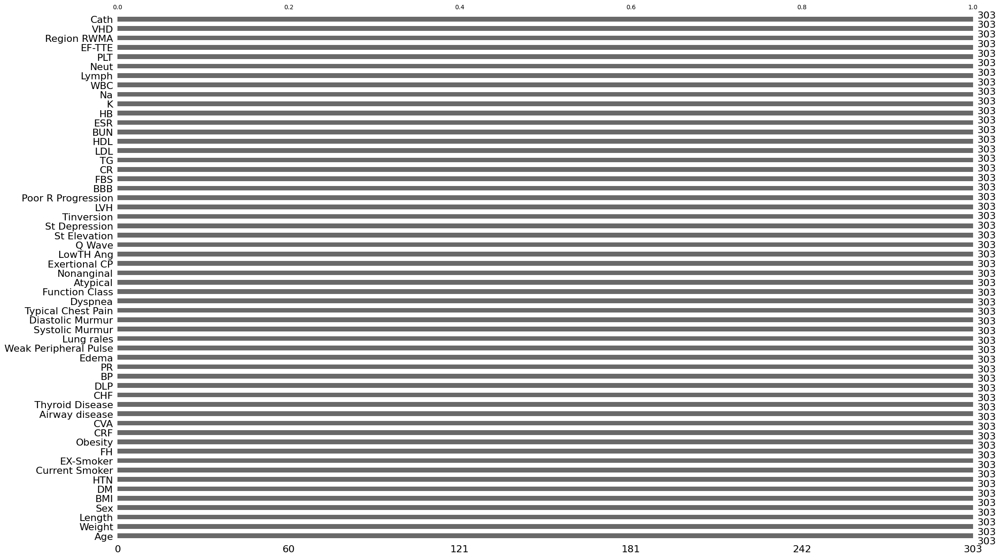

In [ ]:
msno.bar(preproccessing_data)
plt.show()

# **Chech if there are any duplicates in our dataset**

In [ ]:
preproccessing_data.duplicated().sum()

0

# **Check if there are only one unique value in each column in our dataset**

In [ ]:
for column in preproccessing_data.columns:
    if preproccessing_data[column].nunique() < 2:
        print(f"Column '{column}' has only one unique value: {preproccessing_data[column].unique()[0]}")

Column 'Exertional CP' has only one unique value: N


Because of that we can easily get rid of this column from our dataset

In [ ]:
preproccessing_data = preproccessing_data.drop('Exertional CP', axis=1)
preproccessing_data.head()

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA,VHD,Cath
0,53,90,175,Male,29.387755,0,1,1,0,0,...,4.7,141,5700,39,52,261,50,0,N,Cad
1,67,70,157,Fmale,28.398718,0,1,0,0,0,...,4.7,156,7700,38,55,165,40,4,N,Cad
2,54,54,164,Male,20.077335,0,0,1,0,0,...,4.7,139,7400,38,60,230,40,2,mild,Cad
3,66,67,158,Fmale,26.838648,0,1,0,0,0,...,4.4,142,13000,18,72,742,55,0,Severe,Normal
4,50,87,153,Fmale,37.165193,0,1,0,0,0,...,4.0,140,9200,55,39,274,50,0,Severe,Normal


# **Check how many people had Normal state and how many had Cad**

In [ ]:
preproccessing_data['Cath'].value_counts()

,count
Cath,
Cad,216
Normal,87


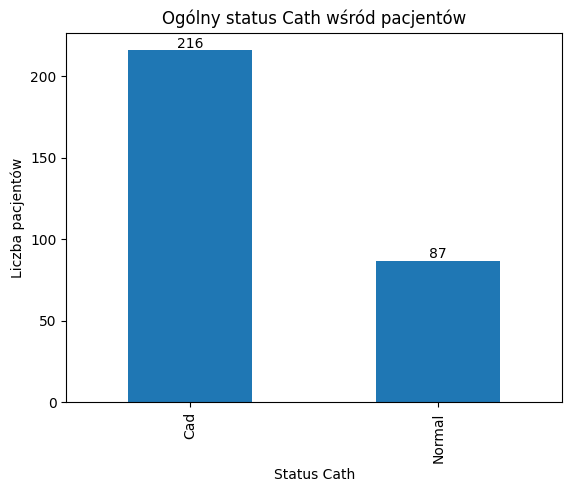

In [ ]:
preproccessing_data['Cath'].value_counts().plot(kind='bar').set_title('Ogólny status Cath wśród pacjentów')
plt.xlabel('Status Cath')
plt.ylabel('Liczba pacjentów')
for index, value in enumerate(preproccessing_data['Cath'].value_counts()):
    plt.text(index, value + 1.5, str(value), ha='center')
plt.show()

In [ ]:
percentage = preproccessing_data['Cath'].value_counts(normalize=True) * 100
print(percentage)

Cath
Cad       71.287129
Normal    28.712871
Name: proportion, dtype: float64


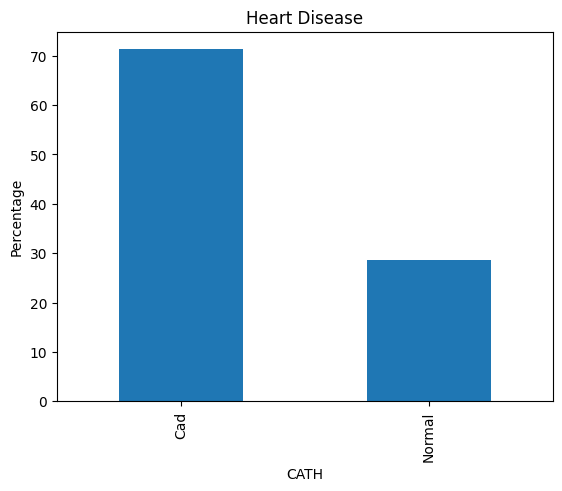

In [ ]:
percentage.plot(kind='bar').set_title('Heart Disease')
plt.xlabel('CATH')
plt.ylabel('Percentage')
plt.show()

# **Grouping Features by data-type**

In [ ]:
#features that have int or float datatype
numerical_features = [feature for feature in preproccessing_data.select_dtypes(include=['int64', 'float64']) if preproccessing_data[feature].nunique() > 2]

binary_numerical_features = [feature for feature in preproccessing_data.select_dtypes(include=['int64', 'float64']) if preproccessing_data[feature].nunique() == 2]

#features that have only 2 unique values which we can represent like 0 or 1
binary_features = [feature for feature in preproccessing_data.columns if preproccessing_data[feature].dtype == "object" and preproccessing_data[feature].nunique() == 2]

#features that have more than 2 unique values
categorical_features = [feature for feature in preproccessing_data.columns if feature not in numerical_features and feature not in binary_features and feature not in binary_numerical_features]

print("Numerical features:", numerical_features)
print("Binary numerical features:", binary_numerical_features)
print("Binary features:", binary_features)
print("Categorical features:", categorical_features)

print("Count of Numerical Fetures: ", len(numerical_features))
print("Count of Binary Numerical Fetures: ", len(binary_numerical_features))
print("Count of Binary Fetures: ", len(binary_features))
print("Count of Categorical Fetures: ", len(categorical_features))

Numerical features: ['Age', 'Weight', 'Length', 'BMI', 'BP', 'PR', 'Function Class', 'FBS', 'CR', 'TG', 'LDL', 'HDL', 'BUN', 'ESR', 'HB', 'K', 'Na', 'WBC', 'Lymph', 'Neut', 'PLT', 'EF-TTE', 'Region RWMA']
Binary numerical features: ['DM', 'HTN', 'Current Smoker', 'EX-Smoker', 'FH', 'Edema', 'Typical Chest Pain', 'Q Wave', 'St Elevation', 'St Depression', 'Tinversion']
Binary features: ['Sex', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Dyspnea', 'Atypical', 'Nonanginal', 'LowTH Ang', 'LVH', 'Poor R Progression', 'Cath']
Categorical features: ['BBB', 'VHD']
Count of Numerical Fetures:  23
Count of Binary Numerical Fetures:  11
Count of Binary Fetures:  19
Count of Categorical Fetures:  2


In [ ]:
preproccessing_data[numerical_features].describe().round(2)

,Age,Weight,Length,BMI,BP,PR,Function Class,FBS,CR,TG,...,ESR,HB,K,Na,WBC,Lymph,Neut,PLT,EF-TTE,Region RWMA
count,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,...,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00
mean,58.90,73.83,164.72,27.25,129.55,75.14,0.66,119.18,1.06,150.34,...,19.46,13.15,4.23,141.00,7562.05,32.40,60.15,221.49,47.23,0.62
std,10.39,11.99,9.33,4.10,18.94,8.91,1.03,52.08,0.26,97.96,...,15.94,1.61,0.46,3.81,2413.74,9.97,10.18,60.80,8.93,1.13
min,30.00,48.00,140.00,18.12,90.00,50.00,0.00,62.00,0.50,37.00,...,1.00,8.90,3.00,128.00,3700.00,7.00,32.00,25.00,15.00,0.00
25%,51.00,65.00,158.00,24.51,120.00,70.00,0.00,88.50,0.90,90.00,...,9.00,12.20,3.90,139.00,5800.00,26.00,52.50,183.50,45.00,0.00
50%,58.00,74.00,165.00,26.78,130.00,70.00,0.00,98.00,1.00,122.00,...,15.00,13.20,4.20,141.00,7100.00,32.00,60.00,210.00,50.00,0.00
75%,66.00,81.00,171.00,29.41,140.00,80.00,2.00,130.00,1.20,177.00,...,26.00,14.20,4.50,143.00,8800.00,39.00,67.00,250.00,55.00,1.00
max,86.00,120.00,188.00,40.90,190.00,110.00,3.00,400.00,2.20,1050.00,...,90.00,17.60,6.60,156.00,18000.00,60.00,89.00,742.00,60.00,4.00


# **Calculate min, max, mean and std for numerical features**

In [ ]:
for feature in numerical_features:
  print(f"Feature: {feature}")
  print(f"Min: {preproccessing_data[feature].min()}")
  print(f"Max: {preproccessing_data[feature].max()}")
  print(f"Mean: {preproccessing_data[feature].mean()}")
  print(f"Std: {preproccessing_data[feature].std()}")
  print()


Feature: Age
Min: 30
Max: 86
Mean: 58.897689768976896
Std: 10.392277504534439

Feature: Weight
Min: 48
Max: 120
Mean: 73.83168316831683
Std: 11.987357556913805

Feature: Length
Min: 140
Max: 188
Mean: 164.7161716171617
Std: 9.32766141185231

Feature: BMI
Min: 18.115412710007302
Max: 40.90065778377467
Mean: 27.248338858149047
Std: 4.098865084776584

Feature: BP
Min: 90
Max: 190
Mean: 129.55445544554456
Std: 18.938105135143843

Feature: PR
Min: 50
Max: 110
Mean: 75.14191419141915
Std: 8.911800661242637

Feature: Function Class
Min: 0
Max: 3
Mean: 0.6633663366336634
Std: 1.0320419005827202

Feature: FBS
Min: 62
Max: 400
Mean: 119.18481848184818
Std: 52.079652767030716

Feature: CR
Min: 0.5
Max: 2.2
Mean: 1.0556105610561057
Std: 0.264296279451307

Feature: TG
Min: 37
Max: 1050
Mean: 150.34323432343234
Std: 97.9594507208518

Feature: LDL
Min: 18
Max: 232
Mean: 104.64356435643565
Std: 35.39668788292357

Feature: HDL
Min: 15.9
Max: 111.0
Mean: 40.23399339933993
Std: 10.55907692571349

Feature

In [ ]:
for feature in binary_numerical_features:
  print(f"Feature: {feature}")
  print(f"Min: {preproccessing_data[feature].min()}")
  print(f"Max: {preproccessing_data[feature].max()}")
  print(f"Mean: {preproccessing_data[feature].mean()}")
  print(f"Std: {preproccessing_data[feature].std()}")
  print()


Feature: DM
Min: 0
Max: 1
Mean: 0.297029702970297
Std: 0.4577056470917876

Feature: HTN
Min: 0
Max: 1
Mean: 0.5907590759075908
Std: 0.4925071869329421

Feature: Current Smoker
Min: 0
Max: 1
Mean: 0.2079207920792079
Std: 0.4064911641758206

Feature: EX-Smoker
Min: 0
Max: 1
Mean: 0.033003300330033
Std: 0.17894065571361234

Feature: FH
Min: 0
Max: 1
Mean: 0.15841584158415842
Std: 0.36573449460355084

Feature: Edema
Min: 0
Max: 1
Mean: 0.039603960396039604
Std: 0.19534951250833277

Feature: Typical Chest Pain
Min: 0
Max: 1
Mean: 0.5412541254125413
Std: 0.4991195009875267

Feature: Q Wave
Min: 0
Max: 1
Mean: 0.052805280528052806
Std: 0.22401451223944763

Feature: St Elevation
Min: 0
Max: 1
Mean: 0.0462046204620462
Std: 0.21027524782087567

Feature: St Depression
Min: 0
Max: 1
Mean: 0.23432343234323433
Std: 0.4242759172820586

Feature: Tinversion
Min: 0
Max: 1
Mean: 0.297029702970297
Std: 0.4577056470917878



# **Checking the distribution for numerical data**

In [ ]:
import seaborn as sns

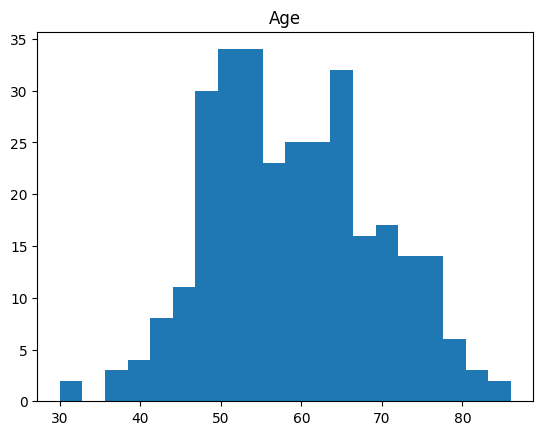

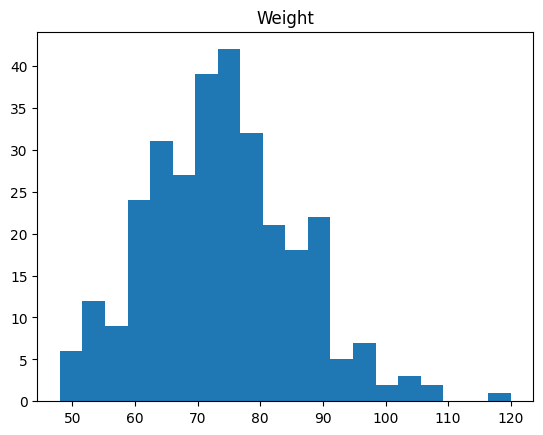

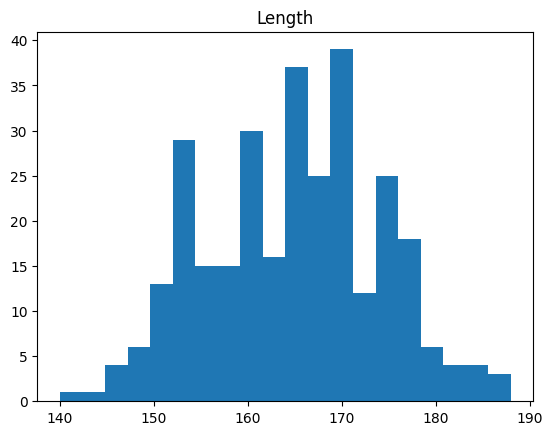

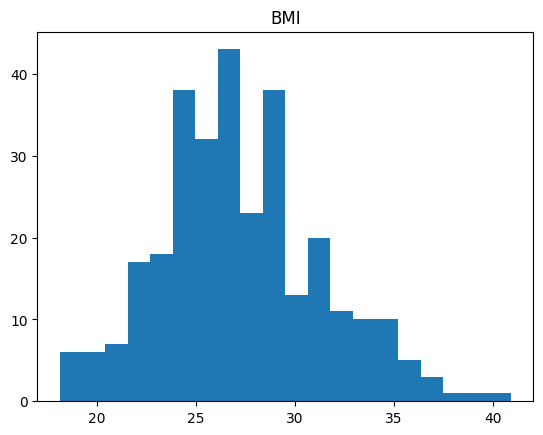

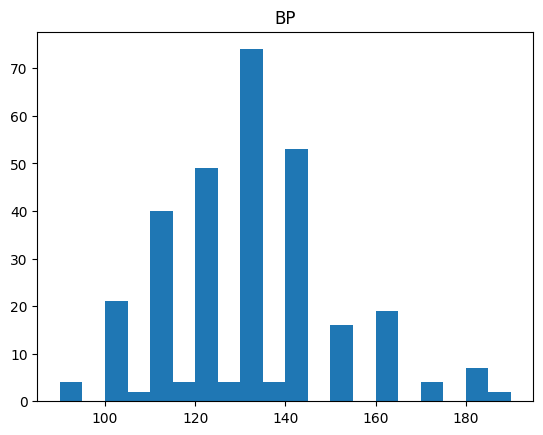

...

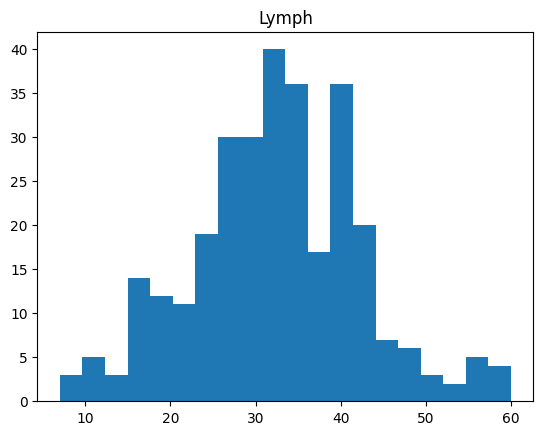

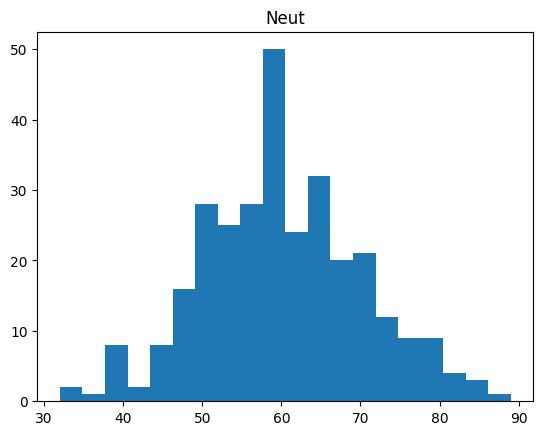

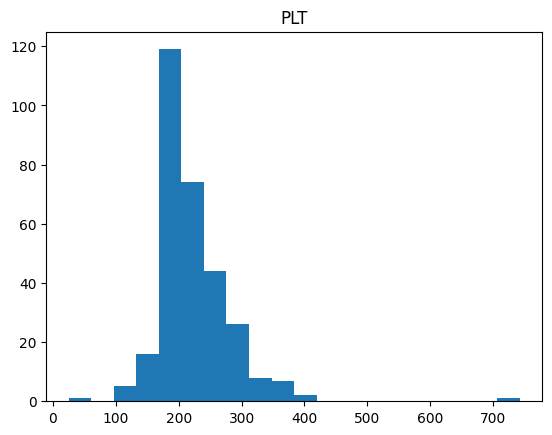

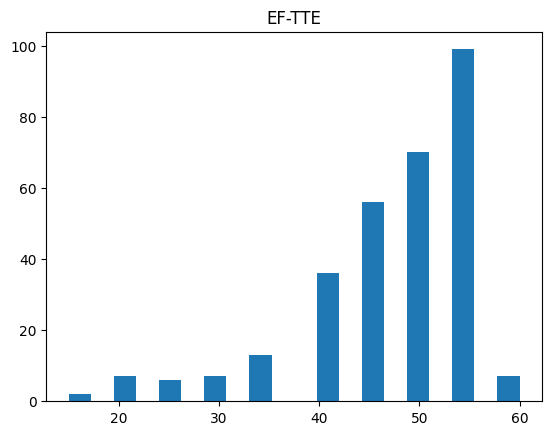

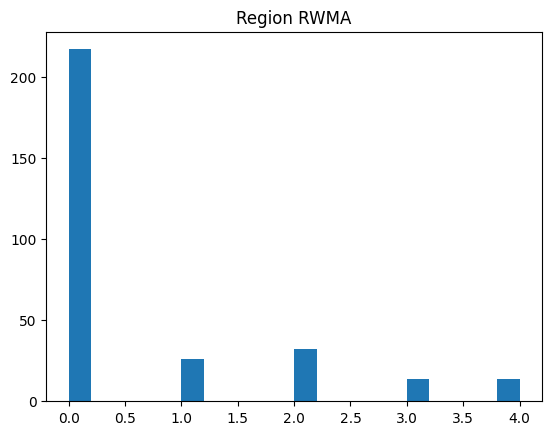

In [ ]:
for feature in numerical_features:
  plt.hist(preproccessing_data[feature], bins=20)
  plt.title(feature)
  plt.show()

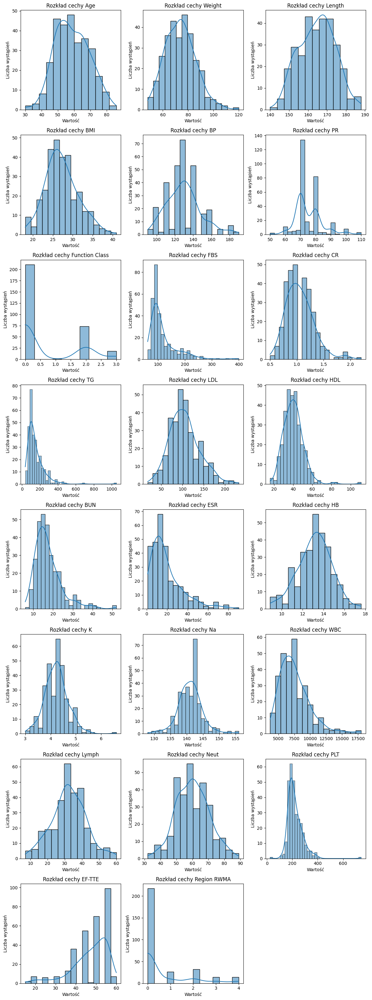

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ustal rozmiar siatki - tu 3 kolumny i odpowiednia liczba wierszy
num_plots = len(numerical_features)
n_cols = 3
n_rows = (num_plots // n_cols) + (num_plots % n_cols > 0)

# Ustaw rozmiar całej figury
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()  # Wypłaszczenie osi, aby łatwo iterować

for i, feature in enumerate(numerical_features):
    sns.histplot(preproccessing_data[feature], kde=True, ax=axes[i])
    axes[i].set_title("Rozkład cechy " + feature)
    axes[i].set_xlabel("Wartość")
    axes[i].set_ylabel("Liczba wystąpień")

# Wyłączenie pustych osi (w przypadku niepełnej liczby subplotów)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Dopasowanie layoutu, aby wykresy się nie nachodziły
plt.show()


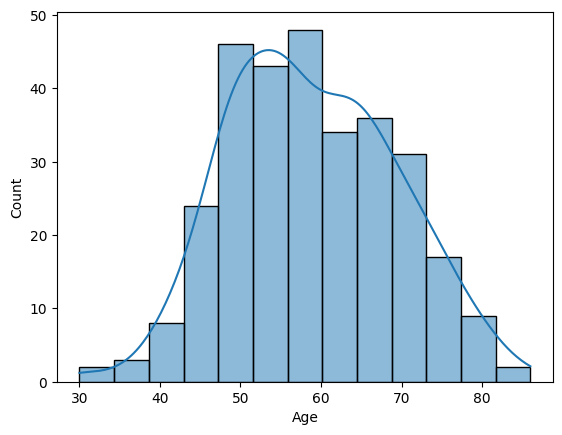

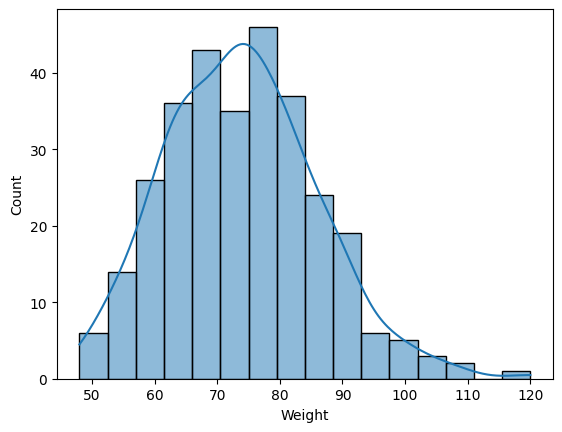

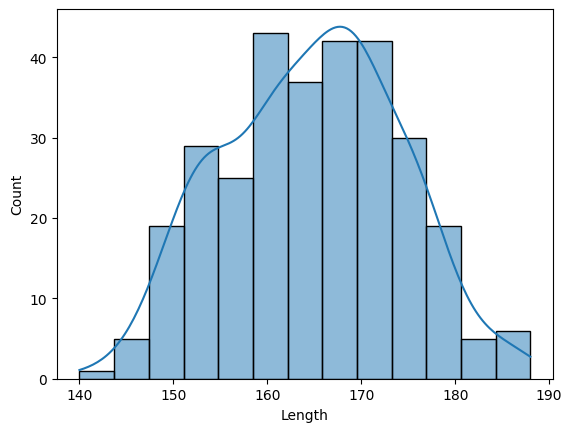

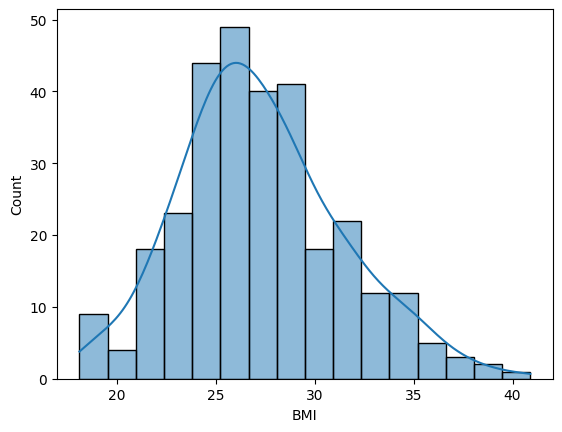

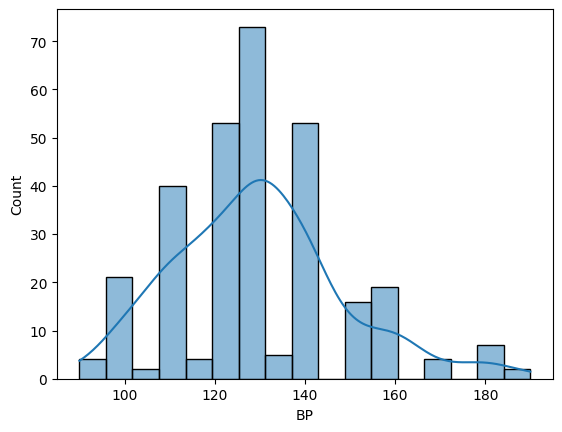

...

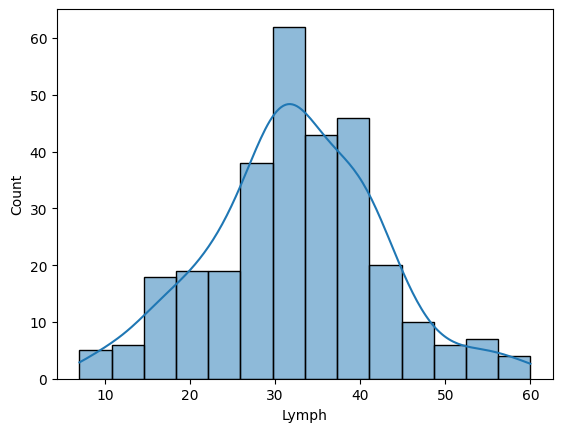

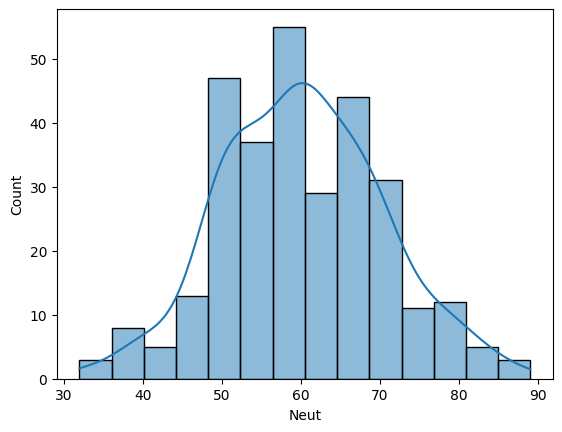

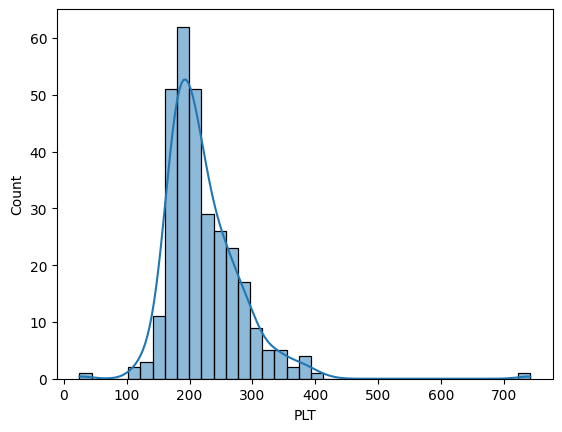

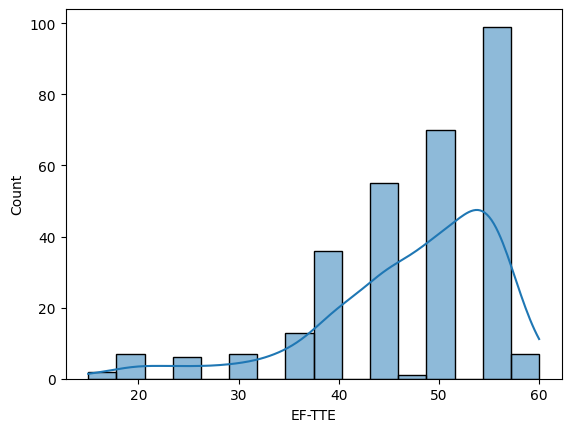

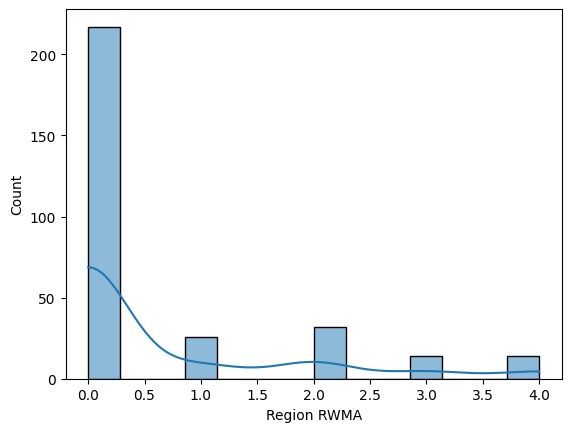

In [ ]:
for feature in numerical_features:
  sns.histplot(preproccessing_data[feature], kde=True)
  plt.show()

# **Analyze Cad and Normal state of Cath connected to Age and Weight**

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

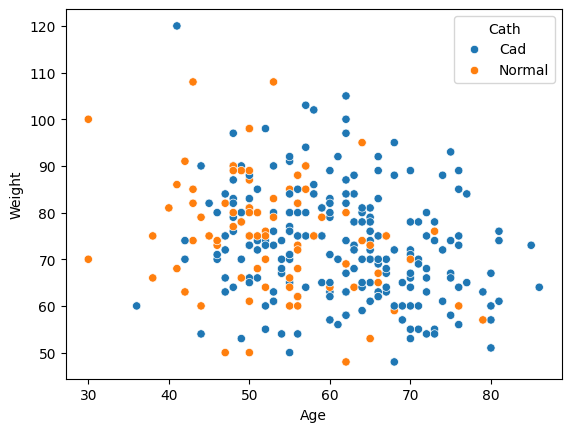

In [ ]:
sns.scatterplot(x='Age', y='Weight', data=preproccessing_data, hue='Cath')
plt.show()

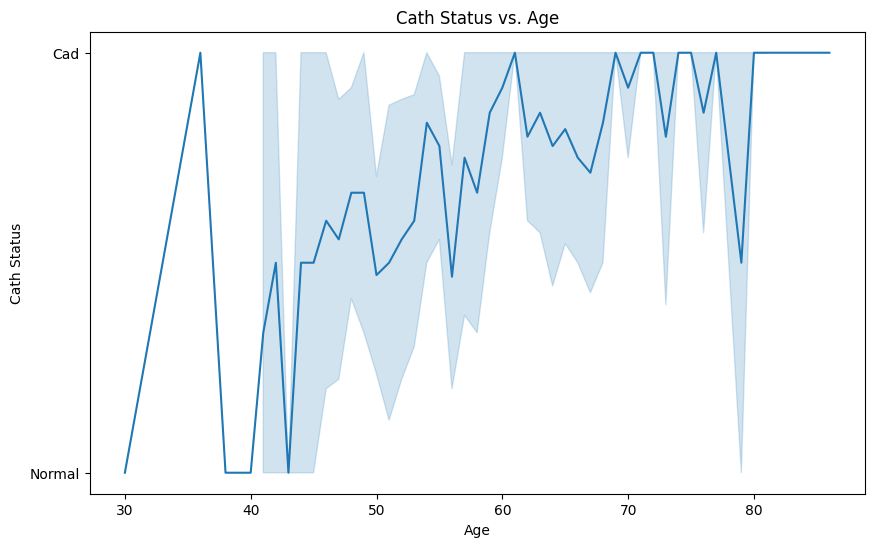

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.lineplot(x='Age', y='Cath', data=preproccessing_data)
plt.title('Cath Status vs. Age')
plt.xlabel('Age')
plt.ylabel('Cath Status')
plt.show()

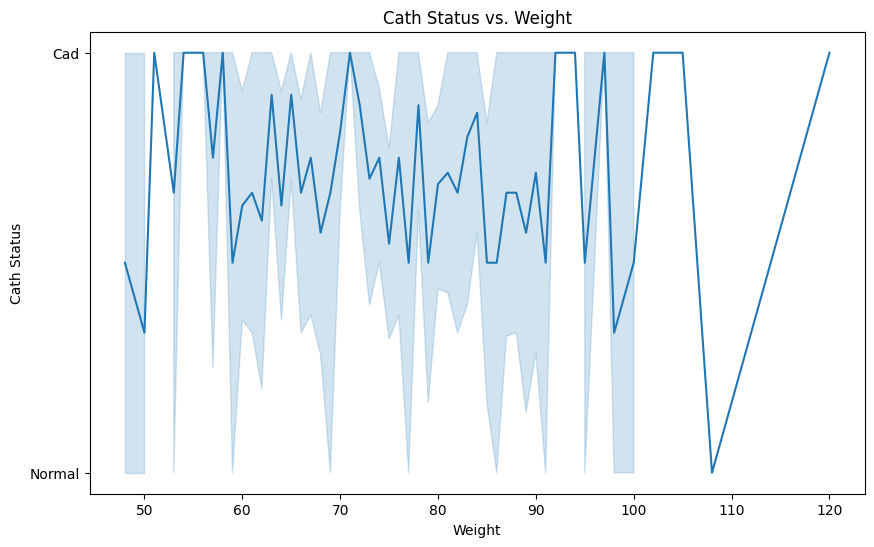

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.lineplot(x='Weight', y='Cath', data=preproccessing_data)
plt.title('Cath Status vs. Weight')
plt.xlabel('Weight')
plt.ylabel('Cath Status')
plt.show()

In [ ]:
gender = preproccessing_data['Sex'].value_counts()
gender

,count
Sex,
Male,176
Fmale,127


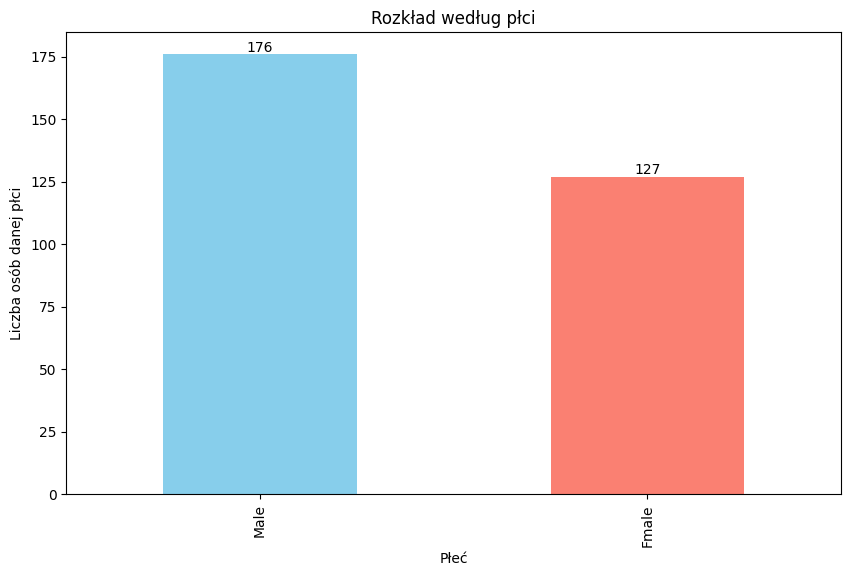

In [ ]:
plt.figure(figsize=(10, 6))
gender.plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Rozkład według płci')
plt.xlabel('Płeć')
plt.ylabel('Liczba osób danej płci')
for index, value in enumerate(gender):
    plt.text(index, value + 1, str(value), ha='center')
plt.show()

Text(0, 0.5, 'Wiek')

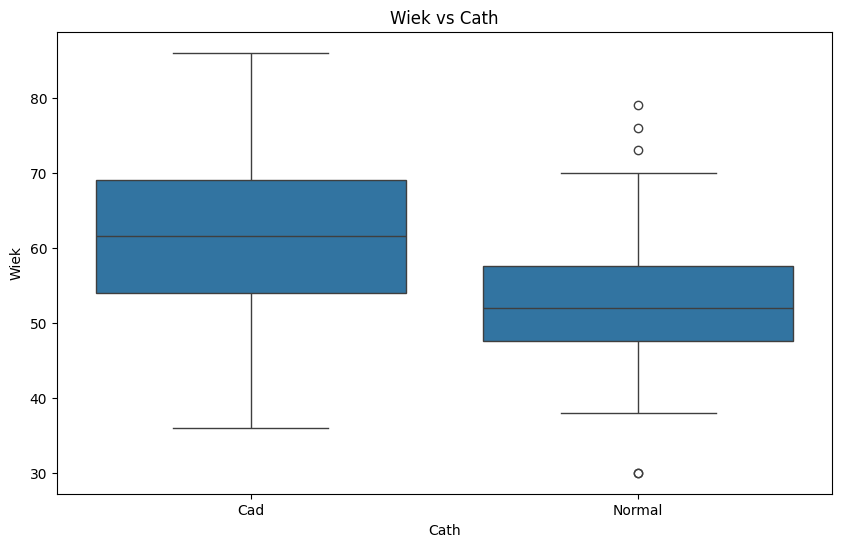

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Cath', y='Age', data=preproccessing_data)
plt.title('Wiek vs Cath')
plt.xlabel('Cath')
plt.ylabel('Wiek')

Text(0, 0.5, 'Age')

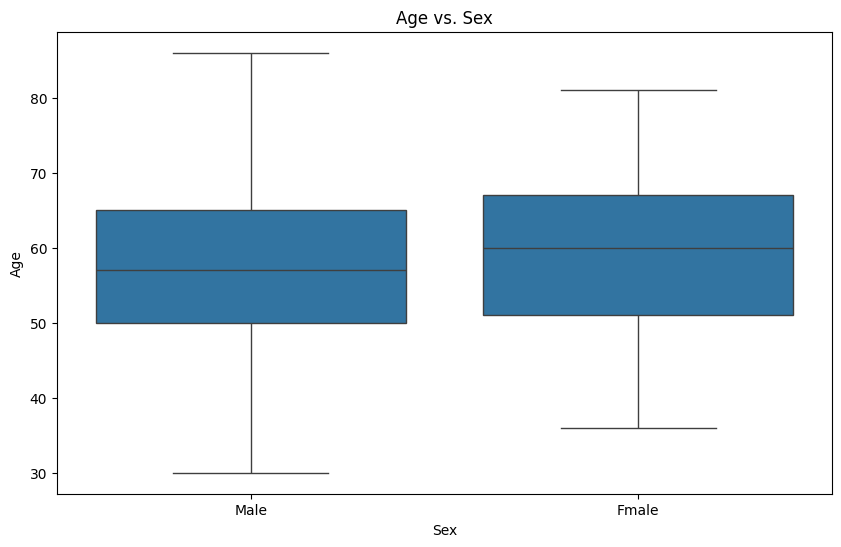

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sex', y='Age', data=preproccessing_data)
plt.title('Age vs. Sex')
plt.xlabel('Sex')
plt.ylabel('Age')

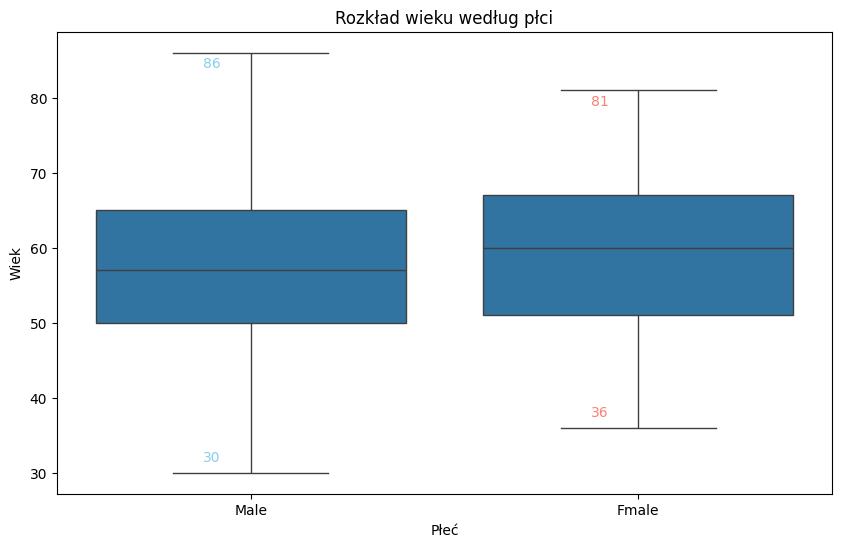

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Wyciąganie danych dla płci
male = preproccessing_data[preproccessing_data['Sex'] == 'Male']
female = preproccessing_data[preproccessing_data['Sex'] == 'Fmale']

# Obliczenie wartości minimalnych i maksymalnych
min_age_male = male['Age'].min()
max_age_male = male['Age'].max()
min_age_female = female['Age'].min()
max_age_female = female['Age'].max()

# Tworzenie boxplotu
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sex', y='Age', data=preproccessing_data)

# Dodanie tytułu i etykiet
plt.title('Rozkład wieku według płci')
plt.xlabel('Płeć')
plt.ylabel('Wiek')

# Dodanie tekstu dla wartości minimalnych i maksymalnych dla mężczyzn
plt.text(-0.1, min_age_male + 1.5, f'{min_age_male}', ha='center', color='skyblue')  # Po lewej od męskich
plt.text(-0.1, max_age_male - 2, f'{max_age_male}', ha='center', color='skyblue')

# Dodanie tekstu dla wartości minimalnych i maksymalnych dla kobiet
plt.text(0.9, min_age_female + 1.5, f'{min_age_female}', ha='center', color='salmon')  # Po prawej od żeńskich
plt.text(0.9, max_age_female - 2, f'{max_age_female}', ha='center', color='salmon')

# Wyświetlenie wykresu
plt.show()


In [ ]:
male = preproccessing_data[preproccessing_data['Sex'] == 'Male']
female = preproccessing_data[preproccessing_data['Sex'] == 'Fmale']

min_age_male = male['Age'].min()
max_age_male = male['Age'].max()
min_age_female = female['Age'].min()
max_age_female = female['Age'].max()

print(f"Min age male: {min_age_male}")
print(f"Max age male: {max_age_male}")
print(f"Min age female: {min_age_female}")
print(f"Max age female: {max_age_female}")

Min age male: 30
Max age male: 86
Min age female: 36
Max age female: 81


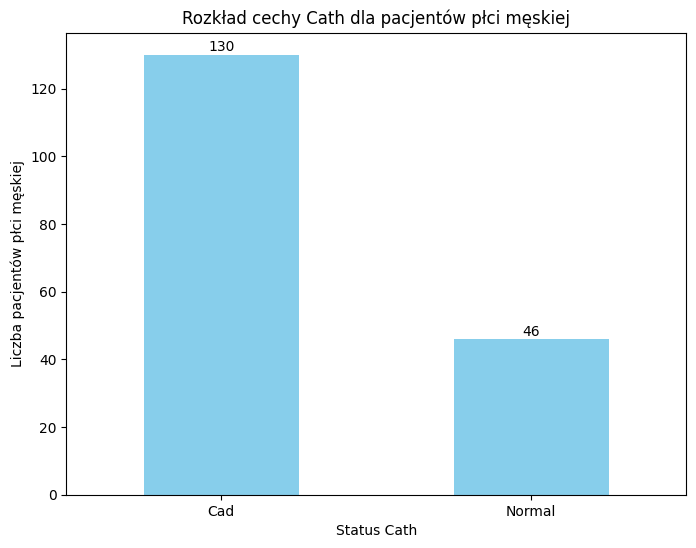

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for male patients
male_patients = preproccessing_data[preproccessing_data['Sex'] == 'Male']

# Count occurrences of 'Cath' states for male patients
cath_counts = male_patients['Cath'].value_counts()

# Create the bar plot
plt.figure(figsize=(8, 6))
cath_counts.plot(kind='bar', color='skyblue')
plt.title('Rozkład cechy Cath dla pacjentów płci męskiej')
plt.xlabel('Status Cath')
plt.ylabel('Liczba pacjentów płci męskiej')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
for index, value in enumerate(cath_counts):
    plt.text(index, value + 1, str(value), ha='center')
plt.show()

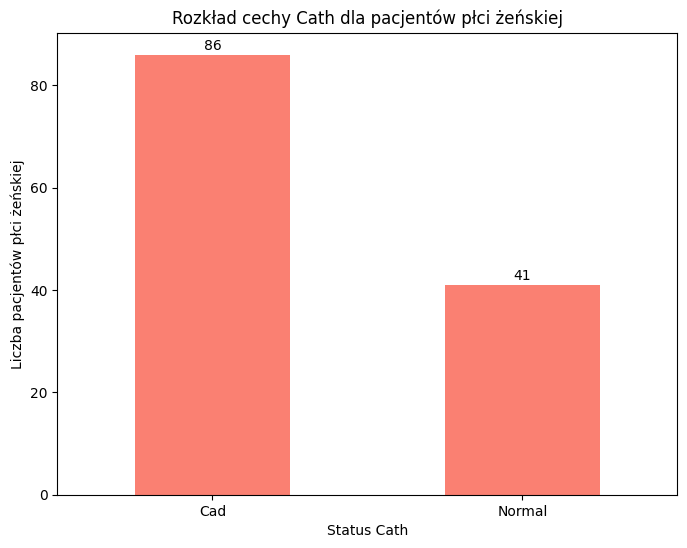

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter data for male patients
female_patients = preproccessing_data[preproccessing_data['Sex'] == 'Fmale']

# Count occurrences of 'Cath' states for male patients
cath_counts = female_patients['Cath'].value_counts()

# Create the bar plot
plt.figure(figsize=(8, 6))
cath_counts.plot(kind='bar', color='salmon')
plt.title('Rozkład cechy Cath dla pacjentów płci żeńskiej')
plt.xlabel('Status Cath')
plt.ylabel('Liczba pacjentów płci żeńskiej')
plt.xticks(rotation=0)  # Keep x-axis labels horizontal
for index, value in enumerate(cath_counts):
    plt.text(index, value + 1, str(value), ha='center')
plt.show()

# **Check if there are outliers in our numerical data type features**


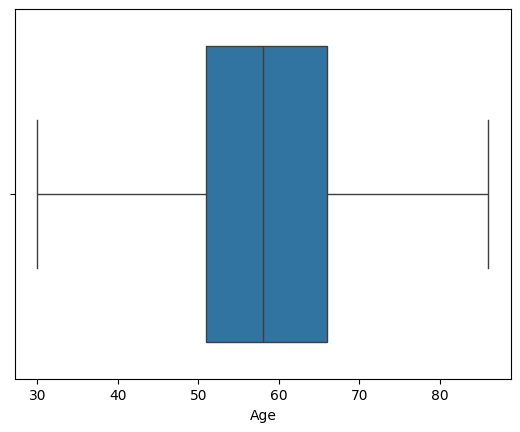

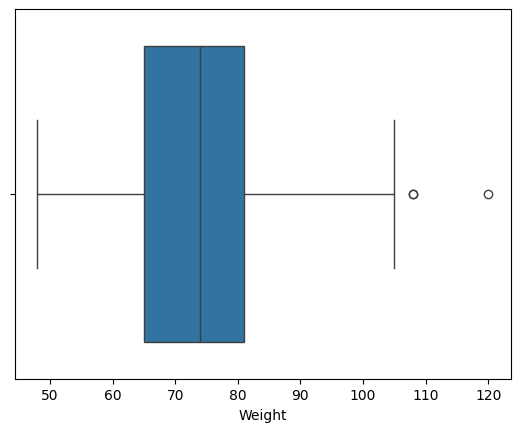

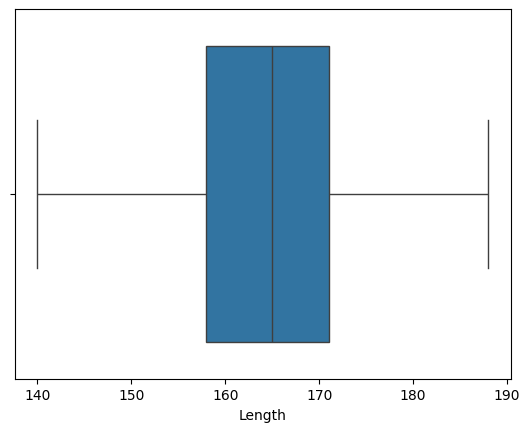

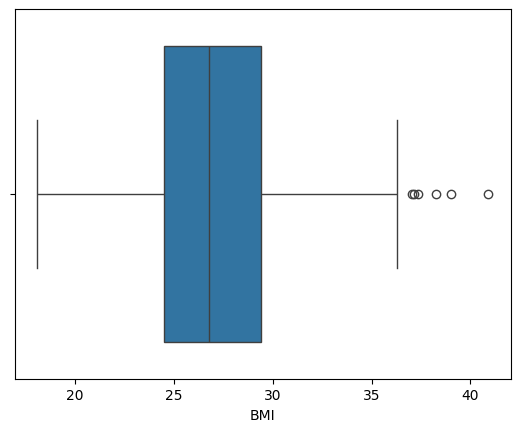

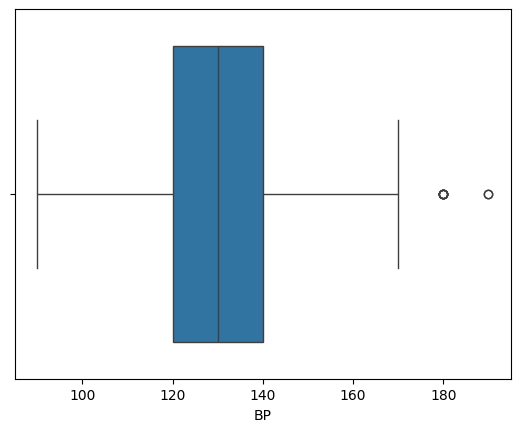

...

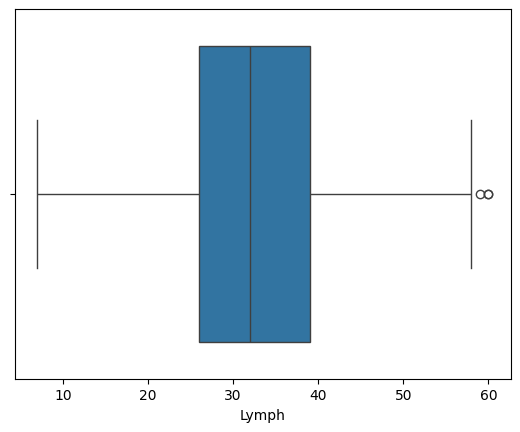

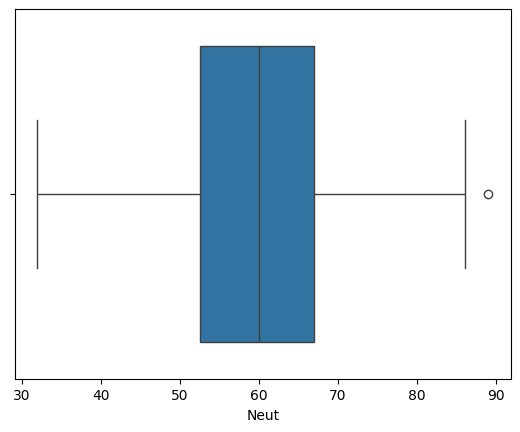

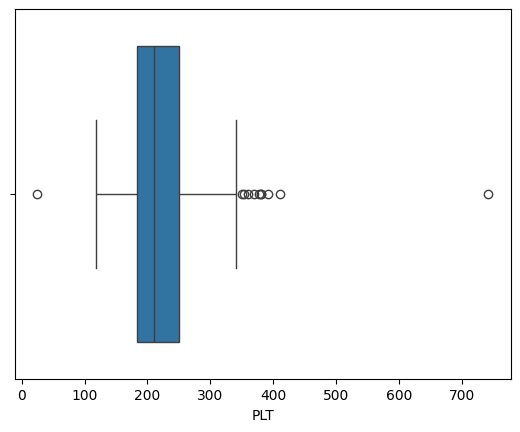

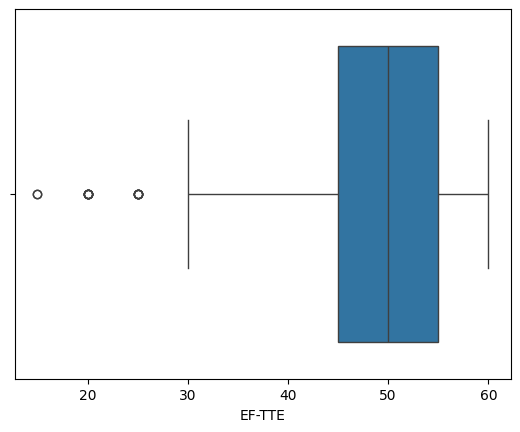

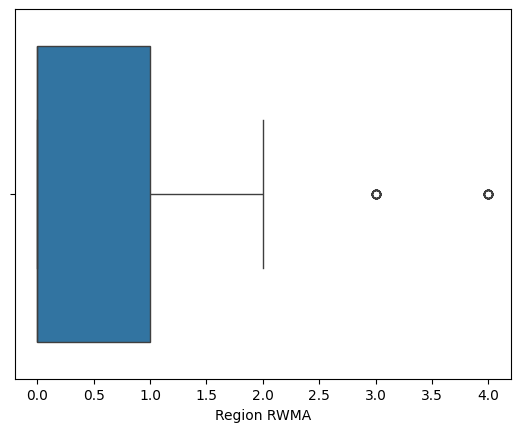

In [ ]:
for feature in numerical_features:
  sns.boxplot(x=preproccessing_data[feature])
  plt.show()

Like we can se on our Histograms and BoxPlots we have quite a lot of outliers. Our dataset has only 303 rows so because of that I won't delete any row with outliers because we could loss a lot of data. Rather than deleting I am going to do Winsorization.

# **Doing Winsorization with Outliers**

Firstly I am going to calculate how many outliers have each numerical feature, and describe it in percetage

In [ ]:
def winsorization_function(features):
  for feature in features:
    Q1 = preproccessing_data[feature].quantile(0.25)
    Q3 = preproccessing_data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    counter_Q1 = (preproccessing_data[feature] < lower_bound).sum()
    counter_Q3 = (preproccessing_data[feature] > upper_bound).sum()
    print(f"Feature: {feature}")
    print(f"Values below Q1: {counter_Q1}")
    print(f"Values above Q3: {counter_Q3}")
    print(f"Total sum of outliers: {counter_Q1 + counter_Q3}")
    print(f"Percentage of outliers: {((counter_Q1 + counter_Q3) / len(preproccessing_data[feature]) * 100).round(2)}%")
    print()

In [ ]:
winsorization_function(numerical_features)

Feature: Age
Values below Q1: 0
Values above Q3: 0
Total sum of outliers: 0
Percentage of outliers: 0.0%

Feature: Weight
Values below Q1: 0
Values above Q3: 3
Total sum of outliers: 3
Percentage of outliers: 0.99%

Feature: Length
Values below Q1: 0
Values above Q3: 0
Total sum of outliers: 0
Percentage of outliers: 0.0%

Feature: BMI
Values below Q1: 0
Values above Q3: 6
Total sum of outliers: 6
Percentage of outliers: 1.98%

Feature: BP
Values below Q1: 0
Values above Q3: 9
Total sum of outliers: 9
Percentage of outliers: 2.97%

Feature: PR
Values below Q1: 2
Values above Q3: 11
Total sum of outliers: 13
Percentage of outliers: 4.29%

Feature: Function Class
Values below Q1: 0
Values above Q3: 0
Total sum of outliers: 0
Percentage of outliers: 0.0%

Feature: FBS
Values below Q1: 0
Values above Q3: 30
Total sum of outliers: 30
Percentage of outliers: 9.9%

Feature: CR
Values below Q1: 0
Values above Q3: 8
Total sum of outliers: 8
Percentage of outliers: 2.64%

Feature: TG
Values belo

# **#  Becausue of the pourpose of this project I decided to skip this proccess of deleting outliers because I didn't have enough medical knowlage to decide if given values are actually outliers.**

# **Exchange all the text values with number**

In [ ]:
from sklearn.preprocessing import LabelEncoder, LabelBinarizer, OrdinalEncoder

In [ ]:
le = LabelEncoder()

Now we have our categorical-binary features and we need to transform their object type (**"N"** and **"Y**") to int64 type (**0** and **1**)

We are going to use LabelEncoder here beacuese it dosen't need any

 specail selection and it is going to be efficient because of only 2 options to choose.

In [ ]:
print("binary_features: ",  binary_features)


binary_features:  ['Sex', 'Obesity', 'CRF', 'CVA', 'Airway disease', 'Thyroid Disease', 'CHF', 'DLP', 'Weak Peripheral Pulse', 'Lung rales', 'Systolic Murmur', 'Diastolic Murmur', 'Dyspnea', 'Atypical', 'Nonanginal', 'LowTH Ang', 'LVH', 'Poor R Progression', 'Cath']


We have also our categorical features which have more than 2 unique

 values and because of that we are going to use **One-Hot Encoding**

 here because our features are **Nominal** and don't have any ordinal.


In [ ]:
print("categorical_features: ",  categorical_features)

categorical_features:  ['BBB', 'VHD']


Now it's time to firstly encode the values from our binary features using standard **LabelEncoder**.

In [ ]:
encoding_dict = {}
for column in binary_features:
    le.fit(preproccessing_data[column])
    encoding_dict[column] = dict(zip(le.classes_, le.transform(le.classes_)))
    preproccessing_data[column] = le.transform(preproccessing_data[column])


I use LabelEncoder because it wokrs in a loop and because
of that

I have 1 dimentional object to encode:
It is pandas series and it is like an array.


Looks like **Binary Categorical Variables** because we have only two options: **Y** or **N**

In [ ]:
for column in binary_features:
    print(f"Encoded values for column: '{column}':")
    print(encoding_dict[column])
    print()

Encoded values for column: 'Sex':
{'Fmale': 0, 'Male': 1}

Encoded values for column: 'Obesity':
{'N': 0, 'Y': 1}

Encoded values for column: 'CRF':
{'N': 0, 'Y': 1}

Encoded values for column: 'CVA':
{'N': 0, 'Y': 1}

Encoded values for column: 'Airway disease':
{'N': 0, 'Y': 1}

Encoded values for column: 'Thyroid Disease':
{'N': 0, 'Y': 1}

Encoded values for column: 'CHF':
{'N': 0, 'Y': 1}

Encoded values for column: 'DLP':
{'N': 0, 'Y': 1}

Encoded values for column: 'Weak Peripheral Pulse':
{'N': 0, 'Y': 1}

Encoded values for column: 'Lung rales':
{'N': 0, 'Y': 1}

Encoded values for column: 'Systolic Murmur':
{'N': 0, 'Y': 1}

Encoded values for column: 'Diastolic Murmur':
{'N': 0, 'Y': 1}

Encoded values for column: 'Dyspnea':
{'N': 0, 'Y': 1}

Encoded values for column: 'Atypical':
{'N': 0, 'Y': 1}

Encoded values for column: 'Nonanginal':
{'N': 0, 'Y': 1}

Encoded values for column: 'LowTH Ang':
{'N': 0, 'Y': 1}

Encoded values for column: 'LVH':
{'N': 0, 'Y': 1}

Encoded va

In [ ]:
for feature in binary_features:
  print((preproccessing_data[feature].value_counts()/len(preproccessing_data[feature])*100).round(2))
  print()

Sex
1    58.09
0    41.91
Name: count, dtype: float64

Obesity
1    69.64
0    30.36
Name: count, dtype: float64

CRF
0    98.02
1     1.98
Name: count, dtype: float64

CVA
0    98.35
1     1.65
Name: count, dtype: float64

Airway disease
0    96.37
1     3.63
Name: count, dtype: float64

Thyroid Disease
0    97.69
1     2.31
Name: count, dtype: float64

CHF
0    99.67
1     0.33
Name: count, dtype: float64

DLP
0    63.04
1    36.96
Name: count, dtype: float64

Weak Peripheral Pulse
0    98.35
1     1.65
Name: count, dtype: float64

Lung rales
0    96.37
1     3.63
Name: count, dtype: float64

Systolic Murmur
0    86.47
1    13.53
Name: count, dtype: float64

Diastolic Murmur
0    97.03
1     2.97
Name: count, dtype: float64

Dyspnea
0    55.78
1    44.22
Name: count, dtype: float64

Atypical
0    69.31
1    30.69
Name: count, dtype: float64

Nonanginal
0    94.72
1     5.28
Name: count, dtype: float64

LowTH Ang
0    99.34
1     0.66
Name: count, dtype: float64

LVH
0    93.4
1     6

In [ ]:
preproccessing_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 55 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    303 non-null    int64  
 1   Weight                 303 non-null    int64  
 2   Length                 303 non-null    int64  
 3   Sex                    303 non-null    int64  
 4   BMI                    303 non-null    float64
 5   DM                     303 non-null    int64  
 6   HTN                    303 non-null    int64  
 7   Current Smoker         303 non-null    int64  
 8   EX-Smoker              303 non-null    int64  
 9   FH                     303 non-null    int64  
 10  Obesity                303 non-null    int64  
 11  CRF                    303 non-null    int64  
 12  CVA                    303 non-null    int64  
 13  Airway disease         303 non-null    int64  
 14  Thyroid Disease        303 non-null    int64  
 15  CHF   

Now we have to deal with 2 features from our categorical features which have more than 2 uniqe values.

We are going to use **One-Hot Encoder** in this case.

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False).set_output(transform='pandas')

In [ ]:
ohe_transformed = ohe.fit_transform(preproccessing_data[categorical_features])

In [ ]:
ohe_transformed

,BBB_LBBB,BBB_N,BBB_RBBB,VHD_Moderate,VHD_N,VHD_Severe,VHD_mild
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...
298,0.0,1.0,0.0,0.0,1.0,0.0,0.0
299,1.0,0.0,0.0,0.0,0.0,0.0,1.0
300,0.0,0.0,1.0,0.0,1.0,0.0,0.0
301,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [ ]:
preproccessing_data = pd.concat([preproccessing_data.drop(categorical_features, axis=1), ohe_transformed], axis=1)

In [ ]:
preproccessing_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 60 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    303 non-null    int64  
 1   Weight                 303 non-null    int64  
 2   Length                 303 non-null    int64  
 3   Sex                    303 non-null    int64  
 4   BMI                    303 non-null    float64
 5   DM                     303 non-null    int64  
 6   HTN                    303 non-null    int64  
 7   Current Smoker         303 non-null    int64  
 8   EX-Smoker              303 non-null    int64  
 9   FH                     303 non-null    int64  
 10  Obesity                303 non-null    int64  
 11  CRF                    303 non-null    int64  
 12  CVA                    303 non-null    int64  
 13  Airway disease         303 non-null    int64  
 14  Thyroid Disease        303 non-null    int64  
 15  CHF   

In [ ]:
preproccessing_data.describe().round(2)

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,EF-TTE,Region RWMA,Cath,BBB_LBBB,BBB_N,BBB_RBBB,VHD_Moderate,VHD_N,VHD_Severe,VHD_mild
count,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,...,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00,303.00
mean,58.90,73.83,164.72,0.58,27.25,0.30,0.59,0.21,0.03,0.16,...,47.23,0.62,0.29,0.04,0.93,0.03,0.09,0.38,0.04,0.49
std,10.39,11.99,9.33,0.49,4.10,0.46,0.49,0.41,0.18,0.37,...,8.93,1.13,0.45,0.20,0.25,0.16,0.29,0.49,0.19,0.50
min,30.00,48.00,140.00,0.00,18.12,0.00,0.00,0.00,0.00,0.00,...,15.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,51.00,65.00,158.00,0.00,24.51,0.00,0.00,0.00,0.00,0.00,...,45.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
50%,58.00,74.00,165.00,1.00,26.78,0.00,1.00,0.00,0.00,0.00,...,50.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00
75%,66.00,81.00,171.00,1.00,29.41,1.00,1.00,0.00,0.00,0.00,...,55.00,1.00,1.00,0.00,1.00,0.00,0.00,1.00,0.00,1.00
max,86.00,120.00,188.00,1.00,40.90,1.00,1.00,1.00,1.00,1.00,...,60.00,4.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


# **Divide our dataset into train dataset and Test dataset**

In [ ]:
X = preproccessing_data
X = X.drop('Cath', axis=1)
y = preproccessing_data['Cath']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X.head()

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,PLT,EF-TTE,Region RWMA,BBB_LBBB,BBB_N,BBB_RBBB,VHD_Moderate,VHD_N,VHD_Severe,VHD_mild
0,53,90,175,1,29.387755,0,1,1,0,0,...,261,50,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,67,70,157,0,28.398718,0,1,0,0,0,...,165,40,4,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,54,54,164,1,20.077335,0,0,1,0,0,...,230,40,2,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,66,67,158,0,26.838648,0,1,0,0,0,...,742,55,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,50,87,153,0,37.165193,0,1,0,0,0,...,274,50,0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
y.head()

,Cath
0,0
1,0
2,0
3,1
4,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
X_train.shape

(242, 59)

In [ ]:
X_test.shape


(61, 59)

In [ ]:
y_train.shape

(242,)

In [ ]:
y_test.shape

(61,)

# **Feature Scailing - Standarization**

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = scaler.transform(X_test)
X_test = pd.DataFrame(X_test, columns=X.columns)

In [ ]:
X_train

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,PLT,EF-TTE,Region RWMA,BBB_LBBB,BBB_N,BBB_RBBB,VHD_Moderate,VHD_N,VHD_Severe,VHD_mild
0,-0.354791,0.202294,-1.608026,-1.222639,1.626287,1.551918,-1.151921,-0.477940,-0.184900,2.281475,...,1.036496,0.323927,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
1,1.730095,-0.749132,0.760198,0.817903,-1.260940,-0.644364,0.868115,-0.477940,-0.184900,-0.438313,...,-0.541064,-0.789572,1.212678,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
2,-0.354791,-0.835625,-1.392733,-1.222639,0.140190,-0.644364,-1.151921,-0.477940,-0.184900,-0.438313,...,2.424749,-0.789572,-0.565916,4.816638,-3.890159,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
3,-0.354791,0.202294,0.544905,0.817903,-0.202971,-0.644364,-1.151921,2.092314,-0.184900,2.281475,...,0.137287,-2.459822,2.101975,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
4,1.256257,-0.922119,-1.069793,-1.222639,-0.221286,-0.644364,0.868115,-0.477940,-0.184900,-0.438313,...,1.131150,0.323927,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,-1.586769,-0.316666,-0.531560,0.817903,0.052867,-0.644364,0.868115,-0.477940,-0.184900,-0.438313,...,-0.225552,0.323927,0.323381,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
238,-0.070488,0.115801,0.329612,0.817903,-0.135586,-0.644364,0.868115,-0.477940,5.408327,-0.438313,...,-0.351757,0.323927,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
239,0.308582,-0.403159,0.114319,-1.222639,-0.510528,-0.644364,-1.151921,-0.477940,-0.184900,2.281475,...,-0.619942,0.880677,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,1.288154,-0.1849,-1.008299
240,0.687652,-0.316666,-0.316267,0.817903,-0.111221,-0.644364,0.868115,-0.477940,-0.184900,-0.438313,...,0.594779,0.880677,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769


In [ ]:
X_test

,Age,Weight,Length,Sex,BMI,DM,HTN,Current Smoker,EX-Smoker,FH,...,PLT,EF-TTE,Region RWMA,BBB_LBBB,BBB_N,BBB_RBBB,VHD_Moderate,VHD_N,VHD_Severe,VHD_mild
0,-1.112931,-0.143679,0.437259,0.817903,-0.469130,-0.644364,-1.151921,2.092314,-0.184900,-0.438313,...,0.862965,0.323927,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
1,1.540560,0.029308,0.975491,0.817903,-0.656795,-0.644364,0.868115,-0.477940,-0.184900,-0.438313,...,-0.903903,-1.346322,2.101975,-0.207614,0.257059,-0.145248,-0.308257,1.288154,-0.1849,-1.008299
2,1.066722,-0.835625,-1.608026,-1.222639,0.322038,-0.644364,0.868115,-0.477940,-0.184900,2.281475,...,-0.777698,0.323927,0.323381,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
3,-0.354791,0.894241,2.374896,0.817903,-0.759634,1.551918,-1.151921,-0.477940,-0.184900,-0.438313,...,-0.525288,-0.789572,1.212678,-0.207614,-3.890159,6.884766,-0.308257,-0.776305,-0.1849,0.991769
4,-0.070488,0.894241,0.329612,0.817903,0.644219,-0.644364,-1.151921,-0.477940,-0.184900,-0.438313,...,0.437023,-0.232823,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,1.288154,-0.1849,-1.008299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,0.498117,-0.749132,0.006672,0.817903,-0.795377,-0.644364,-1.151921,2.092314,-0.184900,-0.438313,...,-0.635718,-2.459822,2.991273,4.816638,-3.890159,-0.145248,3.244042,-0.776305,-0.1849,-1.008299
57,0.308582,2.018654,0.221965,0.817903,1.871558,-0.644364,0.868115,2.092314,-0.184900,-0.438313,...,-0.446410,-1.346322,1.212678,4.816638,-3.890159,-0.145248,-0.308257,1.288154,-0.1849,-1.008299
58,-0.828629,2.105147,1.190784,0.817903,1.102864,-0.644364,0.868115,-0.477940,5.408327,-0.438313,...,0.011082,0.880677,-0.565916,-0.207614,0.257059,-0.145248,-0.308257,-0.776305,-0.1849,0.991769
59,0.308582,-1.354585,-0.316267,0.817903,-1.229405,-0.644364,-1.151921,2.092314,-0.184900,-0.438313,...,-0.493737,-0.232823,-0.565916,-0.207614,0.257059,-0.145248,3.244042,-0.776305,-0.1849,-1.008299


In [ ]:
print("Rozkład zmiennej celu w zbiorze treningowym:")
print(y_train.value_counts(normalize=True))

print("Rozkład zmiennej celu w zbiorze testowym:")
print(y_test.value_counts(normalize=True))

Rozkład zmiennej celu w zbiorze treningowym:
Cath
0    0.714876
1    0.285124
Name: proportion, dtype: float64
Rozkład zmiennej celu w zbiorze testowym:
Cath
0    0.704918
1    0.295082
Name: proportion, dtype: float64


# **Features Variance**

In [ ]:
X_train.var(axis=0).round(2)

,0
Age,1.0
Weight,1.0
Length,1.0
Sex,1.0
BMI,1.0
DM,1.0
HTN,1.0
Current Smoker,1.0
EX-Smoker,1.0
FH,1.0


# **Create Dict for story each algorithm and it's accuracy score**

In [ ]:
accuracy_dict = {}

# **LOGISTIC REGRESSION ALGORITHM**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)

LogisticRegression()

In [ ]:
print(model_lr.score(X_test, y_test))

0.7704918032786885


In [ ]:
y_predict = model_lr.predict(X_test)

In [ ]:
y_predict

array([1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0])

In [ ]:
print(y_test.to_list())

[0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0]


In [ ]:
model_lr.score(X_test, y_test)

0.7704918032786885

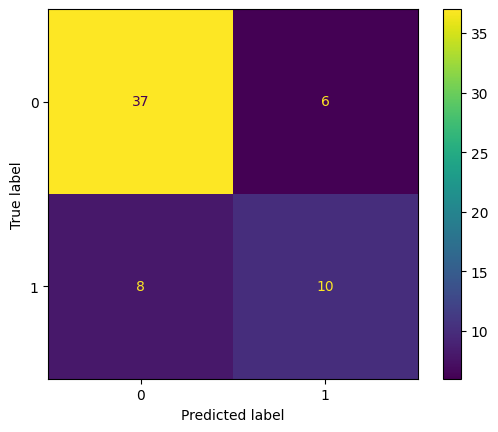

In [ ]:
v = confusion_matrix(y_test, y_predict)
cm = ConfusionMatrixDisplay(v, display_labels=model_lr.classes_)
cm.plot()

In [ ]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.82      0.86      0.84        43
           1       0.62      0.56      0.59        18

    accuracy                           0.77        61
   macro avg       0.72      0.71      0.71        61
weighted avg       0.76      0.77      0.77        61



In [ ]:
accuracy_dict['Logistic Regression'] = model_lr.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'penalty': ['l1', 'l2', 'elasticnet'],  # różne typy regularyzacji
    'C': [0.0001, 0.001, 0.01, 0.1],  # odwrotność siły regularyzacji
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'newton-cholesky'],  # algorytmy optymalizacyjne
    'max_iter': [10, 50, 100, 200, 500, 750, 1000],  # maksymalna liczba iteracji
    'tol': [1e-4, 1e-3, 1e-2],  # tolerancja zbieżności
    'class_weight': ['balanced'],  # wagi klas
    'l1_ratio': [0.0, 0.25, 0.5, 0.75, 1.0, None]  # dla elasticnet (tylko przy solver='saga')
}

In [ ]:
random_search = RandomizedSearchCV(model_lr, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning:


425 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1194, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File 

RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_iter=200, n_jobs=-1,
                   param_distributions={'C': [0.0001, 0.001, 0.01, 0.1],
                                        'class_weight': ['balanced'],
                                        'l1_ratio': [0.0, 0.25, 0.5, 0.75, 1.0,
                                                     None],
                                        'max_iter': [10, 50, 100, 200, 500, 750,
                                                     1000],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['liblinear', 'saga', 'lbfgs',
                                                   'newton-cg',
                                                   'newton-cholesky'],
                                        'tol': [0.0001, 0.001, 0.01]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'tol': 0.01,
 'solver': 'lbfgs',
 'penalty': 'l2',
 'max_iter': 750,
 'l1_ratio': 0.0,
 'class_weight': 'balanced',
 'C': 0.01}

In [ ]:
random_search.best_score_

0.8844387755102041

In [ ]:
model_lr_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_lr_best.predict(X_test)

In [ ]:
print(model_lr_best.score(X_test, y_test))

0.7868852459016393


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.88      0.81      0.84        43
           1       0.62      0.72      0.67        18

    accuracy                           0.79        61
   macro avg       0.75      0.77      0.76        61
weighted avg       0.80      0.79      0.79        61



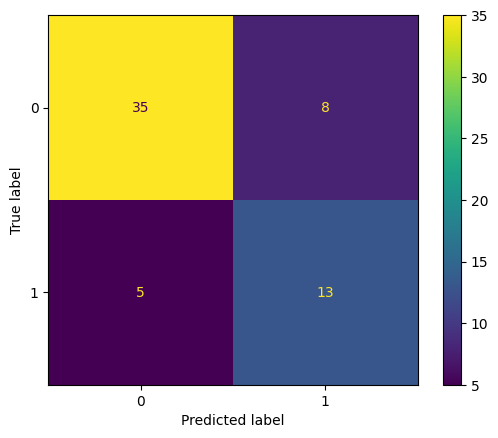

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_lr_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['Logistic Regression Random'] = model_lr_best.score(X_test, y_test)

In [ ]:
import shap

In [ ]:
explainer = shap.LinearExplainer(model_lr, masker=shap.maskers.Independent(X_test))
shap_values = explainer.shap_values(X_test)

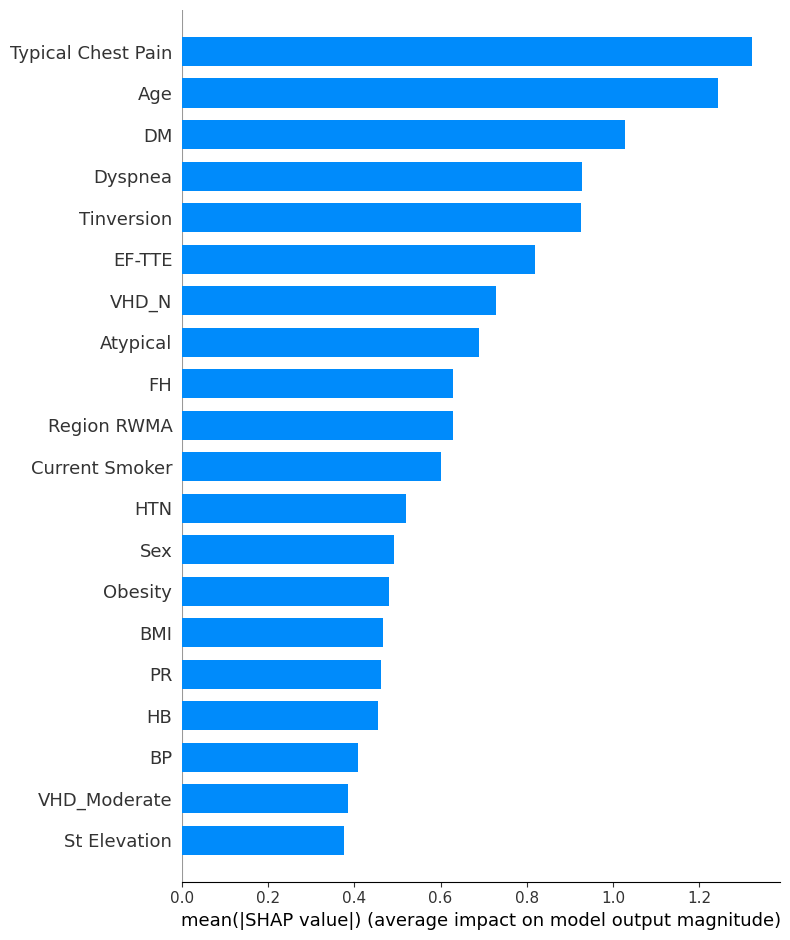

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_train)

# **Optuna Optimization**

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

In [ ]:
def objective(trial):

    solver = trial.suggest_categorical('solver', ['liblinear', 'saga', 'lbfgs', 'newton-cg', 'sag'])

    penalty = trial.suggest_categorical('penalty', ['l1', 'l2', 'elasticnet'])

    incompatible_combinations = (
        (['newton-cg'], ['l1', 'elasticnet']),
        (['sag'], ['elasticnet', 'l1']),
        (['lbfgs'], ['l1', 'elasticnet']),
        (['liblinear'], ['elasticnet'])
    )

    for solvers, penalties in incompatible_combinations:
        if solver in solvers and penalty in penalties:
            raise optuna.TrialPruned()

    C = trial.suggest_float('C', 0.001, 10)
    max_iter = trial.suggest_int('max_iter',10, 500)
    tol = trial.suggest_float('tol', 1e-5, 1e-1)
    class_weight = trial.suggest_categorical('class_weight', ['balanced'])

    l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0) if penalty == 'elasticnet' else None

    model = LogisticRegression(
        penalty=penalty,
        C=C,
        solver=solver,
        max_iter=max_iter,
        tol=tol,
        class_weight=class_weight,
        l1_ratio=l1_ratio,
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 17:57:39,986] A new study created in memory with name: no-name-3fedd279-8371-4c3c-870c-fe573ae0d3c4
[I 2024-11-20 17:57:40,000] Trial 1 pruned. 
[I 2024-11-20 17:57:40,148] Trial 0 finished with value: 0.8391156462585034 and parameters: {'solver': 'saga', 'penalty': 'elasticnet', 'C': 2.8254198546073233, 'max_iter': 359, 'tol': 0.07969190585164934, 'class_weight': 'balanced', 'l1_ratio': 0.42460739708215645}. Best is trial 0 with value: 0.8391156462585034.
[I 2024-11-20 17:57:40,157] Trial 3 pruned. 
[I 2024-11-20 17:57:40,162] Trial 4 pruned. 
[I 2024-11-20 17:57:40,236] Trial 2 finished with value: 0.8514455782312925 and parameters: {'solver': 'newton-cg', 'penalty': 'l2', 'C': 4.882322793673185, 'max_iter': 155, 'tol': 0.0003458924617548001, 'class_weight': 'balanced'}. Best is trial 2 with value: 0.8514455782312925.
[I 2024-11-20 17:57:40,245] Trial 6 pruned. 
[I 2024-11-20 17:57:40,249] Trial 7 pruned. 
[I 2024-11-20 17:57:40,364] Trial 5 finished with value: 0.84302

In [ ]:
print(optuna_study.best_params)

{'solver': 'saga', 'penalty': 'elasticnet', 'C': 0.3494291258366483, 'max_iter': 235, 'tol': 0.01150438435014402, 'class_weight': 'balanced', 'l1_ratio': 0.7638154318396231}


In [ ]:
model_optuna = LogisticRegression(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

LogisticRegression(C=0.3494291258366483, class_weight='balanced',
                   l1_ratio=0.7638154318396231, max_iter=235,
                   penalty='elasticnet', solver='saga',
                   tol=0.01150438435014402)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(optuna_study.best_value)

0.9012755102040817


In [ ]:
print(model_optuna.score(X_test, y_test))

0.7868852459016393


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.86      0.84      0.85        43
           1       0.63      0.67      0.65        18

    accuracy                           0.79        61
   macro avg       0.74      0.75      0.75        61
weighted avg       0.79      0.79      0.79        61



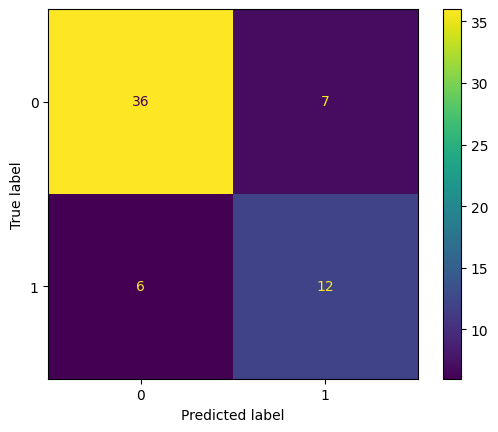

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['Logistic Regression Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

In [ ]:
from sklearn.metrics import roc_curve, auc
from matplotlib import pyplot as plt

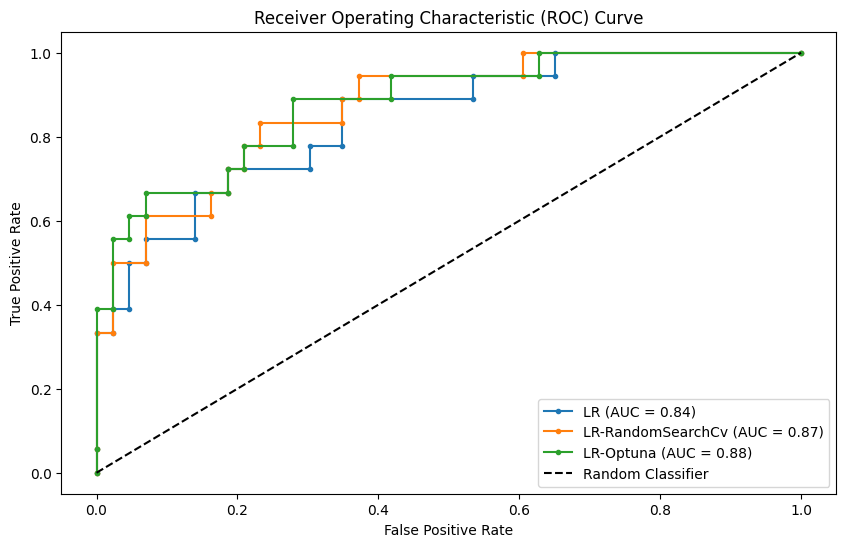

In [ ]:
y_predict_proba = model_lr.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_lr_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

lr_fpr, lr_tpr, tresholds = roc_curve(y_test, y_predict_proba)
lr_auc = auc(lr_fpr, lr_tpr)

lr_best_fpr, lr_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
lr_best_auc = auc(lr_best_fpr, lr_best_tpr)

lr_optuna_fpr, lr_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
lr_optuna_auc = auc(lr_optuna_fpr, lr_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(lr_fpr, lr_tpr, label=f'LR (AUC = {lr_auc:.2f})', linestyle='-', marker='.')
plt.plot(lr_best_fpr, lr_best_tpr, label=f'LR-RandomSearchCv (AUC = {lr_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(lr_optuna_fpr, lr_optuna_tpr, label=f'LR-Optuna (AUC = {lr_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):

    C = trial.suggest_float('C', 0.09, 0.1)
    param_dict = {'solver': 'liblinear', 'penalty': 'l1', 'C': C, 'max_iter': 78, 'tol': 0.09961971274742223, 'class_weight': 'balanced'}

    model = LogisticRegression(**param_dict)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 18:01:18,193] A new study created in memory with name: no-name-d5681fbf-b5a4-448c-820a-9082b7e8cf6d
[I 2024-11-20 18:01:18,317] Trial 1 finished with value: 0.8182823129251702 and parameters: {'C': 0.09674020917756207}. Best is trial 1 with value: 0.8182823129251702.
[I 2024-11-20 18:01:18,345] Trial 0 finished with value: 0.8182823129251702 and parameters: {'C': 0.09824797296668555}. Best is trial 1 with value: 0.8182823129251702.
[I 2024-11-20 18:01:18,454] Trial 2 finished with value: 0.8181972789115646 and parameters: {'C': 0.09356067878853724}. Best is trial 1 with value: 0.8182823129251702.
[I 2024-11-20 18:01:18,501] Trial 3 finished with value: 0.8141156462585034 and parameters: {'C': 0.099109231436847}. Best is trial 1 with value: 0.8182823129251702.
[I 2024-11-20 18:01:18,585] Trial 4 finished with value: 0.8099489795918366 and parameters: {'C': 0.09546305316378427}. Best is trial 1 with value: 0.8182823129251702.
[I 2024-11-20 18:01:18,647] Trial 5 finished wit

In [ ]:
model_optuna = LogisticRegression(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

LogisticRegression(C=0.0992342227620536)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8032786885245902


In [ ]:
accuracy_dict['Logistic Regression Optuna After'] = model_optuna.score(X_test, y_test)

# KNN **ALGORITHM**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
y_predict_knn = model_knn.predict(X_test)
model_knn.score(X_test, y_test)

0.7540983606557377

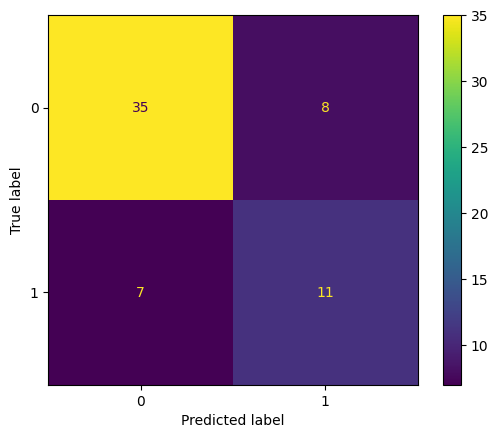

In [ ]:
v = confusion_matrix(y_test, y_predict_knn)
cm = ConfusionMatrixDisplay(v, display_labels=model_knn.classes_)
cm.plot()

In [ ]:
print(classification_report(y_test, y_predict_knn))

              precision    recall  f1-score   support

           0       0.83      0.81      0.82        43
           1       0.58      0.61      0.59        18

    accuracy                           0.75        61
   macro avg       0.71      0.71      0.71        61
weighted avg       0.76      0.75      0.76        61



In [ ]:
accuracy_dict['KNN'] = model_knn.score(X_test, y_test)

NameError: name 'accuracy_dict' is not defined

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'n_neighbors': [3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [2, 5, 10, 20, 30, 40, 50],
    'metric': ['minkowski', 'manhattan', 'euclidean', 'chebyshev'],
    'n_jobs': [-1, None]
}

In [ ]:
random_search = RandomizedSearchCV(model_knn, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=KNeighborsClassifier(), n_iter=200,
                   n_jobs=-1,
                   param_distributions={'algorithm': ['auto', 'ball_tree',
                                                      'kd_tree', 'brute'],
                                        'leaf_size': [2, 5, 10, 20, 30, 40, 50],
                                        'metric': ['minkowski', 'manhattan',
                                                   'euclidean', 'chebyshev'],
                                        'n_jobs': [-1, None],
                                        'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10,
                                                        11, 12, 13, 14, 15, 16,
                                                        17, 18, 19, 20, 21, 22,
                                                        23, 24, 25, 26, 27, 28,
                                                        29, 30],
                                        'weights': ['uniform', 'distance']},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'weights': 'distance',
 'n_neighbors': 22,
 'n_jobs': None,
 'metric': 'manhattan',
 'leaf_size': 20,
 'algorithm': 'brute'}

In [ ]:
random_search.best_score_

0.8845238095238095

In [ ]:
model_knn_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_knn_best.predict(X_test)

In [ ]:
print(model_knn_best.score(X_test, y_test))

0.819672131147541


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.86      0.88      0.87        43
           1       0.71      0.67      0.69        18

    accuracy                           0.82        61
   macro avg       0.78      0.78      0.78        61
weighted avg       0.82      0.82      0.82        61



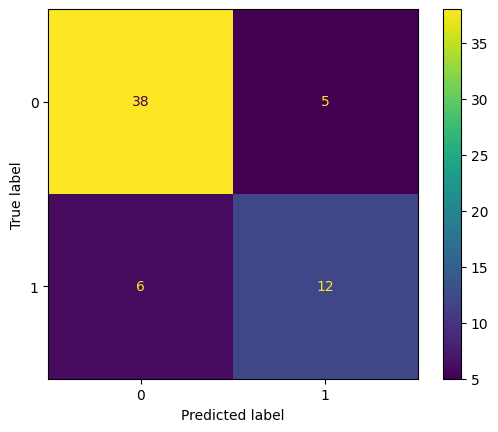

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_knn_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['KNN Random'] = model_knn_best.score(X_test, y_test)

# **Optuna Optimization**

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

In [ ]:
import sklearn.neighbors

In [ ]:
def objective(trial):

    n_neighbors = trial.suggest_int('n_neighbors', 3, 25)

    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])

    algorithm = trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute'])

    leaf_size = trial.suggest_int('leaf_size', 2, 50)

    metric = trial.suggest_categorical("metric", ['euclidean', 'chebyshev', 'manhattan', 'minkowski'])

    n_jobs = trial.suggest_categorical('n_jobs', [-1, None])

    model = KNeighborsClassifier(
        n_neighbors=n_neighbors,
        weights=weights,
        algorithm=algorithm,
        leaf_size=leaf_size,
        metric=metric,
        n_jobs=n_jobs)

    try:
        kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
        accuracy = score.mean()
    except ValueError as e:
        print(f"Error: {e}")
        return -float('inf')
    except sklearn.neighbors.base.KNeighborsWarning as e:
        print(f"Warning: {e}")


    return accuracy

In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 18:01:47,285] A new study created in memory with name: no-name-98ea9855-7752-42e3-a921-3562dc425e2a
[I 2024-11-20 18:01:47,393] Trial 0 finished with value: 0.8431972789115646 and parameters: {'n_neighbors': 13, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 34, 'metric': 'manhattan', 'n_jobs': -1}. Best is trial 0 with value: 0.8431972789115646.
[I 2024-11-20 18:01:47,426] Trial 1 finished with value: 0.7313775510204081 and parameters: {'n_neighbors': 20, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 45, 'metric': 'chebyshev', 'n_jobs': None}. Best is trial 0 with value: 0.8431972789115646.
[I 2024-11-20 18:01:47,568] Trial 3 finished with value: 0.8556972789115648 and parameters: {'n_neighbors': 21, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 28, 'metric': 'minkowski', 'n_jobs': None}. Best is trial 3 with value: 0.8556972789115648.
[I 2024-11-20 18:01:47,613] Trial 2 finished with value: 0.8017857142857142 and parameters: {'n_neighbors

In [ ]:
model_optuna = KNeighborsClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



KNeighborsClassifier(algorithm='ball_tree', leaf_size=17, metric='manhattan',
                     n_neighbors=20, weights='distance')

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(model_optuna.score(X_test, y_test))

0.819672131147541


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(classification_report(y_test, y_predict_optuna))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



              precision    recall  f1-score   support

           0       0.86      0.88      0.87        43
           1       0.71      0.67      0.69        18

    accuracy                           0.82        61
   macro avg       0.78      0.78      0.78        61
weighted avg       0.82      0.82      0.82        61



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



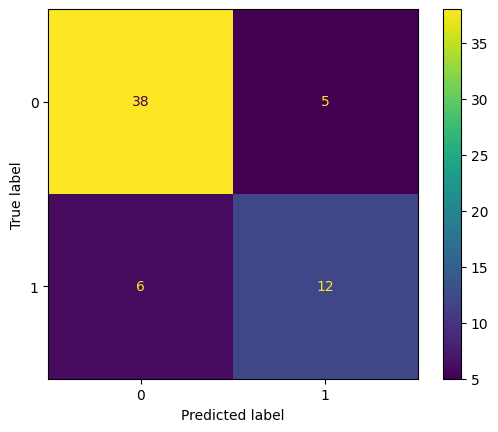

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['KNN Optuna'] = model_optuna.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **ROC Curve**

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

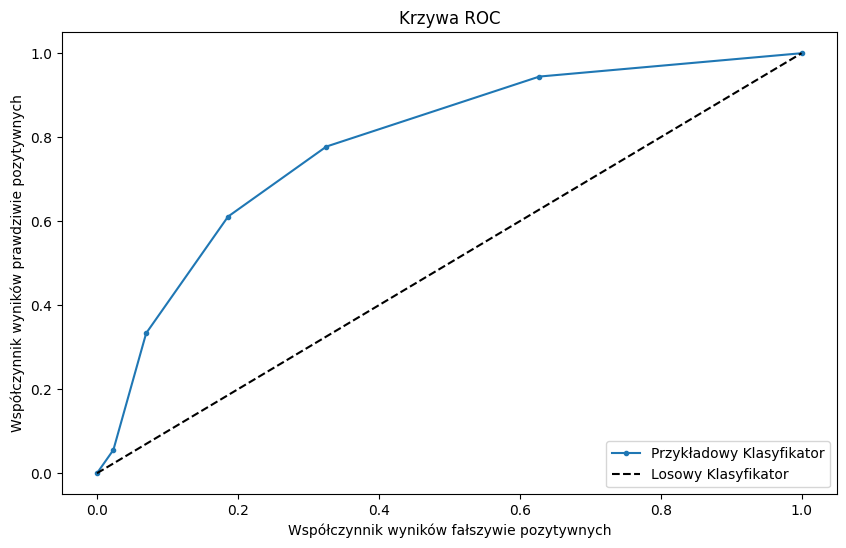

In [ ]:
y_predict_proba = model_knn.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_knn_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

knn_fpr, knn_tpr, tresholds = roc_curve(y_test, y_predict_proba)
knn_auc = auc(knn_fpr, knn_tpr)

knn_best_fpr, knn_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
knn_best_auc = auc(knn_best_fpr, knn_best_tpr)

knn_optuna_fpr, knn_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
knn_optuna_auc = auc(knn_optuna_fpr, knn_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(knn_fpr, knn_tpr, label=f'KNN (AUC = {knn_auc:.2f})', linestyle='-', marker='.')
plt.plot(knn_best_fpr, knn_best_tpr, label=f'KNN-RandomSearchCv (AUC = {knn_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(knn_optuna_fpr, knn_optuna_tpr, label=f'KNN-Optuna (AUC = {knn_optuna_auc:.2f})', linestyle='-', marker='_')
plt.plot([0, 1], [0, 1], 'k--', label='Losowy Klasyfikator')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):

    n_neighbors = trial.suggest_int('n_neighbors', 3, 30)

    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
    # Weight function used in prediction. Possible values:
    # uniform: uniform weights. All points in each neighborhood are weighted equally.
    #distance: weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.

    algorithm = trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute'])

    leaf_size = trial.suggest_int('leaf_size', 2, 50)

    metric = trial.suggest_categorical("metric", ['minkowski','euclidean', 'manhattan'])

    n_jobs = trial.suggest_categorical('n_jobs', [-1, None])

    model = KNeighborsClassifier(
        n_neighbors=n_neighbors,
        weights=weights,
        algorithm=algorithm,
        leaf_size=leaf_size,
        metric=metric,
        n_jobs=n_jobs)

    try:
        kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
        accuracy = score.mean()
    except ValueError as e:
        print(f"Error: {e}")
        return -float('inf')
    except sklearn.neighbors.base.KNeighborsWarning as e:
        print(f"Warning: {e}")


    return accuracy

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

[I 2024-11-20 18:02:25,124] A new study created in memory with name: no-name-739cdbb6-471c-41c2-a4c9-99ce72fea5e5
[I 2024-11-20 18:02:25,230] Trial 0 finished with value: 0.8348639455782314 and parameters: {'n_neighbors': 23, 'weights': 'distance', 'algorithm': 'brute', 'leaf_size': 49, 'metric': 'minkowski', 'n_jobs': None}. Best is trial 0 with value: 0.8348639455782314.
[I 2024-11-20 18:02:25,496] Trial 2 finished with value: 0.8721088435374149 and parameters: {'n_neighbors': 14, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 13, 'metric': 'euclidean', 'n_jobs': -1}. Best is trial 2 with value: 0.8721088435374149.
[I 2024-11-20 18:02:25,508] Tria

In [ ]:
model_optuna = KNeighborsClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



KNeighborsClassifier(algorithm='brute', leaf_size=44, metric='manhattan',
                     n_jobs=-1, n_neighbors=20, weights='distance')

In [ ]:
print(model_optuna.score(X_test, y_test))

0.819672131147541


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
accuracy_dict['KNN Optuna After'] = model_optuna.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **LIGHTGBM ALGORITHM**

In [ ]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
model_lgb = lgb.LGBMClassifier()
model_lgb.fit(X_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000547 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 857
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: 

LGBMClassifier()

In [ ]:
y_predict_lgb = model_lgb.predict(X_test)

In [ ]:
print(model_lgb.score(X_test, y_test))

0.8688524590163934


In [ ]:
print(classification_report(y_test, y_predict_lgb))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91        43
           1       0.86      0.67      0.75        18

    accuracy                           0.87        61
   macro avg       0.86      0.81      0.83        61
weighted avg       0.87      0.87      0.86        61



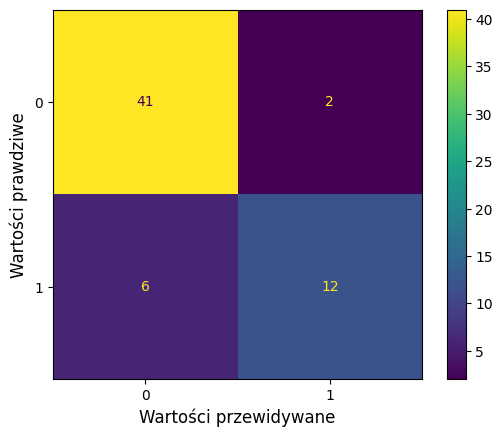

In [ ]:
v = confusion_matrix(y_test, y_predict_lgb)
cm = ConfusionMatrixDisplay(v, display_labels=model_lgb.classes_)
cm.plot()

cm.ax_.set_xlabel("Wartości przewidywane", fontsize=12)
cm.ax_.set_ylabel("Wartości prawdziwe", fontsize=12)

cm.figure_.canvas.draw()

In [ ]:
accuracy_dict['LightGBM'] = model_lgb.score(X_test, y_test)

# **Hyperparameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'boosting_type': ['gbdt'],
    'num_leaves': [250, 300, 320, 350, 370, 400],
    'learning_rate': [0.1, 0.12, 0.15, 0.18 ,0.2, 0.3],
    'num_iterations': [500, 600, 700, 750, 800, 850, 900],
    'max_bin': [512, 1024],
    'objective': ['binary',],
}


In [ ]:
random_search = RandomizedSearchCV(model_lgb, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000423 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 857
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_iter=200, n_jobs=-1,
                   param_distributions={'boosting_type': ['gbdt'],
                                        'learning_rate': [0.1, 0.12, 0.15, 0.18,
                                                          0.2, 0.3],
                                        'max_bin': [512, 1024],
                                        'num_iterations': [500, 600, 700, 750,
                                                           800, 850, 900],
                                        'num_leaves': [250, 300, 320, 350, 370,
                                                       400],
                                        'objective': ['binary']},
                   random_state=42, scoring='accuracy')

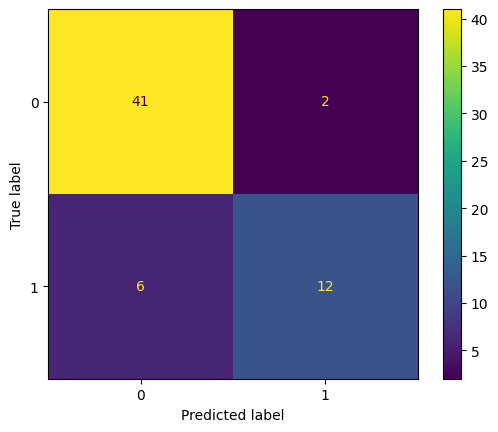

In [ ]:
y_predict_random = random_search_model.predict(X_test)
v = confusion_matrix(y_test, y_predict_random)
cm = ConfusionMatrixDisplay(v, display_labels=random_search_model.classes_)
cm.plot()

In [ ]:
random_search.best_params_

{'objective': 'binary',
 'num_leaves': 320,
 'num_iterations': 800,
 'max_bin': 1024,
 'learning_rate': 0.1,
 'boosting_type': 'gbdt'}

In [ ]:
random_search.best_score_

0.8759353741496598

In [ ]:
model_lgb_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_lgb_best.predict(X_test)

In [ ]:
print(model_lgb_best.score(X_test, y_test))

0.8688524590163934


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90        43
         1.0       0.80      0.67      0.73        18

    accuracy                           0.85        61
   macro avg       0.83      0.80      0.81        61
weighted avg       0.85      0.85      0.85        61



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



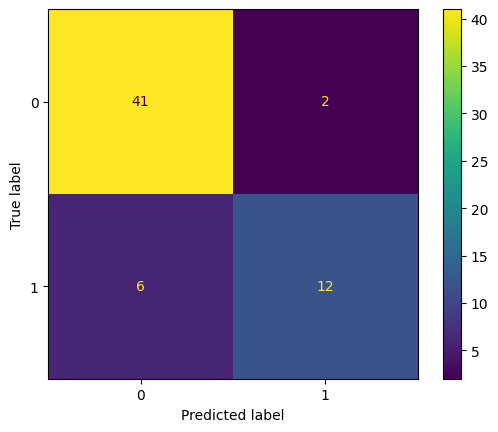

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_lgb_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['LightGBM Random'] = model_lgb_best.score(X_test, y_test)

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 19.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.1 MB/s eta 0:00:00


# **Optuna Optimization**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.6 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [ ]:
def objective(trial):
    param_dict = {
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt']),
        'num_leaves': trial.suggest_int('num_leaves', 300, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_iterations': trial.suggest_int('num_iterations', 500, 900),
        'max_bin': 1024,
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 100),
        'objective': trial.suggest_categorical('objective', ['binary']),
    }

    model = lgb.LGBMClassifier(**param_dict)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 16:50:03,454] A new study created in memory with name: no-name-2bdd2422-66f7-4abe-a5a2-26ebf2e9f730
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/u

In [ ]:
model_optuna = lgb.LGBMClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

LGBMClassifier(learning_rate=0.1445320982261467, min_data_in_leaf=39,
               num_iterations=833, num_leaves=382, objective='binary')

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39


In [ ]:
print(model_optuna.score(X_test, y_test))

[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
0.8852459016393442


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92        43
           1       0.87      0.72      0.79        18

    accuracy                           0.89        61
   macro avg       0.88      0.84      0.85        61
weighted avg       0.88      0.89      0.88        61



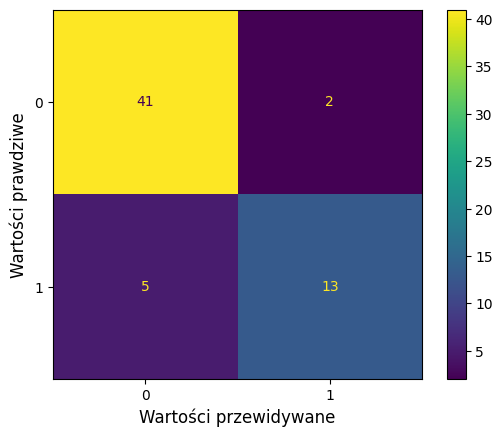

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

cm.ax_.set_xlabel("Wartości przewidywane", fontsize=12)
cm.ax_.set_ylabel("Wartości prawdziwe", fontsize=12)

cm.figure_.canvas.draw()

In [ ]:
accuracy_dict['LightGBM Optuna'] = model_optuna.score(X_test, y_test)

[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39


# **ROC Curve**

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39


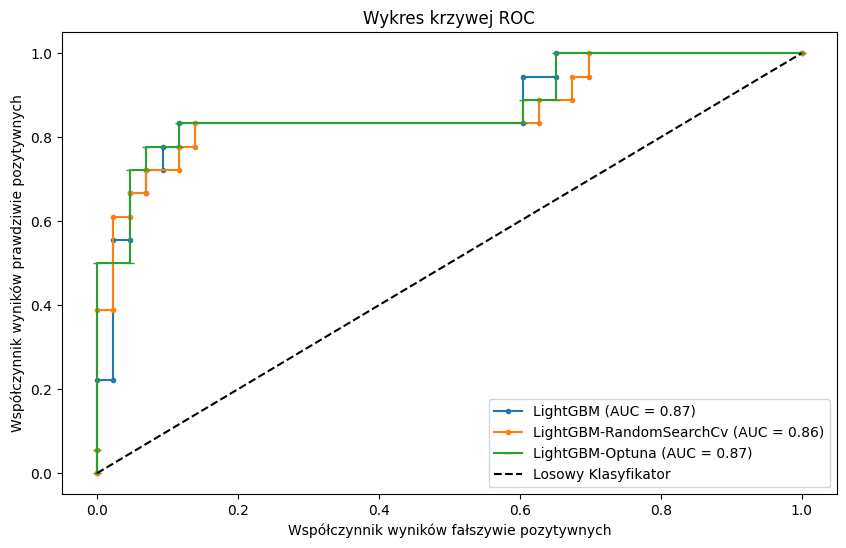

In [ ]:
y_predict_proba = model_lgb.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_lgb_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

lgb_fpr, lgb_tpr, tresholds = roc_curve(y_test, y_predict_proba)
lgb_auc = auc(lgb_fpr, lgb_tpr)

lgb_best_fpr, lgb_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
lgb_best_auc = auc(lgb_best_fpr, lgb_best_tpr)

lgb_optuna_fpr, lgb_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
lgb_optuna_auc = auc(lgb_optuna_fpr, lgb_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(lgb_fpr, lgb_tpr, label=f'LightGBM (AUC = {lgb_auc:.2f})', linestyle='-', marker='.')
plt.plot(lgb_best_fpr, lgb_best_tpr, label=f'LightGBM-RandomSearchCv (AUC = {lgb_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(lgb_optuna_fpr, lgb_optuna_tpr, label=f'LightGBM-Optuna (AUC = {lgb_optuna_auc:.2f})', linestyle='-', marker='_')
plt.plot([0, 1], [0, 1], 'k--', label='Losowy Klasyfikator')
plt.xlabel('Współczynnik wyników fałszywie pozytywnych')
plt.ylabel('Współczynnik wyników prawdziwie pozytywnych')
plt.title('Wykres krzywej ROC')
plt.legend(loc="lower right")
plt.show()



# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

## **Optuna After choosing the most important hyperparameters**

In [ ]:
def objective(trial):
    param_dict = {
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt']),
        'num_leaves': trial.suggest_int('num_leaves', 300, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_iterations': trial.suggest_int('num_iterations', 500, 900),
        'max_bin': 1024,
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 25, 60),
        'objective': trial.suggest_categorical('objective', ['binary']),
    }

    model = lgb.LGBMClassifier(**param_dict)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 21:49:53,920] A new study created in memory with name: no-name-a8a8290d-9a87-4c54-93a1-75363a5dd890
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument

/usr/local/lib/p

In [ ]:
model_optuna_after = lgb.LGBMClassifier(**optuna_study.best_params)
model_optuna_after.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

LGBMClassifier(learning_rate=0.07676636496090714, min_data_in_leaf=38,
               num_iterations=817, num_leaves=358, objective='binary')

In [ ]:
y_predict_optuna_after = model_optuna_after.predict(X_test)

[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=38


In [ ]:
print(model_optuna_after.score(X_test, y_test))

[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=38
0.8688524590163934


In [ ]:
accuracy_dict['LightGBM Optuna After'] = model_optuna_after.score(X_test, y_test)

[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=38


# **XGBOOST CLASSIFIER ALGORITHM**

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_xgb = XGBClassifier()
model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_predict_xgb = model_xgb.predict(X_test)

In [ ]:
print(model_xgb.score(X_test, y_test))

0.8524590163934426


In [ ]:
print(classification_report(y_test, y_predict_xgb))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90        43
           1       0.85      0.61      0.71        18

    accuracy                           0.85        61
   macro avg       0.85      0.78      0.81        61
weighted avg       0.85      0.85      0.84        61



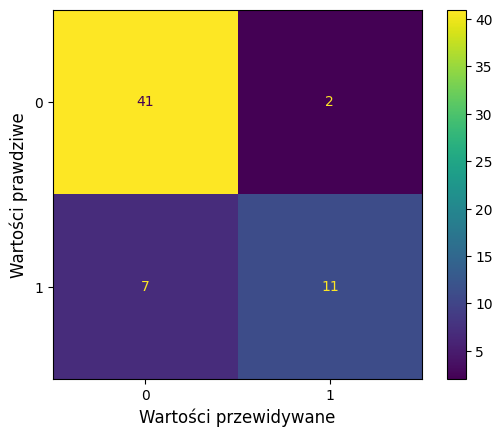

In [ ]:
v = confusion_matrix(y_test, y_predict_xgb)
cm = ConfusionMatrixDisplay(v, display_labels=model_xgb.classes_)
cm.plot()

cm.ax_.set_xlabel("Wartości przewidywane", fontsize=12)
cm.ax_.set_ylabel("Wartości prawdziwe", fontsize=12)

cm.figure_.canvas.draw()

In [ ]:
accuracy_dict['XGBoost'] = model_xgb.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:

param_dict = {
    # Booster (silnik) modelu
    'booster': ['gbtree'],

    'n_estimators': [100, 160, 200, 300, 500],

    # Learning rate (tempo uczenia)
    'learning_rate': [0.01, 0.1, 0.2, 0.3],

    # Drzewo decyzyjne - głębokość
    'max_depth': [3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15],


    # Kolumny na poziomie drzewa, używane do uczenia
    'colsample_bytree': [0.6, 0.7, 0.9, 1],

    # Funkcja kosztu
    'objective': ['binary:logistic'],


    # Gamma - minimalna redukcja straty w celu podziału węzła
    'gamma': [0, 0.05, 0.1, 0.2,],

}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
random_search = RandomizedSearchCV(model_xgb, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'booster': ['gbtree'],
                                        'colsample_bytree': [0.6, 0.7, 0.9, 1],
                                        'gamma': [0, 0.05, 0.1, 0.2],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.3],
                                        'max_depth': [3, 4, 5, 6, 7, 8, 10, 12,
                                                      13, 14, 15],
                                        'n_estimators': [100, 160, 200, 300,
                                                         500],
                                        'objective': ['binary:logistic']},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



{'objective': 'binary:logistic',
 'n_estimators': 300,
 'max_depth': 7,
 'learning_rate': 0.2,
 'gamma': 0.05,
 'colsample_bytree': 0.7,
 'booster': 'gbtree'}

In [ ]:
random_search.best_score_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.8843537414965986

In [ ]:
params = {'objective': 'binary:logistic',
 'n_estimators': 300,
 'max_depth': 7,
 'learning_rate': 0.2,
 'gamma': 0.05,
 'colsample_bytree': 0.7,
 'booster': 'gbtree'}
model_xgb_best = XGBClassifier(**params)
model_xgb_best.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.05, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
model_xgb_best = random_search.best_estimator_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
y_predict_best = model_xgb_best.predict(X_test)

In [ ]:
print(model_xgb_best.score(X_test, y_test))

0.8852459016393442


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.88      0.98      0.92        43
           1       0.92      0.67      0.77        18

    accuracy                           0.89        61
   macro avg       0.90      0.82      0.85        61
weighted avg       0.89      0.89      0.88        61



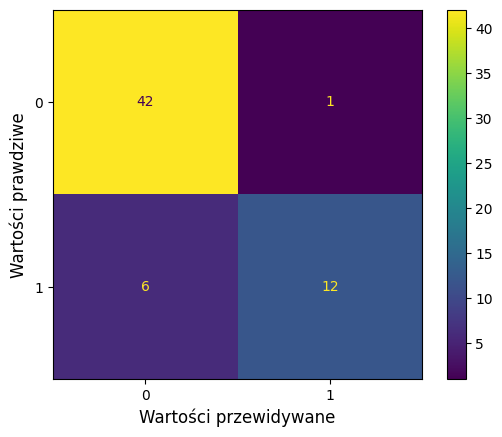

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_xgb_best.classes_)
cm.plot()

cm.ax_.set_xlabel("Wartości przewidywane", fontsize=12)
cm.ax_.set_ylabel("Wartości prawdziwe", fontsize=12)

cm.figure_.canvas.draw()

In [ ]:
accuracy_dict['XGBoost Random'] = model_xgb_best.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Optuna Optimization**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.4 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [ ]:
def objective(trial):

    booster = trial.suggest_categorical('booster', ['gbtree'])

    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3)
    objective = 'binary:logistic'

    params = {
        'booster': booster,
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': learning_rate,
        'objective': objective,
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 4),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.9, 1.3),
        'reg_alpha': trial.suggest_float('reg_alpha', 1.8, 2.0),
        # 'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 0.2),
        # 'max_delta_step': trial.suggest_int('max_delta_step', 0, 20),
        # 'scale_pos_weight': scale_pos_weight,
        'grow_policy': trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide'])
        }

    model = XGBClassifier(**params)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    # scores = cross_validate(model, X_train, y_train, cv=kfold, scoring='roc_auc', return_train_score=True)
    # mean_roc_auc = scores['test_score'].mean()  # Średni wynik ROC AUC dla zbioru testowego
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-12-16 17:42:47,652] A new study created in memory with name: no-name-7f43953f-37da-4479-ace1-8510caf4c1db
[I 2024-12-16 17:42:49,546] Trial 1 finished with value: 0.8680272108843538 and parameters: {'booster': 'gbtree', 'learning_rate': 0.11493971299872166, 'n_estimators': 128, 'max_depth': 13, 'min_child_weight': 4, 'colsample_bytree': 0.9037076173326476, 'reg_lambda': 1.0136337710449097, 'reg_alpha': 1.968578994828295, 'gamma': 0.1049302103801189, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.8680272108843538.
[I 2024-12-16 17:42:50,045] Trial 0 finished with value: 0.8596938775510203 and parameters: {'booster': 'gbtree', 'learning_rate': 0.07085821569493096, 'n_estimators': 119, 'max_depth': 13, 'min_child_weight': 1, 'colsample_bytree': 0.7539976706679423, 'reg_lambda': 0.9163879413602275, 'reg_alpha': 1.9533163641396925, 'gamma': 0.004894981960670242, 'grow_policy': 'lossguide'}. Best is trial 1 with value: 0.8680272108843538.
[I 2024-12-16 17:42:52,004] Trial

In [ ]:
model_optuna = XGBClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8568362719792596, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.0036679854826914375,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints=None, learning_rate=0.11938081543262644,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=266, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8688524590163934


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91        43
           1       0.86      0.67      0.75        18

    accuracy                           0.87        61
   macro avg       0.86      0.81      0.83        61
weighted avg       0.87      0.87      0.86        61



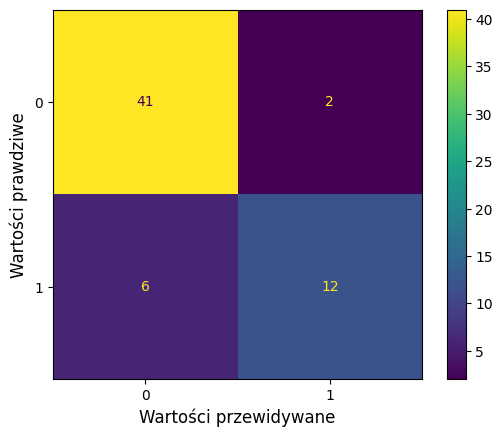

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

cm.ax_.set_xlabel("Wartości przewidywane", fontsize=12)
cm.ax_.set_ylabel("Wartości prawdziwe", fontsize=12)

cm.figure_.canvas.draw()

In [ ]:
accuracy_dict['XGBoost Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

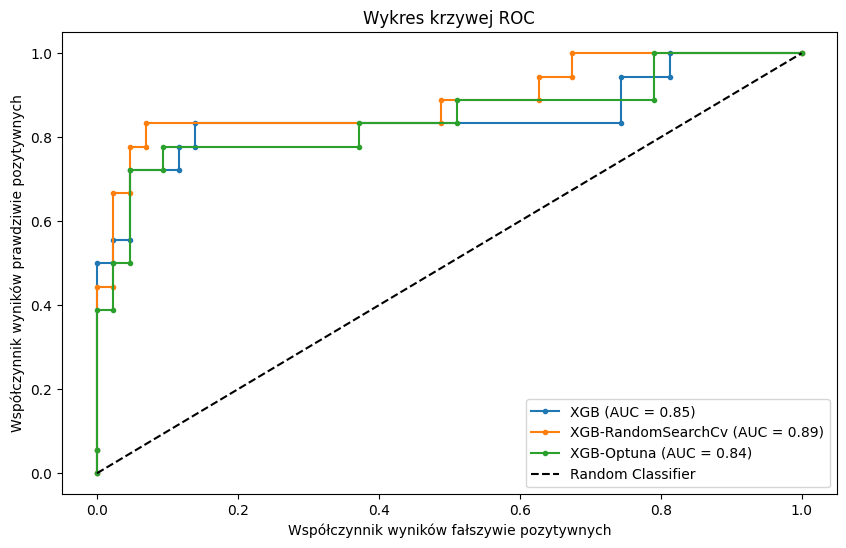

In [ ]:
y_predict_proba = model_xgb.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_xgb_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

xgb_fpr, xgb_tpr, tresholds = roc_curve(y_test, y_predict_proba)
xgb_auc = auc(xgb_fpr, xgb_tpr)

xgb_best_fpr, xgb_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
xgb_best_auc = auc(xgb_best_fpr, xgb_best_tpr)

xgb_optuna_fpr, xgb_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
xgb_optuna_auc = auc(xgb_optuna_fpr, xgb_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(xgb_fpr, xgb_tpr, label=f'XGB (AUC = {xgb_auc:.2f})', linestyle='-', marker='.')
plt.plot(xgb_best_fpr, xgb_best_tpr, label=f'XGB-RandomSearchCv (AUC = {xgb_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(xgb_optuna_fpr, xgb_optuna_tpr, label=f'XGB-Optuna (AUC = {xgb_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('Współczynnik wyników fałszywie pozytywnych')
plt.ylabel('Współczynnik wyników prawdziwie pozytywnych')
plt.title('Wykres krzywej ROC')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Optuna after choosing most important hyperparameters**

In [ ]:
def objective(trial):

    booster = trial.suggest_categorical('booster', ['gbtree'])

    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3)
    objective = 'binary:logistic'

    scale_pos_weight = 1

    params = {
        'booster': booster,
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': learning_rate,
        'objective': objective,
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 3, 8),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.9, 1.3),
        'reg_alpha': trial.suggest_float('reg_alpha', 1.8, 2.0),
        # 'subsample': trial.suggest_float('subsample', 0.7, 1.0),
        'gamma': trial.suggest_float('gamma', 0.0, 0.2),
        # 'max_delta_step': trial.suggest_int('max_delta_step', 0, 20),
        # 'scale_pos_weight': scale_pos_weight,
        'grow_policy': trial.suggest_categorical('grow_policy', ['depthwise', 'lossguide'])
        }

    model = XGBClassifier(**params)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    # scores = cross_validate(model, X_train, y_train, cv=kfold, scoring='roc_auc', return_train_score=True)
    # mean_roc_auc = scores['test_score'].mean()  # Średni wynik ROC AUC dla zbioru testowego
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

NameError: name 'optuna' is not defined

In [ ]:
model_optuna = XGBClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7348190108143102, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.1325098451738498,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints=None, learning_rate=0.17685214346150832,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=340, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

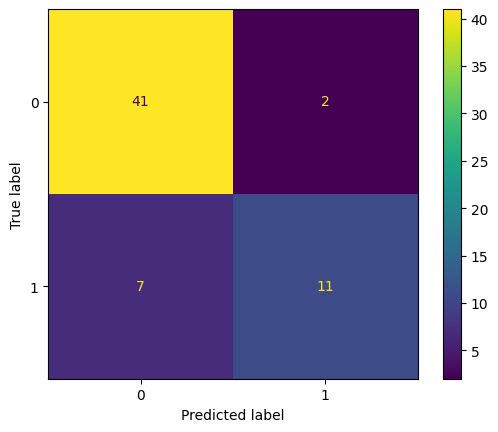

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8688524590163934


In [ ]:
accuracy_dict['XGBoost Optuna After'] = model_optuna.score(X_test, y_test)

# **GradientBoostingClassifier**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_gbc = GradientBoostingClassifier()
model_gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_predict_gbc = model_gbc.predict(X_test)


In [ ]:
print(model_gbc.score(X_test, y_test))

0.8524590163934426


In [ ]:
print(classification_report(y_test, y_predict_gbc))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90        43
           1       0.85      0.61      0.71        18

    accuracy                           0.85        61
   macro avg       0.85      0.78      0.81        61
weighted avg       0.85      0.85      0.84        61



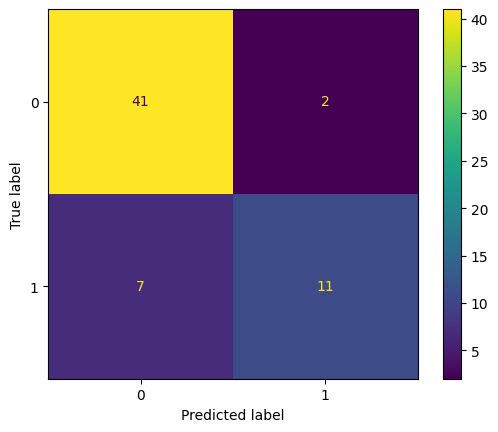

In [ ]:
v = confusion_matrix(y_test, y_predict_gbc)
cm = ConfusionMatrixDisplay(v, display_labels=model_gbc.classes_)
cm.plot()

In [ ]:
accuracy_dict['GradientBoostingClassifier'] = model_gbc.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    # Learning rate (tempo uczenia)
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],

    # Liczba estymatorów (liczba drzew)
    'n_estimators': [50, 100, 200, 300, 400, 500],

    # Maksymalna głębokość drzewa
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],  # Zakres dla umiarkowanie złożonych drzew

    # Minimalna liczba próbek wymagana do podziału węzła
    'min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9, 10],

    # Minimalna liczba próbek w liściu
    'min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 50, 70, 100],  # Większe wartości zapobiegają przeuczeniu

    # Subsampling - część próbek używana do trenowania każdego drzewa
    'subsample': [0.6, 0.7, 0.8, 0.9],

    # Kryterium podziału
    'criterion': ['friedman_mse', 'squared_error'],
}


In [ ]:
random_search = RandomizedSearchCV(model_gbc, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_iter=200,
                   n_jobs=-1,
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2,
                                                          0.3],
                                        'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
                                        'min_samples_leaf': [2, 3, 4, 5, 6, 7,
                                                             8, 9, 10, 20, 30,
                                                             50, 70, 100],
                                        'min_samples_split': [2, 3, 4, 5, 6, 7,
                                                              8, 9, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500],
                                        'subsample': [0.6, 0.7, 0.8, 0.9]},
                   random_state=42, scoring='accuracy')

In [ ]:
best_params = random_search.best_params_
print(best_params)

{'subsample': 0.9, 'n_estimators': 500, 'min_samples_split': 3, 'min_samples_leaf': 20, 'max_depth': 8, 'learning_rate': 0.2, 'criterion': 'squared_error'}


In [ ]:
best_params = {'subsample': 0.7, 'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_depth': 10, 'learning_rate': 0.1, 'criterion': 'squared_error'}

In [ ]:
model_gbc_best = GradientBoostingClassifier(**best_params)
model_gbc_best.fit(X_train, y_train)

GradientBoostingClassifier(criterion='squared_error', learning_rate=0.2,
                           max_depth=8, min_samples_leaf=20,
                           min_samples_split=3, n_estimators=500,
                           subsample=0.9)

In [ ]:
model_gbc_best = random_search.best_estimator_

In [ ]:
print(random_search.best_score_)

0.8884353741496598


In [ ]:
print(model_gbc_best.score(X_test, y_test))

0.8524590163934426


In [ ]:
y_predict_best = model_gbc_best.predict(X_test)

In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90        43
           1       0.85      0.61      0.71        18

    accuracy                           0.85        61
   macro avg       0.85      0.78      0.81        61
weighted avg       0.85      0.85      0.84        61



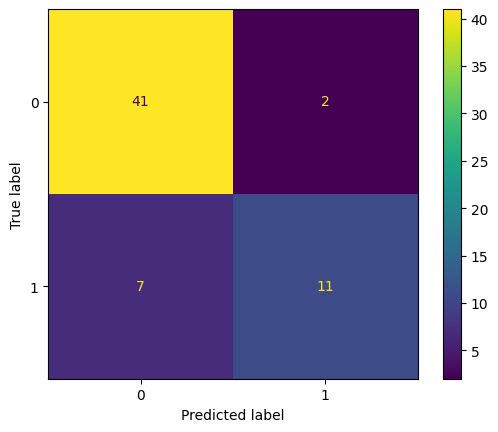

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_gbc_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['GradientBoostingClassifier Random'] = model_gbc_best.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Optuna Optimization**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.7 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [ ]:
def objective(trial):

    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3)
    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    max_depth = trial.suggest_int('max_depth', 4, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 100)
    subsample = trial.suggest_float('subsample', 0.6, 0.9)
    criterion = trial.suggest_categorical('criterion', ['friedman_mse', 'squared_error'])

    model = GradientBoostingClassifier(
        learning_rate=learning_rate,
        max_depth=max_depth,
        n_estimators=n_estimators,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        subsample=subsample,
        criterion=criterion
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = scores.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200)

[I 2024-11-22 16:49:39,402] A new study created in memory with name: no-name-ff598a3d-bee6-40da-98be-902d791ef265
[I 2024-11-22 16:49:49,884] Trial 0 finished with value: 0.8763605442176872 and parameters: {'learning_rate': 0.11861663446573512, 'n_estimators': 478, 'max_depth': 9, 'min_samples_split': 7, 'min_samples_leaf': 17, 'subsample': 0.6467983561008608, 'criterion': 'squared_error'}. Best is trial 0 with value: 0.8763605442176872.
[I 2024-11-22 16:49:52,544] Trial 1 finished with value: 0.7148809523809525 and parameters: {'learning_rate': 0.18432335340553055, 'n_estimators': 369, 'max_depth': 4, 'min_samples_split': 10, 'min_samples_leaf': 84, 'subsample': 0.6637017332034828, 'criterion': 'squared_error'}. Best is trial 0 with value: 0.8763605442176872.
[I 2024-11-22 16:49:55,216] Trial 2 finished with value: 0.781547619047619 and parameters: {'learning_rate': 0.09823025045826593, 'n_estimators': 286, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 62, 'subsample': 0

In [ ]:
best_params = {'learning_rate': 0.24994047523378835, 'n_estimators': 489, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 18, 'subsample': 0.6717237001642296, 'criterion': 'friedman_mse'}

In [ ]:
model_optuna = GradientBoostingClassifier(**best_params)
model_optuna.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.24994047523378835, max_depth=10,
                           min_samples_leaf=18, min_samples_split=10,
                           n_estimators=489, subsample=0.6717237001642296)

In [ ]:
print(optuna_study.best_value)

0.8928571428571429


In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8524590163934426


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91        43
           1       0.86      0.67      0.75        18

    accuracy                           0.87        61
   macro avg       0.86      0.81      0.83        61
weighted avg       0.87      0.87      0.86        61



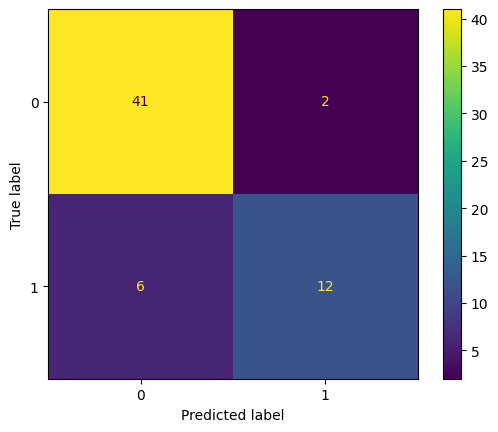

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['GradientBoostingClassifier Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

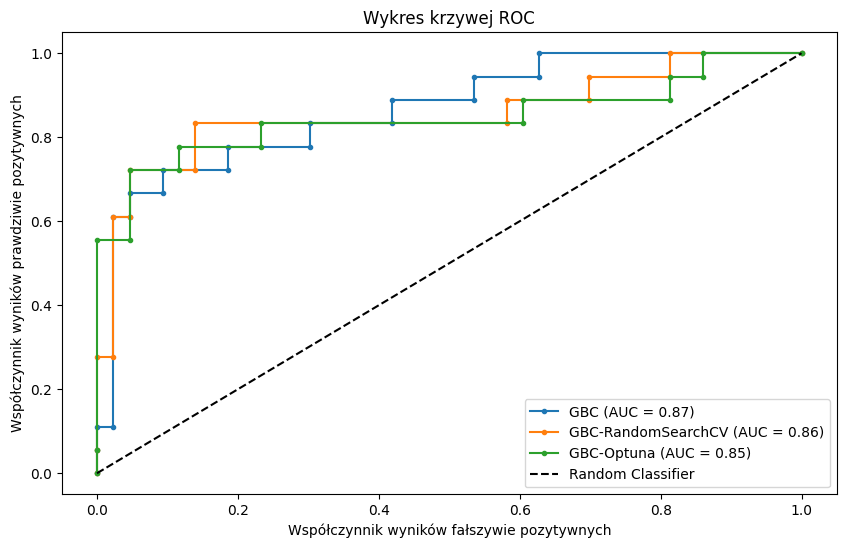

In [ ]:
y_predict_proba = model_gbc.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_gbc_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

gbc_fpr, gbc_tpr, tresholds = roc_curve(y_test, y_predict_proba)
gbc_auc = auc(gbc_fpr, gbc_tpr)

gbc_best_fpr, gbc_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
gbc_best_auc = auc(gbc_best_fpr, gbc_best_tpr)

gbc_optuna_fpr, gbc_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
gbc_optuna_auc = auc(gbc_optuna_fpr, gbc_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(gbc_fpr, gbc_tpr, label=f'GBC (AUC = {gbc_auc:.2f})', linestyle='-', marker='.')
plt.plot(gbc_best_fpr, gbc_best_tpr, label=f'GBC-RandomSearchCV (AUC = {gbc_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(gbc_optuna_fpr, gbc_optuna_tpr, label=f'GBC-Optuna (AUC = {gbc_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('Współczynnik wyników fałszywie pozytywnych')
plt.ylabel('Współczynnik wyników prawdziwie pozytywnych')
plt.title('Wykres krzywej ROC')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):

    learning_rate = trial.suggest_float('learning_rate', 0.09, 0.15)
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    max_depth = trial.suggest_int('max_depth', 5, 8)
    min_samples_split = trial.suggest_int('min_samples_split', 6, 80)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 30)
    subsample = trial.suggest_float('subsample', 0.6, 0.9)
    max_features = 'sqrt'
    criterion = trial.suggest_categorical('criterion', ['friedman_mse', 'squared_error'])
    # min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.5)
    # min_impurity_decrease = trial.suggest_float('min_impurity_decrease', 0.0, 0.1)
    # ccp_alpha = trial.suggest_float('ccp_alpha', 0.0, 0.1)
    # loss = trial.suggest_categorical('loss', ['log_loss', 'exponential'])
    # max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 100)

    model = GradientBoostingClassifier(
        learning_rate=learning_rate,
        max_depth=max_depth,
        n_estimators=n_estimators,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        subsample=subsample,
        max_features=max_features,
        # min_weight_fraction_leaf=min_weight_fraction_leaf,
        # min_impurity_decrease=min_impurity_decrease,
        # ccp_alpha=ccp_alpha,
        # loss=loss,
        criterion=criterion,
        # max_leaf_nodes=max_leaf_nodes
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = scores.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 21:26:10,905] A new study created in memory with name: no-name-7d38560c-e0e6-4601-91d8-c9a84384ed21
[I 2024-11-20 21:26:23,110] Trial 1 finished with value: 0.8764455782312925 and parameters: {'learning_rate': 0.13267796875304452, 'n_estimators': 423, 'max_depth': 7, 'min_samples_split': 80, 'min_samples_leaf': 7, 'subsample': 0.7279414182593599, 'criterion': 'squared_error'}. Best is trial 1 with value: 0.8764455782312925.
[I 2024-11-20 21:26:23,645] Trial 0 finished with value: 0.8764455782312925 and parameters: {'learning_rate': 0.12059888020763132, 'n_estimators': 438, 'max_depth': 6, 'min_samples_split': 16, 'min_samples_leaf': 28, 'subsample': 0.7128567302093378, 'criterion': 'friedman_mse'}. Best is trial 1 with value: 0.8764455782312925.
[I 2024-11-20 21:26:31,136] Trial 2 finished with value: 0.8806972789115648 and parameters: {'learning_rate': 0.11587101095784007, 'n_estimators': 296, 'max_depth': 7, 'min_samples_split': 30, 'min_samples_leaf': 26, 'subsample': 

In [ ]:
model_optuna = GradientBoostingClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.13461900940032673, max_depth=7,
                           min_samples_leaf=16, min_samples_split=55,
                           n_estimators=458, subsample=0.6990707443427004)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8688524590163934


In [ ]:
accuracy_dict['GradientBoostingClassifier Optuna After'] = model_optuna.score(X_test, y_test)

In [ ]:
for key, value in accuracy_dict.items():
  print(f"{key}: {value}")

LightGBM: 0.8688524590163934
LightGBM Optuna: 0.8852459016393442
LightGBM Random: 0.8688524590163934
Logistic Regression: 0.7704918032786885
Logistic Regression Random: 0.7868852459016393
Logistic Regression Optuna: 0.7868852459016393
Logistic Regression Optuna After: 0.8032786885245902
KNN: 0.7540983606557377
KNN Random: 0.819672131147541
KNN Optuna: 0.819672131147541
KNN Optuna After: 0.819672131147541
XGBoost: 0.8524590163934426
XGBoost Random: 0.8688524590163934
XGBoost Optuna: 0.8688524590163934
GradientBoostingClassifier: 0.8524590163934426
GradientBoostingClassifier Random: 0.8688524590163934
GradientBoostingClassifier Optuna: 0.8524590163934426
NuSVC: 0.8032786885245902
NuSVC Random: 0.8032786885245902
NuSVC Optuna: 0.7704918032786885
NuSVC Optuna After: 0.7868852459016393
DecisionTreeClassifier: 0.8360655737704918
DecisionTreeClassifier Optuna: 0.8360655737704918
DecisionTreeClassifier Random: 0.8032786885245902
DecisionTreeClassifier Optuna After: 0.8360655737704918
RandomFor

# **NuSVC ALOGRITHM**

In [ ]:
from sklearn.svm import NuSVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
model_nusvc = NuSVC(probability=True)
model_nusvc.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



NuSVC(probability=True)

In [ ]:
y_predict_nusvc = model_nusvc.predict(X_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(model_nusvc.score(X_test, y_test))

0.8032786885245902


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(classification_report(y_test, y_predict_nusvc))

              precision    recall  f1-score   support

           0       0.82      0.93      0.87        43
           1       0.75      0.50      0.60        18

    accuracy                           0.80        61
   macro avg       0.78      0.72      0.73        61
weighted avg       0.80      0.80      0.79        61



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



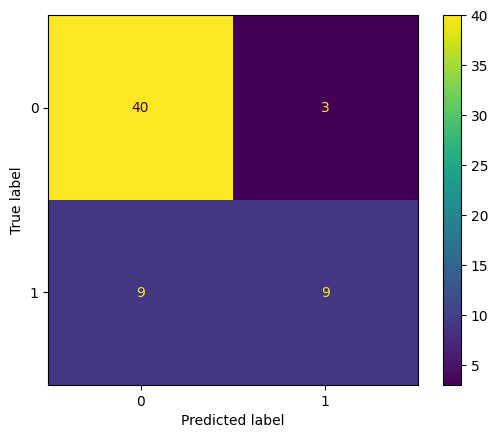

In [ ]:
v = confusion_matrix(y_test, y_predict_nusvc)
cm = ConfusionMatrixDisplay(v, display_labels=model_nusvc.classes_)
cm.plot()

In [ ]:
accuracy_dict['NuSVC'] = model_nusvc.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
param_dict = {
    'nu': [0.1, 0.2, 0.3, 0.35, 0.4, 0.45, 0.5],

    # Jądra
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],

    # Gamma dla kernel 'rbf', 'poly', 'sigmoid'
    'gamma': ['scale', 'auto'],

    # Współczynnik 'coef0' dla 'poly' i 'sigmoid'
    'coef0': [0.0, 0.1, 0.2, 0.3, 0.5, 0.7, 0.9, 1.0],

    # Funkcja decyzyjna: One-vs-Rest lub One-vs-One
    'decision_function_shape': ['ovr', 'ovo']
}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
random_search = RandomizedSearchCV(model_nusvc, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



RandomizedSearchCV(cv=5, estimator=NuSVC(probability=True), n_iter=200,
                   n_jobs=-1,
                   param_distributions={'coef0': [0.0, 0.1, 0.2, 0.3, 0.5, 0.7,
                                                  0.9, 1.0],
                                        'decision_function_shape': ['ovr',
                                                                    'ovo'],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid'],
                                        'nu': [0.1, 0.2, 0.3, 0.35, 0.4, 0.45,
                                               0.5]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



{'nu': 0.35,
 'kernel': 'linear',
 'gamma': 'scale',
 'decision_function_shape': 'ovr',
 'coef0': 0.9}

In [ ]:
random_search.best_score_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.8887755102040817

In [ ]:
model_nusvc_best = random_search.best_estimator_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
y_predict_best = model_nusvc_best.predict(X_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(model_nusvc_best.score(X_test, y_test))

0.8032786885245902


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        43
           1       0.67      0.67      0.67        18

    accuracy                           0.80        61
   macro avg       0.76      0.76      0.76        61
weighted avg       0.80      0.80      0.80        61



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



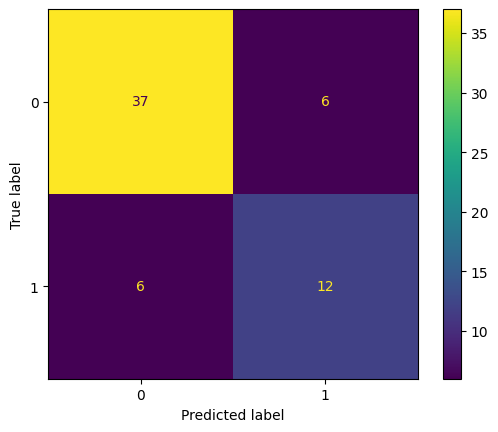

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_nusvc_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['NuSVC Random'] = model_nusvc_best.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Optuna Optimization**

In [ ]:
!pip install optuna

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def objective(trial):
  nu = trial.suggest_float('nu', 0.25, 0.35)
  kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
  gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
  # coef0 = trial.suggest_float('coef0', 0.0, 1.0) if kernel in ['poly', 'sigmoid'] else 0.0
  # # shrinking = trial.suggest_categorical('shrinking', [True, False])
  # tol = trial.suggest_float('tol', 0.0001, 0.1)
  class_weight = 'balanced'
  # decision_function_shape = trial.suggest_categorical('decision_function_shape', ['ovr', 'ovo'])
  # # degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3
  probability = trial.suggest_categorical('probability', [True])

  model = NuSVC(
      nu=nu,
      kernel=kernel,
      # gamma=gamma,
      # degree=degree,
      # coef0=coef0,
      # shrinking=shrinking,
      # tol=tol,
      class_weight=class_weight,
      # decision_function_shape=decision_function_shape,
      probability=probability
  )

  kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  accuracy = score.mean()

  return accuracy



In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 21:43:08,968] A new study created in memory with name: no-name-6400216d-fde0-45d7-9f48-45f804f5be33
[I 2024-11-20 21:43:09,856] Trial 0 finished with value: 0.7767857142857142 and parameters: {'nu': 0.3074086073561475, 'kernel': 'poly', 'gamma': 'auto', 'probability': True}. Best is trial 0 with value: 0.7767857142857142.
[I 2024-11-20 21:43:09,972] Trial 1 finished with value: 0.8475340136054422 and parameters: {'nu': 0.30984239713247763, 'kernel': 'rbf', 'gamma': 'scale', 'probability': True}. Best is trial 1 with value: 0.8475340136054422.
[I 2024-11-20 21:43:10,722] Trial 2 finished with value: 0.8517006802721088 and parameters: {'nu': 0.3269869560166172, 'kernel': 'rbf', 'gamma': 'scale', 'probability': True}. Best is trial 2 with value: 0.8517006802721088.
[I 2024-11-20 21:43:10,776] Trial 3 finished with value: 0.7768707482993198 and parameters: {'nu': 0.28696320935348396, 'kernel': 'poly', 'gamma': 'auto', 'probability': True}. Best is trial 2 with value: 0.851700

In [ ]:
model_optuna = NuSVC(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

NuSVC(gamma='auto', kernel='linear', nu=0.30311672628434166, probability=True)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.7868852459016393


In [ ]:
print(classification_report(y_test, y_predict_optuna))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



              precision    recall  f1-score   support

           0       0.84      0.84      0.84        43
           1       0.61      0.61      0.61        18

    accuracy                           0.77        61
   macro avg       0.72      0.72      0.72        61
weighted avg       0.77      0.77      0.77        61



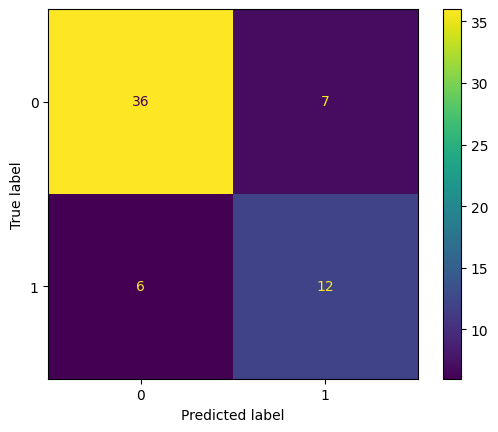

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['NuSVC Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

In [ ]:
y_predict_proba = model_nusvc.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_nusvc_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

nusvc_fpr, nusvc_tpr, tresholds = roc_curve(y_test, y_predict_proba)
nusvc_auc = auc(nusvc_fpr, nusvc_tpr)

nusvc_best_fpr, nusvc_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
nusvc_best_auc = auc(nusvc_best_fpr, nusvc_best_tpr)

nusvc_optuna_fpr, nusvc_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
nusvc_optuna_auc = auc(nusvc_optuna_fpr, nusvc_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(nusvc_fpr, nusvc_tpr, label=f'NUSVC (AUC = {nusvc_auc:.2f})', linestyle='-', marker='.')
plt.plot(nusvc_best_fpr, nusvc_best_tpr, label=f'NUSVC-RandomSearchCv (AUC = {nusvc_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(nusvc_optuna_fpr, nusvc_optuna_tpr, label=f'NUSVC-Optuna (AUC = {nusvc_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

AttributeError: This 'NuSVC' has no attribute 'predict_proba'

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

NameError: name 'optuna' is not defined

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

NameError: name 'optuna' is not defined

## **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):
    # Hiperparametry
    nu = trial.suggest_float('nu', 0.1, 0.3)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto']) if kernel in ['rbf', 'poly'] else 'scale'
    coef0 = trial.suggest_float('coef0', 0.0, 1.0) if kernel in ['poly', 'sigmoid'] else 0.0
    degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3
    tol = trial.suggest_float('tol', 1e-5, 1e-2)
    shrinking = trial.suggest_categorical('shrinking', [True, False])
    probability = True  # Możesz ustawić na stałe, jeśli potrzebujesz probabilistycznych wyników
    class_weight = 'balanced'  # Do obsługi niezbalansowanych zbiorów danych

    # Model
    model = NuSVC(
        nu=nu,
        kernel=kernel,
        gamma=gamma,
        coef0=coef0,
        degree=degree,
        tol=tol,
        shrinking=shrinking,
        class_weight=class_weight,
        probability=probability
    )

    # Walidacja krzyżowa
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

In [ ]:
model_optuna = NuSVC(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

In [ ]:
print(model_optuna.score(X_test, y_test))

In [ ]:
accuracy_dict['NuSVC Optuna After'] = model_optuna.score(X_test, y_test)

# **DECISION-TREE-CLASSIFIER ALGORITHM**


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_predict_dtc = dtc.predict(X_test)

In [ ]:
print(dtc.score(X_test, y_test))

0.8360655737704918


In [ ]:
print(classification_report(y_test, y_predict_dtc))

              precision    recall  f1-score   support

           0       0.82      0.98      0.89        43
           1       0.90      0.50      0.64        18

    accuracy                           0.84        61
   macro avg       0.86      0.74      0.77        61
weighted avg       0.85      0.84      0.82        61



In [ ]:
v = confusion_matrix(y_test, y_predict_dtc)
cm = ConfusionMatrixDisplay(v, display_labels=dtc.classes_)
cm.plot()

In [ ]:
accuracy_dict['DecisionTreeClassifier'] = dtc.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    # Maksymalna głębokość drzewa
    'max_depth': [None, 5, 10, 15, 20, 30, 40, 50, 70, 100, 150],

    # Minimalna liczba próbek wymagana do podziału węzła
    'min_samples_split': [2, 5, 10, 15, 20, 50, 100, 150, 250, 300, 500],  # Większe wartości mogą zapobiegać nadmiernemu dopasowaniu

    # Minimalna liczba próbek, która musi znaleźć się w liściu
    'min_samples_leaf': [1, 2, 5, 10, 15, 20, 50, 100, 150, 200, 250, 300, 500],  # Wyższe wartości prowadzą do bardziej prostych modeli

    # Minimalna waga dla liści
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5],  # Frakcja sumy wag próbki

    # # # Maksymalna liczba cech do rozważenia podczas podziału
    'max_features': [None, 'sqrt'],  # None (domyślnie), 'sqrt' - pierwiastek z liczby cech, 'log2' - logarytmiczne

    # Parametr złożoności przycinania (pruning) – regularyzacja złożoności
    'ccp_alpha': [0.0, 0.01, 0.025, 0.05, 0.075, 0.1, 0.2],  # Im wyższa wartość, tym bardziej model zostanie przycięty

    # Kryterium podziału
    'criterion': ['gini', 'entropy', 'log_loss'],  # Funkcja do pomiaru jakości podziału; 'gini' jest domyślny

    # Strategia wyboru podziału dla węzłów o jednakowych wartościach
    'splitter': ['best', 'random'],

    # Maksymalna liczba węzłów terminalnych
    'max_leaf_nodes': [None, 10, 15, 20, 25, 30, 50, 70, 100, 200],
}


In [ ]:
random_search = RandomizedSearchCV(dtc, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=200,
                   n_jobs=-1,
                   param_distributions={'ccp_alpha': [0.0, 0.01, 0.025, 0.05,
                                                      0.075, 0.1, 0.2],
                                        'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [None, 5, 10, 15, 20, 30,
                                                      40, 50, 70, 100, 150],
                                        'max_features': [None, 'sqrt'],
                                        'max_leaf_nodes': [None, 10, 15, 20, 25,
                                                           30, 50, 70, 100,
                                                           200],
                                        'min_samples_leaf': [1, 2, 5, 10, 15,
                                                             20, 50, 100, 150,
                                                             200, 250, 300,
                                                             500],
                                        'min_samples_split': [2, 5, 10, 15, 20,
                                                              50, 100, 150, 250,
                                                              300, 500],
                                        'min_weight_fraction_leaf': [0.0, 0.1,
                                                                     0.2, 0.3,
                                                                     0.4, 0.5],
                                        'splitter': ['best', 'random']},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'splitter': 'random',
 'min_weight_fraction_leaf': 0.0,
 'min_samples_split': 10,
 'min_samples_leaf': 10,
 'max_leaf_nodes': 200,
 'max_features': None,
 'max_depth': None,
 'criterion': 'entropy',
 'ccp_alpha': 0.025}

In [ ]:
random_search.best_score_

0.8514455782312924

In [ ]:
model_dtc_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_dtc_best.predict(X_test)

In [ ]:
print(model_dtc_best.score(X_test, y_test))

0.8360655737704918


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.80      0.95      0.87        43
           1       0.80      0.44      0.57        18

    accuracy                           0.80        61
   macro avg       0.80      0.70      0.72        61
weighted avg       0.80      0.80      0.78        61



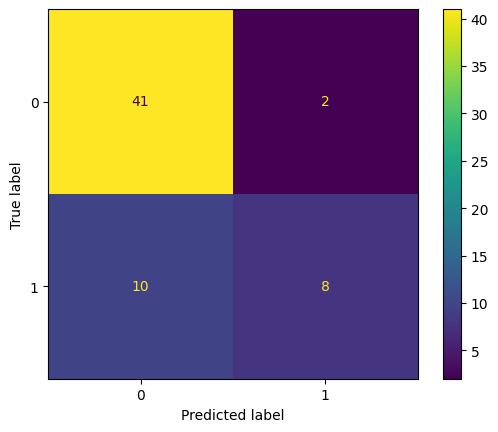

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_dtc_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['DecisionTreeClassifier Random'] = model_dtc_best.score(X_test, y_test)

# **Optuna Optimization**

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

In [ ]:
def objective(trial):
  max_depth = trial.suggest_int('max_depth', 2, 50)
  min_samples_split = trial.suggest_int('min_samples_split', 2, 30)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 30)
  min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.5)
  ccp_alpha = trial.suggest_float('ccp_alpha', 0.0, 0.3)
  criterion = trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
  max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 5, 50)

  model = DecisionTreeClassifier(
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      min_weight_fraction_leaf=min_weight_fraction_leaf,
      ccp_alpha=ccp_alpha,
      criterion=criterion,
      max_leaf_nodes=max_leaf_nodes
  )

  kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  accuracy = score.mean()

  return accuracy

In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-12-02 17:15:49,281] A new study created in memory with name: no-name-874e0161-fe9a-4cd3-aac7-27d0c8cd5798
[I 2024-12-02 17:15:49,460] Trial 0 finished with value: 0.8058673469387754 and parameters: {'max_depth': 28, 'min_samples_split': 13, 'min_samples_leaf': 12, 'min_weight_fraction_leaf': 0.10340166130931433, 'ccp_alpha': 0.05337189873700574, 'criterion': 'entropy', 'max_leaf_nodes': 50}. Best is trial 0 with value: 0.8058673469387754.
[I 2024-12-02 17:15:49,481] Trial 1 finished with value: 0.7148809523809525 and parameters: {'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 3, 'min_weight_fraction_leaf': 0.1179899386055886, 'ccp_alpha': 0.14909197052863132, 'criterion': 'gini', 'max_leaf_nodes': 43}. Best is trial 0 with value: 0.8058673469387754.
[I 2024-12-02 17:15:49,625] Trial 2 finished with value: 0.7521258503401361 and parameters: {'max_depth': 18, 'min_samples_split': 27, 'min_samples_leaf': 27, 'min_weight_fraction_leaf': 0.3799461383506021, 'ccp_alpha':

In [ ]:
model_optuna = DecisionTreeClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.037658617494655905, criterion='entropy',
                       max_depth=44, max_leaf_nodes=37, min_samples_leaf=23,
                       min_samples_split=21,
                       min_weight_fraction_leaf=0.20554208818699893)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8360655737704918


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.85      0.93      0.89        43
           1       0.79      0.61      0.69        18

    accuracy                           0.84        61
   macro avg       0.82      0.77      0.79        61
weighted avg       0.83      0.84      0.83        61



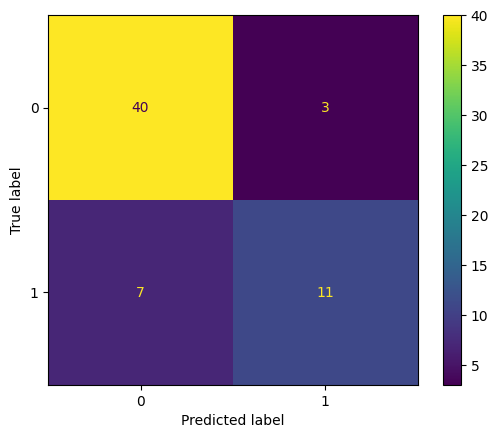

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['DecisionTreeClassifier Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

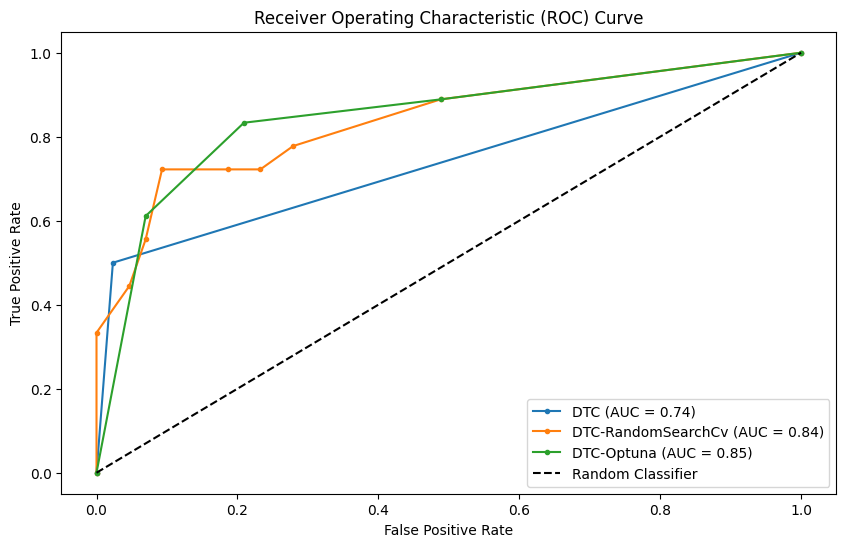

In [ ]:
y_predict_proba = dtc.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_dtc_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

dtc_fpr, dtc_tpr, tresholds = roc_curve(y_test, y_predict_proba)
dtc_auc = auc(dtc_fpr, dtc_tpr)

dtc_best_fpr, dtc_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
dtc_best_auc = auc(dtc_best_fpr, dtc_best_tpr)

dtc_optuna_fpr, dtc_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
dtc_optuna_auc = auc(dtc_optuna_fpr, dtc_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(dtc_fpr, dtc_tpr, label=f'DTC (AUC = {dtc_auc:.2f})', linestyle='-', marker='.')
plt.plot(dtc_best_fpr, dtc_best_tpr, label=f'DTC-RandomSearchCv (AUC = {dtc_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(dtc_optuna_fpr, dtc_optuna_tpr, label=f'DTC-Optuna (AUC = {dtc_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):
  max_depth = trial.suggest_int('max_depth', 2, 20)
  min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20)
  min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.17, 0.25)
  # ccp_alpha = trial.suggest_float('ccp_alpha', 0.0, 0.5)
  # criterion = trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
  # splitter = trial.suggest_categorical('splitter', ['best', 'random'])
  # max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 20)

  model = DecisionTreeClassifier(
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      min_weight_fraction_leaf=min_weight_fraction_leaf,
      # ccp_alpha=ccp_alpha,
      # criterion=criterion,
      # splitter=splitter,
      # max_leaf_nodes=max_leaf_nodes
  )

  kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  accuracy = score.mean()

  return accuracy

In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 18:56:00,158] A new study created in memory with name: no-name-d99005c1-8f29-48e4-a418-85d74ad0c7b8
[I 2024-11-20 18:56:00,293] Trial 0 finished with value: 0.8056122448979591 and parameters: {'max_depth': 14, 'min_samples_split': 6, 'min_samples_leaf': 8, 'min_weight_fraction_leaf': 0.22895216948552885}. Best is trial 0 with value: 0.8056122448979591.
[I 2024-11-20 18:56:00,313] Trial 1 finished with value: 0.7935374149659864 and parameters: {'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 19, 'min_weight_fraction_leaf': 0.19548599121494237}. Best is trial 0 with value: 0.8056122448979591.
[I 2024-11-20 18:56:00,429] Trial 2 finished with value: 0.8056122448979591 and parameters: {'max_depth': 3, 'min_samples_split': 8, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0.2290321574127274}. Best is trial 0 with value: 0.8056122448979591.
[I 2024-11-20 18:56:00,455] Trial 3 finished with value: 0.7437925170068027 and parameters: {'max_depth': 5, 'min_samples_s

In [ ]:
model_optuna = DecisionTreeClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=8, min_samples_leaf=6, min_samples_split=4,
                       min_weight_fraction_leaf=0.2047066240527365)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8360655737704918


In [ ]:
accuracy_dict['DecisionTreeClassifier Optuna After'] = model_optuna.score(X_test, y_test)

# **RANDOM-FOREST ALGORITHM**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_rfc = RandomForestClassifier()
model_rfc.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_predict_rfc = model_rfc.predict(X_test)

In [ ]:
print(model_rfc.score(X_test, y_test))

0.8524590163934426


In [ ]:
print(classification_report(y_test, y_predict_rfc))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90        43
           1       0.85      0.61      0.71        18

    accuracy                           0.85        61
   macro avg       0.85      0.78      0.81        61
weighted avg       0.85      0.85      0.84        61



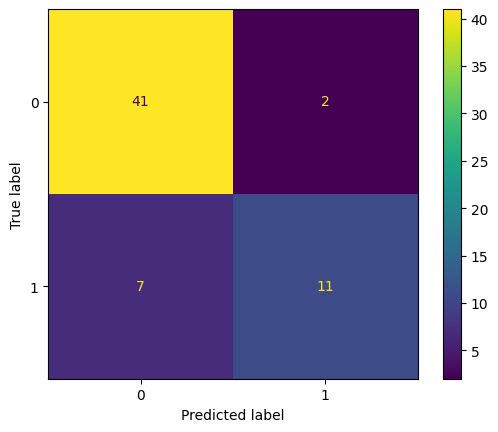

In [ ]:
v = confusion_matrix(y_test, y_predict_rfc)
cm = ConfusionMatrixDisplay(v, display_labels=model_rfc.classes_)
cm.plot()

In [ ]:
accuracy_dict['RandomForestClassifier'] = model_rfc.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'n_estimators': [100, 200, 300, 500, 1000],  # Liczba drzew w lesie
    'max_depth': [2, 5, 10, 20, 30, 40, 50, 70, 100, 150],  # Maksymalna głębokość drzewa
    'min_samples_split': [2, 5, 10, 15, 30, 50, 70, 100, 150],  # Minimalna liczba próbek do podziału węzła
    'min_samples_leaf': [1, 2, 4, 6, 8],  # Minimalna liczba próbek w liściu
    # 'max_features': ['sqrt', 'log2', None],  # Maksymalna liczba cech używanych przy podziale
    # 'bootstrap': [True, False],  # Czy próbki są wybierane z powtórzeniami
    # 'criterion': ['gini', 'entropy'],  # Funkcja mierząca jakość podziału
    # 'max_leaf_nodes': [None, 10, 20, 30, 50, 70, 100, 150],  # Maksymalna liczba węzłów liściowych
    'min_weight_fraction_leaf': [0.0, 0.1, 0.15, 0.2, 0.25, 0,3, 0,5],  # Minimalna frakcja masy w liściu
    'class_weight': [None, 'balanced'],  # Wagi klas
}


In [ ]:
random_search = RandomizedSearchCV(model_rfc, param_distributions=param_dict, n_iter=200, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning:


195 fits failed out of a total of 1000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ut

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions={'class_weight': [None, 'balanced'],
                                        'max_depth': [None, 2, 5, 10, 20, 30,
                                                      40, 50, 70, 100, 150],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 15, 30,
                                                              50, 70, 100,
                                                              150],
                                        'min_weight_fraction_leaf': [0.0, 0.1,
                                                                     0.15, 0.2,
                                                                     0.25, 0, 3,
                                                                     0, 5],
                                        'n_estimators': [100, 200, 300, 500,
                                                         1000]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'n_estimators': 100,
 'min_weight_fraction_leaf': 0,
 'min_samples_split': 15,
 'min_samples_leaf': 4,
 'max_depth': 10,
 'class_weight': 'balanced'}

In [ ]:
random_search.best_score_

0.8885204081632653

In [ ]:
model_rfc_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_rfc_best.predict(X_test)

In [ ]:
print(model_rfc_best.score(X_test, y_test))

0.8524590163934426


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90        43
           1       0.80      0.67      0.73        18

    accuracy                           0.85        61
   macro avg       0.83      0.80      0.81        61
weighted avg       0.85      0.85      0.85        61



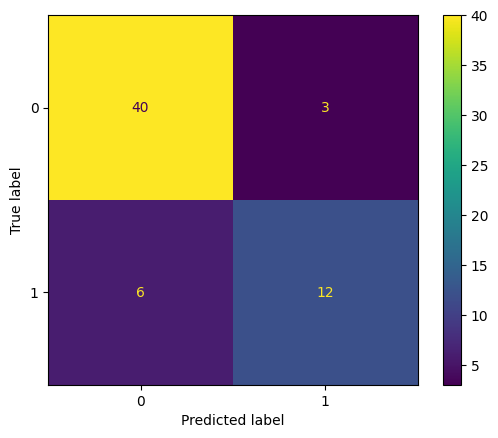

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_rfc_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['RandomForestClassifier Random'] = model_rfc_best.score(X_test, y_test)

# **Optuna Optimization**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.7 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [ ]:
def objective(trial):
  n_estimators = trial.suggest_int('n_estimators', 20, 550)
  max_depth = trial.suggest_int('max_depth', 2, 100)
  min_samples_split = trial.suggest_int('min_samples_split', 5, 50)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 5, 100)
  max_features = trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
  bootstrap = trial.suggest_categorical('bootstrap', [True, False])
  criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
  max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 150)
  min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.5)
  class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])

  model = RandomForestClassifier(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      max_features=max_features,
      bootstrap=bootstrap,
      criterion=criterion,
      max_leaf_nodes=max_leaf_nodes,
      min_weight_fraction_leaf=min_weight_fraction_leaf,
      class_weight=class_weight
      #   n_estimators=260, max depth 142
  )
  kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  accuracy = score.mean()

  return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-21 18:20:40,427] A new study created in memory with name: no-name-29ec78e2-5e55-469f-aec4-a0be76a17bde
[I 2024-11-21 18:20:45,642] Trial 0 finished with value: 0.7148809523809525 and parameters: {'n_estimators': 240, 'max_depth': 30, 'min_samples_split': 21, 'min_samples_leaf': 88, 'max_features': 'log2', 'bootstrap': False, 'criterion': 'entropy', 'max_leaf_nodes': 147, 'min_weight_fraction_leaf': 0.10066894199664711, 'class_weight': None}. Best is trial 0 with value: 0.7148809523809525.
[I 2024-11-21 18:20:46,220] Trial 1 finished with value: 0.4541666666666667 and parameters: {'n_estimators': 187, 'max_depth': 26, 'min_samples_split': 29, 'min_samples_leaf': 100, 'max_features': 'log2', 'bootstrap': True, 'criterion': 'gini', 'max_leaf_nodes': 5, 'min_weight_fraction_leaf': 0.0817123640347655, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.7148809523809525.
[I 2024-11-21 18:20:48,054] Trial 3 finished with value: 0.8099489795918368 and parameters: {'n_estimato

In [ ]:
model_optuna = RandomForestClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=23, max_leaf_nodes=53,
                       min_samples_leaf=12, min_samples_split=15,
                       min_weight_fraction_leaf=0.03886555333751073,
                       n_estimators=367)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8360655737704918


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90        43
           1       0.80      0.67      0.73        18

    accuracy                           0.85        61
   macro avg       0.83      0.80      0.81        61
weighted avg       0.85      0.85      0.85        61



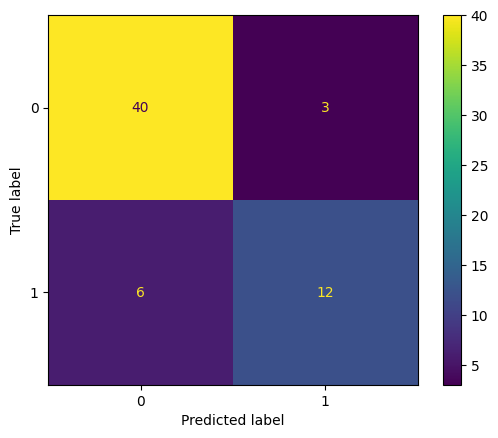

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['RandomForestClassifier Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

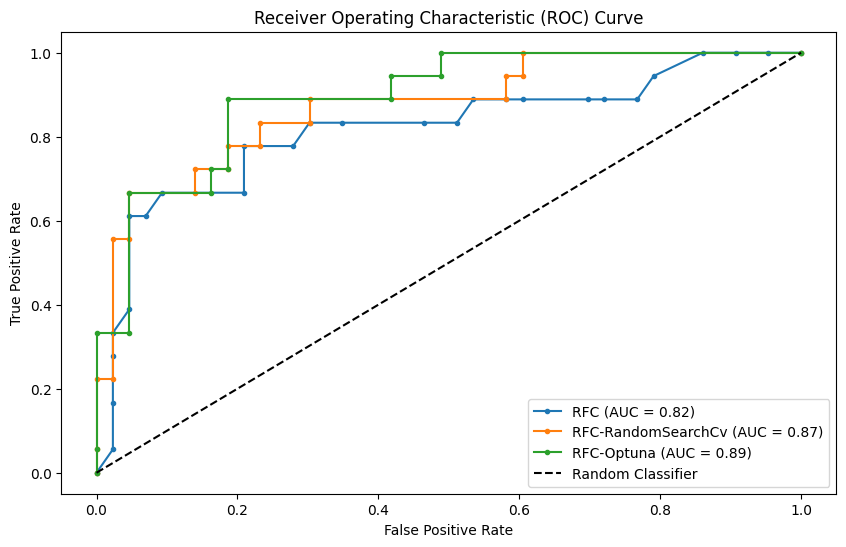

In [ ]:
y_predict_proba = model_rfc.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_rfc_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

rfc_fpr, rfc_tpr, tresholds = roc_curve(y_test, y_predict_proba)
rfc_auc = auc(rfc_fpr, rfc_tpr)

rfc_best_fpr, rfc_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
rfc_best_auc = auc(rfc_best_fpr, rfc_best_tpr)

rfc_optuna_fpr, rfc_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
rfc_optuna_auc = auc(rfc_optuna_fpr, rfc_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(rfc_fpr, rfc_tpr, label=f'RFC (AUC = {rfc_auc:.2f})', linestyle='-', marker='.')
plt.plot(rfc_best_fpr, rfc_best_tpr, label=f'RFC-RandomSearchCv (AUC = {rfc_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(rfc_optuna_fpr, rfc_optuna_tpr, label=f'RFC-Optuna (AUC = {rfc_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history adn best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna After choosing the most important hyperparameters**

In [ ]:
def objective(trial):
  n_estimators = trial.suggest_int('n_estimators', 20, 150)
  max_depth = trial.suggest_int('max_depth', 2, 9)
  min_samples_split = trial.suggest_int('min_samples_split', 5, 50)
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 5, 15)
  max_features = trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])
  bootstrap = trial.suggest_categorical('bootstrap', [True, False])
  criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
  max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 150)
  min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.5)
  class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])

  model = RandomForestClassifier(
      n_estimators=n_estimators,
      max_depth=max_depth,
      min_samples_split=min_samples_split,
      min_samples_leaf=min_samples_leaf,
      max_features=max_features,
      bootstrap=bootstrap,
      criterion=criterion,
      max_leaf_nodes=max_leaf_nodes,
      min_weight_fraction_leaf=min_weight_fraction_leaf,
      class_weight=class_weight
      #   n_estimators=260, max depth 142
  )
  kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
  accuracy = score.mean()

  return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-20 19:48:07,203] A new study created in memory with name: no-name-8c0b8ad9-c34f-4b4b-b914-896189d84dd3
[I 2024-11-20 19:48:09,301] Trial 1 finished with value: 0.8517006802721088 and parameters: {'n_estimators': 96, 'max_depth': 7, 'min_samples_split': 30, 'min_samples_leaf': 15, 'max_features': 'log2', 'bootstrap': True, 'criterion': 'gini', 'max_leaf_nodes': 52, 'min_weight_fraction_leaf': 0.2988565850551281, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.8517006802721088.
[I 2024-11-20 19:48:09,436] Trial 0 finished with value: 0.7436224489795918 and parameters: {'n_estimators': 120, 'max_depth': 9, 'min_samples_split': 40, 'min_samples_leaf': 5, 'max_features': 'log2', 'bootstrap': True, 'criterion': 'gini', 'max_leaf_nodes': 132, 'min_weight_fraction_leaf': 0.08815552343676913, 'class_weight': None}. Best is trial 1 with value: 0.8517006802721088.
[I 2024-11-20 19:48:10,993] Trial 2 finished with value: 0.805952380952381 and parameters: {'n_estimators': 70, 

In [ ]:
model_optuna = RandomForestClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=3, max_features='log2', max_leaf_nodes=39,
                       min_samples_leaf=8, min_samples_split=16,
                       min_weight_fraction_leaf=0.07785813911194892,
                       n_estimators=118)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8524590163934426


In [ ]:
accuracy_dict['RandomForestClassifier Optuna After'] = model_optuna.score(X_test, y_test)

# **EXTRA-TREES-CLASSIFIER ALGORITHM**

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
etc = ExtraTreesClassifier()

In [ ]:
etc.fit(X_train, y_train)

ExtraTreesClassifier()

In [ ]:
y_predict_etc = etc.predict(X_test)

In [ ]:
print(etc.score(X_test, y_test))

0.8688524590163934


In [ ]:
print(classification_report(y_test, y_predict_etc))

              precision    recall  f1-score   support

           0       0.87      0.93      0.90        43
           1       0.80      0.67      0.73        18

    accuracy                           0.85        61
   macro avg       0.83      0.80      0.81        61
weighted avg       0.85      0.85      0.85        61



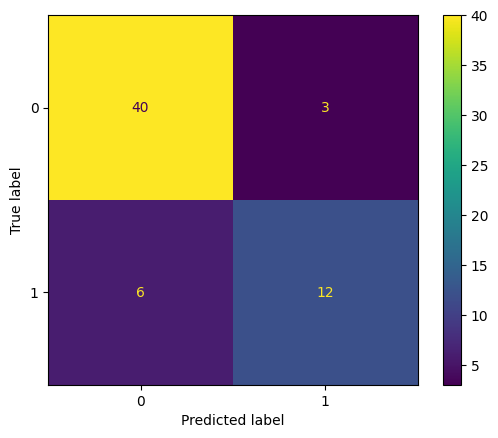

In [ ]:
v = confusion_matrix(y_test, y_predict_etc)
cm = ConfusionMatrixDisplay(v, display_labels=etc.classes_)
cm.plot()

In [ ]:
accuracy_dict['ExtraTreesClassifier'] = etc.score(X_test, y_test)

# **HyperParameters Optimizationa**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'n_estimators': [50, 100, 200, 300, 400, 500],  # Liczba drzew w lesie
    'max_depth': [5, 7, 10, 15, 20, 30, 40, 50],  # Maksymalna głębokość drzewa
    'min_samples_split': [3, 4, 5, 8, 10, 15, 20, 30],  # Minimalna liczba próbek wymagana do podziału węzła
    'min_samples_leaf': [3, 4, 5, 6, 8, 10, 15, 20, 30],  # Minimalna liczba próbek w liściu
    'criterion': ['gini', 'entropy',],  # Funkcja oceny jakości podziału
    'max_leaf_nodes': [10, 15, 20, 30, 40,  50, 100, 150],  # Maksymalna liczba węzłów liściowych
    'min_weight_fraction_leaf': [0.001, 0.005, 0.05, 0.01, 0.1],  # Minimalna frakcja masy próbki w liściu
    'class_weight': [None, 'balanced'],  # Wagi klas (balanced automatycznie dostosowuje wagi)
}


In [ ]:
random_search = RandomizedSearchCV(etc, param_distributions=param_dict, n_iter=100, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'class_weight': [None, 'balanced'],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [5, 7, 10, 15, 20, 30, 40,
                                                      50],
                                        'max_leaf_nodes': [10, 15, 20, 30, 40,
                                                           50, 100, 150],
                                        'min_samples_leaf': [3, 4, 5, 6, 8, 10,
                                                             15, 20, 30],
                                        'min_samples_split': [3, 4, 5, 8, 10,
                                                              15, 20, 30],
                                        'min_weight_fraction_leaf': [0.001,
                                                                     0.005,
                                                                     0.05, 0.01,
                                                                     0.1],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'n_estimators': 200,
 'min_weight_fraction_leaf': 0.01,
 'min_samples_split': 4,
 'min_samples_leaf': 3,
 'max_leaf_nodes': 30,
 'max_depth': 10,
 'criterion': 'gini',
 'class_weight': None}

In [ ]:
random_search.best_score_

0.8804421768707483

In [ ]:
model_etc_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_etc_best.predict(X_test)

In [ ]:
print(model_etc_best.score(X_test, y_test))

0.8688524590163934


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.82      0.95      0.88        43
           1       0.82      0.50      0.62        18

    accuracy                           0.82        61
   macro avg       0.82      0.73      0.75        61
weighted avg       0.82      0.82      0.80        61



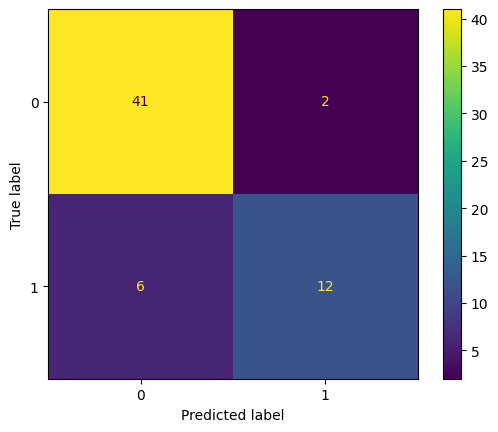

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_etc_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['ExtraTreesClassifier Random'] = model_etc_best.score(X_test, y_test)

# **Optuna Optimization**

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 250, 550)
    max_depth = trial.suggest_int('max_depth', 10, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 4, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 4, 20)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 4, 150)
    min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.05)
    class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])

    model = ExtraTreesClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        min_weight_fraction_leaf=min_weight_fraction_leaf,
        max_leaf_nodes=max_leaf_nodes,
        class_weight=class_weight,
        criterion=criterion,
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=100, n_jobs=-1)

[I 2024-12-02 17:00:52,543] A new study created in memory with name: no-name-67454f65-da8b-4413-849c-e90f02b8817c
[I 2024-12-02 17:01:02,550] Trial 0 finished with value: 0.8346938775510203 and parameters: {'n_estimators': 324, 'max_depth': 23, 'min_samples_split': 8, 'min_samples_leaf': 17, 'max_leaf_nodes': 108, 'min_weight_fraction_leaf': 0.03192343650402806, 'class_weight': 'balanced', 'criterion': 'gini'}. Best is trial 0 with value: 0.8346938775510203.
[I 2024-12-02 17:01:08,000] Trial 1 finished with value: 0.7810374149659863 and parameters: {'n_estimators': 524, 'max_depth': 41, 'min_samples_split': 15, 'min_samples_leaf': 18, 'max_leaf_nodes': 120, 'min_weight_fraction_leaf': 0.04476635356080788, 'class_weight': None, 'criterion': 'entropy'}. Best is trial 0 with value: 0.8346938775510203.
[I 2024-12-02 17:01:14,263] Trial 2 finished with value: 0.8102891156462585 and parameters: {'n_estimators': 424, 'max_depth': 19, 'min_samples_split': 17, 'min_samples_leaf': 12, 'max_leaf_

In [ ]:
model_optuna = ExtraTreesClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

ExtraTreesClassifier(criterion='entropy', max_depth=49, max_leaf_nodes=90,
                     min_samples_leaf=4, min_samples_split=11,
                     min_weight_fraction_leaf=0.008095727567617887,
                     n_estimators=534)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8360655737704918


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.85      0.95      0.90        43
           1       0.85      0.61      0.71        18

    accuracy                           0.85        61
   macro avg       0.85      0.78      0.81        61
weighted avg       0.85      0.85      0.84        61



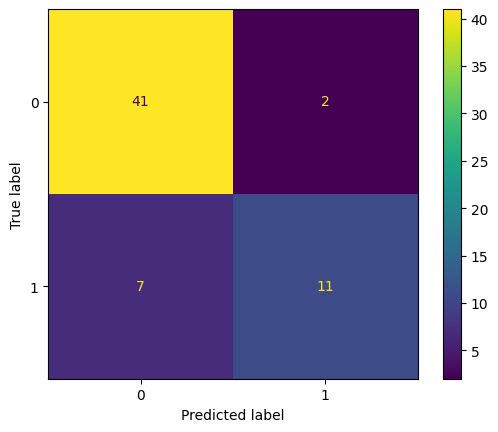

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['ExtraTreesClassifier Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

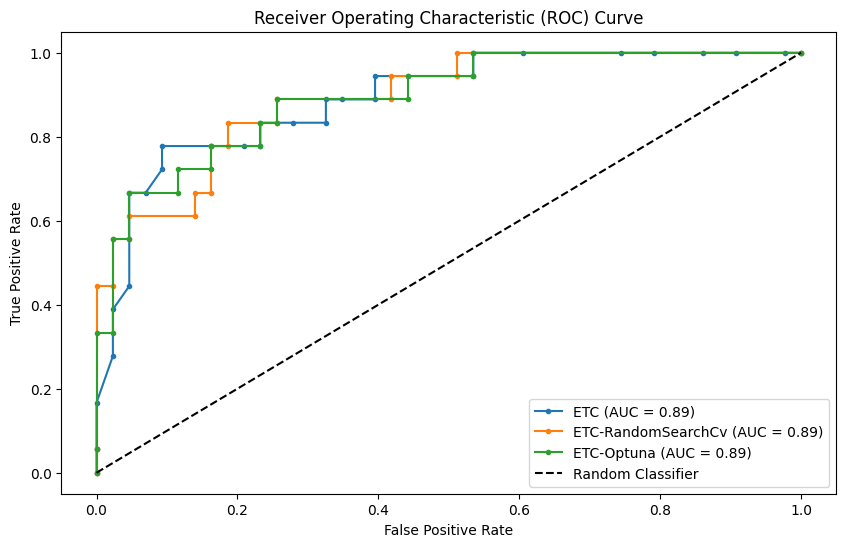

In [ ]:
y_predict_proba = etc.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_etc_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

etc_fpr, etc_tpr, tresholds = roc_curve(y_test, y_predict_proba)
etc_auc = auc(etc_fpr, etc_tpr)

etc_best_fpr, etc_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
etc_best_auc = auc(etc_best_fpr, etc_best_tpr)

etc_optuna_fpr, etc_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
etc_optuna_auc = auc(etc_optuna_fpr, etc_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(etc_fpr, etc_tpr, label=f'ETC (AUC = {etc_auc:.2f})', linestyle='-', marker='.')
plt.plot(etc_best_fpr, etc_best_tpr, label=f'ETC-RandomSearchCv (AUC = {etc_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(etc_optuna_fpr, etc_optuna_tpr, label=f'ETC-Optuna (AUC = {etc_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 250, 550)
    max_depth = trial.suggest_int('max_depth', 10, 101)
    min_samples_split = trial.suggest_int('min_samples_split', 4, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 4, 20)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 150)
    min_weight_fraction_leaf = trial.suggest_float('min_weight_fraction_leaf', 0.0, 0.05)
    # class_weight = 'balanced'
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])

    model = ExtraTreesClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        min_weight_fraction_leaf=min_weight_fraction_leaf,
        max_leaf_nodes=max_leaf_nodes,
        # class_weight=class_weight,
        criterion=criterion,
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-11-21 22:17:35,308] A new study created in memory with name: no-name-28d31829-64f3-4ecb-ada1-25e50e9089b7
[I 2024-11-21 22:17:44,022] Trial 1 finished with value: 0.7976190476190476 and parameters: {'n_estimators': 418, 'max_depth': 46, 'min_samples_split': 5, 'min_samples_leaf': 15, 'max_leaf_nodes': 106, 'min_weight_fraction_leaf': 0.004684388951869601, 'criterion': 'gini'}. Best is trial 1 with value: 0.7976190476190476.
[I 2024-11-21 22:17:45,054] Trial 0 finished with value: 0.8145408163265305 and parameters: {'n_estimators': 473, 'max_depth': 34, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_leaf_nodes': 47, 'min_weight_fraction_leaf': 0.020347404919409857, 'criterion': 'gini'}. Best is trial 0 with value: 0.8145408163265305.
[I 2024-11-21 22:17:52,761] Trial 3 finished with value: 0.7768707482993197 and parameters: {'n_estimators': 358, 'max_depth': 33, 'min_samples_split': 6, 'min_samples_leaf': 17, 'max_leaf_nodes': 148, 'min_weight_fraction_leaf': 0.031269739090

In [ ]:
model_optuna = ExtraTreesClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

ExtraTreesClassifier(criterion='entropy', max_depth=47, max_leaf_nodes=27,
                     min_samples_leaf=4, min_samples_split=5,
                     min_weight_fraction_leaf=0.001898036010709264,
                     n_estimators=282)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8360655737704918


In [ ]:
accuracy_dict['ExtraTreesClassifier Optuna After'] = model_optuna.score(X_test, y_test)

# **MLP-CLASSIFIER ALGORITHM**

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay

In [ ]:
model_mlp = MLPClassifier()

In [ ]:
model_mlp.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

In [ ]:
y_predict_mlp = model_mlp.predict(X_test)

In [ ]:
print(model_mlp.score(X_test, y_test))

0.7540983606557377


In [ ]:
print(classification_report(y_test, y_predict_mlp))

              precision    recall  f1-score   support

           0       0.83      0.88      0.85        43
           1       0.67      0.56      0.61        18

    accuracy                           0.79        61
   macro avg       0.75      0.72      0.73        61
weighted avg       0.78      0.79      0.78        61



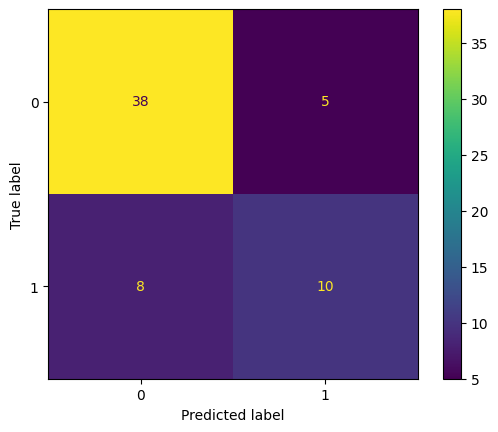

In [ ]:
v = confusion_matrix(y_test, y_predict_mlp)
cm = ConfusionMatrixDisplay(v, display_labels=model_mlp.classes_)
cm.plot()

In [ ]:
accuracy_dict['MLPClassifier'] = model_mlp.score(X_test, y_test)

# **HyperParameters Optimization**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
param_dict = {
    'hidden_layer_sizes': [(50,), (100,), (150,), (170,), (200,)],  # Architektura sieci (liczba neuronów w każdej warstwie)
    'activation': ['identity', 'logistic', 'tanh', 'relu'],  # Funkcja aktywacji w warstwach ukrytych
    'solver': ['adam', 'sgd', 'lbfgs'],  # Algorytm do optymalizacji wagi
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1],  # Parametr regularyzacji L2 (zapobieganie przeuczeniu)
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Harmonogram zmiany tempa uczenia
    'learning_rate_init': [0.001, 0.01, 0.05, 0.1],  # Początkowe tempo uczenia
    'max_iter': [200, 300, 500, 1000],  # Maksymalna liczba iteracji
    'tol': [1e-4, 1e-3, 1e-2],  # Tolerancja na optymalizację (kryterium stopu)
    # 'momentum': [0.9, 0.95, 0.99],  # Momentum dla optymalizatora 'sgd'
    # 'nesterovs_momentum': [True, False],  # Użycie momentum Nesterova (przy solverze 'sgd')
    # 'beta_1': [0.9, 0.95, 0.99],  # Parametr beta_1 dla optymalizatora 'adam'
    # 'beta_2': [0.999, 0.99, 0.9],  # Parametr beta_2 dla optymalizatora 'adam'
    # 'epsilon': [1e-8, 1e-7, 1e-6],  # Stała zapobiegająca dzieleniu przez zero przy solverze 'adam'
    # 'early_stopping': [True, False],  # Czy zakończyć wcześnie, gdy wyniki przestają się poprawiać
    # 'validation_fraction': [0.1, 0.2, 0.3],  # Ułamek danych treningowych używany do walidacji
    # 'beta_1': [0.9, 0.95],  # Parametr beta_1 w solverze 'adam'
    # 'beta_2': [0.999, 0.99],  # Parametr beta_2 w solverze 'adam'
}


In [ ]:
random_search = RandomizedSearchCV(model_mlp, param_distributions=param_dict, n_iter=250, cv=5, random_state=42, n_jobs=-1, scoring="accuracy")
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=MLPClassifier(), n_iter=250, n_jobs=-1,
                   param_distributions={'activation': ['identity', 'logistic',
                                                       'tanh', 'relu'],
                                        'alpha': [0.0001, 0.001, 0.01, 0.1, 1],
                                        'hidden_layer_sizes': [(50,), (100,),
                                                               (150,), (170,),
                                                               (200,)],
                                        'learning_rate': ['constant',
                                                          'invscaling',
                                                          'adaptive'],
                                        'learning_rate_init': [0.001, 0.01,
                                                               0.05, 0.1],
                                        'max_iter': [200, 300, 500, 1000],
                                        'solver': ['adam', 'sgd', 'lbfgs'],
                                        'tol': [0.0001, 0.001, 0.01]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search.best_params_

{'tol': 0.01,
 'solver': 'lbfgs',
 'max_iter': 300,
 'learning_rate_init': 0.05,
 'learning_rate': 'invscaling',
 'hidden_layer_sizes': (200,),
 'alpha': 1,
 'activation': 'relu'}

In [ ]:
random_search.best_score_

0.9011054421768707

In [ ]:
model_mlp_best = random_search.best_estimator_

In [ ]:
y_predict_best = model_mlp_best.predict(X_test)

In [ ]:
print(model_mlp_best.score(X_test, y_test))

0.8032786885245902


In [ ]:
print(classification_report(y_test, y_predict_best))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86        43
           1       0.69      0.61      0.65        18

    accuracy                           0.80        61
   macro avg       0.77      0.75      0.76        61
weighted avg       0.80      0.80      0.80        61



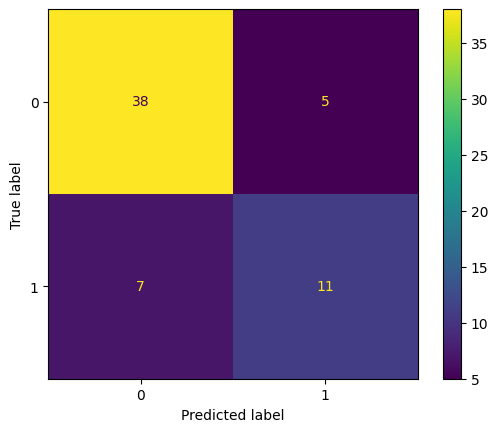

In [ ]:
v = confusion_matrix(y_test, y_predict_best)
cm = ConfusionMatrixDisplay(v, display_labels=model_mlp_best.classes_)
cm.plot()

In [ ]:
accuracy_dict['MLPClassifier Random'] = model_mlp_best.score(X_test, y_test)

# **Optuna Optimization**

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.model_selection import cross_val_score

In [ ]:
def objective(trial):
    hidden_layer_sizes = trial.suggest_categorical('hidden_layer_sizes', [32, 50, 64, 100, 128, 170, 200])
    activation = trial.suggest_categorical('activation', ['identity', 'logistic', 'tanh', 'relu'])
    solver = trial.suggest_categorical('solver', ['adam', 'sgd', 'lbfgs'])
    alpha = trial.suggest_float('alpha', 0.001, 1.0)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    learning_rate = trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive'])
    learning_rate_init = trial.suggest_float('learning_rate_init', 0.001, 0.1)
    max_iter = trial.suggest_int('max_iter', 10, 300)
    tol = trial.suggest_float('tol', 0.0001, 0.1)
    shuffle = trial.suggest_categorical('shuffle', [True, False])


    model = MLPClassifier(
        hidden_layer_sizes=(hidden_layer_sizes,),
        activation=activation,
        solver=solver,
        alpha=alpha,
        learning_rate=learning_rate,
        learning_rate_init=learning_rate_init,
        max_iter=max_iter,
        tol=tol,
        # batch_size=batch_size,
        # shuffle=shuffle,
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-12-02 17:20:14,827] A new study created in memory with name: no-name-13fed187-d2dd-4889-8747-465bf78ef047
[I 2024-12-02 17:20:15,008] Trial 0 finished with value: 0.864030612244898 and parameters: {'hidden_layer_sizes': 50, 'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.5293633838433623, 'batch_size': 32, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0673050953066156, 'max_iter': 95, 'tol': 0.0849617552055008, 'shuffle': True}. Best is trial 0 with value: 0.864030612244898.
[I 2024-12-02 17:20:15,057] Trial 1 finished with value: 0.7148809523809525 and parameters: {'hidden_layer_sizes': 128, 'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.757314778937175, 'batch_size': 128, 'learning_rate': 'invscaling', 'learning_rate_init': 0.029834354063165838, 'max_iter': 141, 'tol': 0.07043444304549172, 'shuffle': False}. Best is trial 0 with value: 0.864030612244898.
[I 2024-12-02 17:20:15,462] Trial 2 finished with value: 0.8763605442176872 and parameters: {'hidden_la

In [ ]:
model_optuna = MLPClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

MLPClassifier(activation='tanh', alpha=0.6841338415626429, batch_size=32,
              hidden_layer_sizes=50, learning_rate_init=0.04747144186214874,
              max_iter=268, solver='lbfgs', tol=0.03160142931297485)

In [ ]:
y_predict_optuna = model_optuna.predict(X_test)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8032786885245902


In [ ]:
print(classification_report(y_test, y_predict_optuna))

              precision    recall  f1-score   support

           0       0.84      0.88      0.86        43
           1       0.69      0.61      0.65        18

    accuracy                           0.80        61
   macro avg       0.77      0.75      0.76        61
weighted avg       0.80      0.80      0.80        61



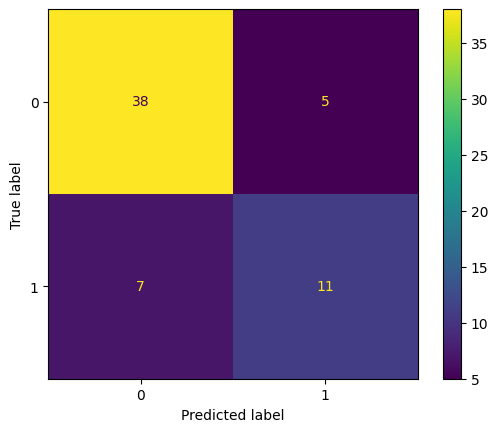

In [ ]:
v = confusion_matrix(y_test, y_predict_optuna)
cm = ConfusionMatrixDisplay(v, display_labels=model_optuna.classes_)
cm.plot()

In [ ]:
accuracy_dict['MLPClassifier Optuna'] = model_optuna.score(X_test, y_test)

# **ROC Curve**

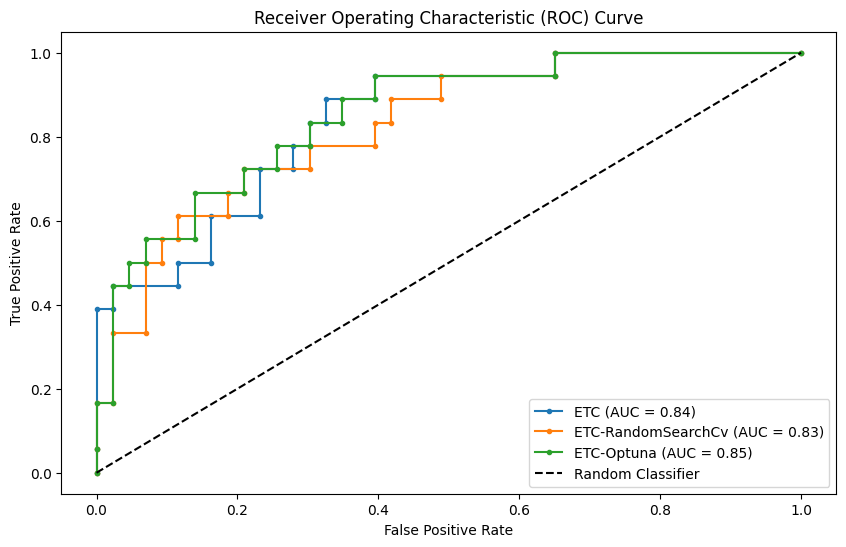

In [ ]:
y_predict_proba = model_mlp.predict_proba(X_test)[:, 1]
y_predict_best_proba = model_mlp_best.predict_proba(X_test)[:, 1]
y_predict_optuna_proba = model_optuna.predict_proba(X_test)[:, 1]

mlp_fpr, mlp_tpr, tresholds = roc_curve(y_test, y_predict_proba)
mlp_auc = auc(mlp_fpr, mlp_tpr)

mlp_best_fpr, mlp_best_tpr, tresholds = roc_curve(y_test, y_predict_best_proba)
mlp_best_auc = auc(mlp_best_fpr, mlp_best_tpr)

mlp_optuna_fpr, mlp_optuna_tpr, tresholds = roc_curve(y_test, y_predict_optuna_proba)
mlp_optuna_auc = auc(mlp_optuna_fpr, mlp_optuna_tpr)

plt.figure(figsize=(10, 6))
plt.plot(mlp_fpr, mlp_tpr, label=f'ETC (AUC = {mlp_auc:.2f})', linestyle='-', marker='.')
plt.plot(mlp_best_fpr, mlp_best_tpr, label=f'ETC-RandomSearchCv (AUC = {mlp_best_auc:.2f})', linestyle='-', marker='.')
plt.plot(mlp_optuna_fpr, mlp_optuna_tpr, label=f'ETC-Optuna (AUC = {mlp_optuna_auc:.2f})', linestyle='-', marker='.')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# **Display Optuna history and best hyperparameters**

In [ ]:
optuna.visualization.plot_optimization_history(optuna_study)

In [ ]:
optuna.visualization.plot_param_importances(optuna_study)

# **Optuna after choosing the most important hyperparameters**

In [ ]:
def objective(trial):
    hidden_layer_sizes = trial.suggest_categorical('hidden_layer_sizes', [32, 50, 64, 100, 128, 170, 200])
    activation = trial.suggest_categorical('activation', ['identity', 'logistic', 'tanh', 'relu'])
    solver = trial.suggest_categorical('solver', ['adam', 'sgd', 'lbfgs'])
    alpha = trial.suggest_float('alpha', 0.001, 5.0)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    learning_rate = trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive'])
    learning_rate_init = trial.suggest_float('learning_rate_init', 0.001, 0.1)
    max_iter = trial.suggest_int('max_iter', 10, 300)
    tol = trial.suggest_float('tol', 0.0001, 0.1)
    shuffle = trial.suggest_categorical('shuffle', [True, False])


    model = MLPClassifier(
        hidden_layer_sizes=(hidden_layer_sizes,),
        activation=activation,
        solver=solver,
        alpha=alpha,
        learning_rate=learning_rate,
        learning_rate_init=learning_rate_init,
        max_iter=max_iter,
        tol=tol,
        # batch_size=batch_size,
        # shuffle=shuffle,
    )
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy


In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-12-02 17:22:57,488] A new study created in memory with name: no-name-68f00172-f7a0-4239-af6c-a25c9f9d56d0
[I 2024-12-02 17:22:58,201] Trial 1 finished with value: 0.8846088435374149 and parameters: {'hidden_layer_sizes': 50, 'activation': 'relu', 'solver': 'adam', 'alpha': 2.47714398826433, 'batch_size': 128, 'learning_rate': 'constant', 'learning_rate_init': 0.032232444160117384, 'max_iter': 145, 'tol': 0.09336730003319227, 'shuffle': True}. Best is trial 1 with value: 0.8846088435374149.
[I 2024-12-02 17:22:58,228] Trial 0 finished with value: 0.7148809523809525 and parameters: {'hidden_layer_sizes': 128, 'activation': 'logistic', 'solver': 'sgd', 'alpha': 3.189157760177193, 'batch_size': 128, 'learning_rate': 'invscaling', 'learning_rate_init': 0.08264296306070613, 'max_iter': 29, 'tol': 0.022118551212090245, 'shuffle': False}. Best is trial 1 with value: 0.8846088435374149.
[I 2024-12-02 17:22:58,541] Trial 2 finished with value: 0.859608843537415 and parameters: {'hidden_l

In [ ]:
model_optuna = MLPClassifier(**optuna_study.best_params)
model_optuna.fit(X_train, y_train)

MLPClassifier(activation='logistic', alpha=1.8928117467412477, batch_size=64,
              hidden_layer_sizes=64, learning_rate_init=0.03742589731610385,
              max_iter=103, tol=0.04207117306647311)

In [ ]:
print(model_optuna.score(X_test, y_test))

0.8032786885245902


In [ ]:
accuracy_dict['MLPClassifier Optuna After'] = model_optuna.score(X_test, y_test)

In [ ]:
for key, value in accuracy_dict.items():
  print(key, value)

LightGBM 0.8688524590163934
LightGBM Optuna 0.8852459016393442
LightGBM Random 0.8688524590163934
Logistic Regression 0.7704918032786885
Logistic Regression Random 0.7868852459016393
Logistic Regression Optuna 0.7868852459016393
Logistic Regression Optuna After 0.8032786885245902
KNN 0.7540983606557377
KNN Random 0.819672131147541
KNN Optuna 0.819672131147541
KNN Optuna After 0.819672131147541
XGBoost 0.8524590163934426
XGBoost Random 0.8688524590163934
XGBoost Optuna 0.8688524590163934
GradientBoostingClassifier 0.8524590163934426
GradientBoostingClassifier Random 0.8688524590163934
GradientBoostingClassifier Optuna 0.8360655737704918
NuSVC 0.8032786885245902
NuSVC Random 0.8032786885245902
NuSVC Optuna 0.7704918032786885
NuSVC Optuna After 0.7868852459016393
DecisionTreeClassifier 0.8360655737704918
DecisionTreeClassifier Optuna 0.8360655737704918
DecisionTreeClassifier Random 0.8032786885245902
DecisionTreeClassifier Optuna After 0.8360655737704918
RandomForestClassifier 0.852459016

# **Display 3 the best Algorithms with the highest Accuracy Score**

In [ ]:
accuracy_dict = {
    "LightGBM": 0.8688524590163934,
    "LightGBM Optuna": 0.8852459016393442,
    "LightGBM Random": 0.8688524590163934,
    "LightGBM Optuna After": 0.8688524590163934,
    "Logistic Regression": 0.7704918032786885,
    "Logistic Regression Random": 0.7868852459016393,
    "Logistic Regression Optuna": 0.7868852459016393,
    "Logistic Regression Optuna After": 0.8032786885245902,
    "KNN": 0.7540983606557377,
    "KNN Random": 0.819672131147541,
    "KNN Optuna": 0.819672131147541,
    "KNN Optuna After": 0.819672131147541,
    "XGBoost": 0.8524590163934426,
    "XGBoost Random": 0.8852459016393442,
    "XGBoost Optuna": 0.8688524590163934,
    "XGBoost Optuna After": 0.8688524590163934,
    "GradientBoostingClassifier": 0.8524590163934426,
    "GradientBoostingClassifier Random": 0.8524590163934426,
    "GradientBoostingClassifier Optuna": 0.8688524590163934,
    "GradientBoostingClassifier Optuna After": 0.8688524590163934,
    "NuSVC": 0.8032786885245902,
    "NuSVC Random": 0.8032786885245902,
    "NuSVC Optuna": 0.7868852459016393,
    "NuSVC Optuna After": 0.7868852459016393,
    "DecisionTreeClassifier": 0.8360655737704918,
    "DecisionTreeClassifier Optuna": 0.8360655737704918,
    "DecisionTreeClassifier Random": 0.8360655737704918,
    "DecisionTreeClassifier Optuna After": 0.8360655737704918,
    "RandomForestClassifier": 0.8524590163934426,
    "RandomForestClassifier Random": 0.8524590163934426,
    "RandomForestClassifier Optuna": 0.8524590163934426,
    "RandomForestClassifier Optuna After": 0.8524590163934426,
    "ExtraTreesClassifier": 0.8524590163934426,
    "ExtraTreesClassifier Random": 0.8688524590163934,
    "ExtraTreesClassifier Optuna": 0.8524590163934426,
    "ExtraTreesClassifier Optuna After": 0.8360655737704918,
    "MLPClassifier": 0.7540983606557377,
    "MLPClassifier Random": 0.8032786885245902,
    "MLPClassifier Optuna": 0.8032786885245902,
    "MLPClassifier Optuna After": 0.8032786885245902
}


In [ ]:
for key, value in accuracy_dict.items():
  print(key, value)

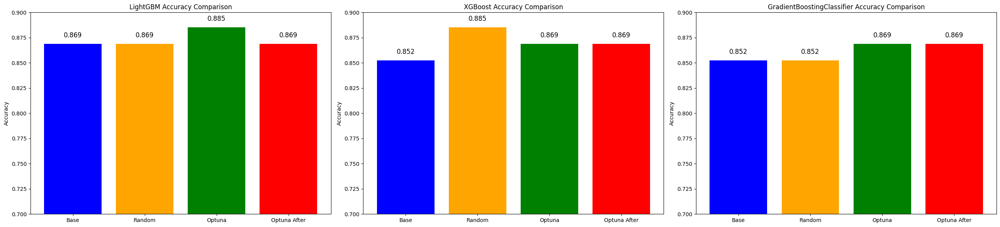

In [ ]:
import matplotlib.pyplot as plt

algorithms = [ "LightGBM", "XGBoost", "GradientBoostingClassifier"]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(26, 6))
axes = axes.flatten()

for i, algorithm in enumerate(algorithms):
    results = {
        "Base": accuracy_dict[algorithm],
        "Random": accuracy_dict[f"{algorithm} Random"],
        "Optuna": accuracy_dict[f"{algorithm} Optuna"],
        "Optuna After": accuracy_dict[f"{algorithm} Optuna After"]
    }

    bars = axes[i].bar(results.keys(), results.values(), color=['blue', 'orange', 'green', 'red'])
    axes[i].set_ylim(0.7, 0.9)
    axes[i].set_title(f'{algorithm} Accuracy Comparison')
    axes[i].set_ylabel('Accuracy')

    for bar in bars:
        height = bar.get_height()
        axes[i].text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.005,
            f'{height:.3f}',
            ha='center',
            va='bottom',
            fontsize=12
        )

plt.tight_layout()
plt.show()


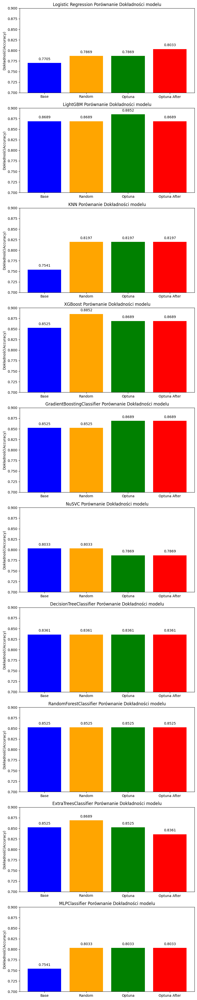

In [ ]:
import matplotlib.pyplot as plt

algorithms = ["Logistic Regression", "LightGBM", "KNN", "XGBoost", "GradientBoostingClassifier",
              "NuSVC", "DecisionTreeClassifier", "RandomForestClassifier",
              "ExtraTreesClassifier", "MLPClassifier"]

fig, axes = plt.subplots(nrows=len(algorithms), ncols=1, figsize=(8, 40))

for i, algorithm in enumerate(algorithms):
    results = {
        "Base": result[algorithm],
        "Random": result[f"{algorithm} Random"],
        "Optuna": result[f"{algorithm} Optuna"],
        "Optuna After": result[f"{algorithm} Optuna After"]
    }

    bars = axes[i].bar(results.keys(), results.values(), color=['blue', 'orange', 'green', 'red'])
    axes[i].set_ylim(0.7, 0.9)
    axes[i].set_title(f'{algorithm} Porównanie Dokładności modelu')
    axes[i].set_ylabel('Dokładność(Accuracy)')

    for bar in bars:
        yval = bar.get_height()
        axes[i].text(bar.get_x() + bar.get_width() / 2, yval + 0.005, f'{yval:.4f}',
                     ha='center', va='bottom', fontsize=10, color='black')
plt.tight_layout()
plt.show()


# **SHAP Values** - I decided to try to understand what features have the most ipmact to final prediction. I used Shap values and Shap plots to beeter understand it and to show it both locally and globally. It was done on LightGBM Model.

In [ ]:
pip install shap


In [ ]:
import shap

In [ ]:
shap.initjs()

In [ ]:
model_lightGBM = lgb.LGBMClassifier(learning_rate=0.1445320982261467, min_data_in_leaf=39,
               num_iterations=833, num_leaves=382, objective='binary')
model_lightGBM.fit(X_train, y_train)
y_predict_lightGBM = model_lightGBM.predict(X_test)
print(model_lightGBM.score(X_test, y_test))

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 851
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

In [ ]:
explainer = shap.Explainer(model_lightGBM)
shap_values = explainer(X_test)

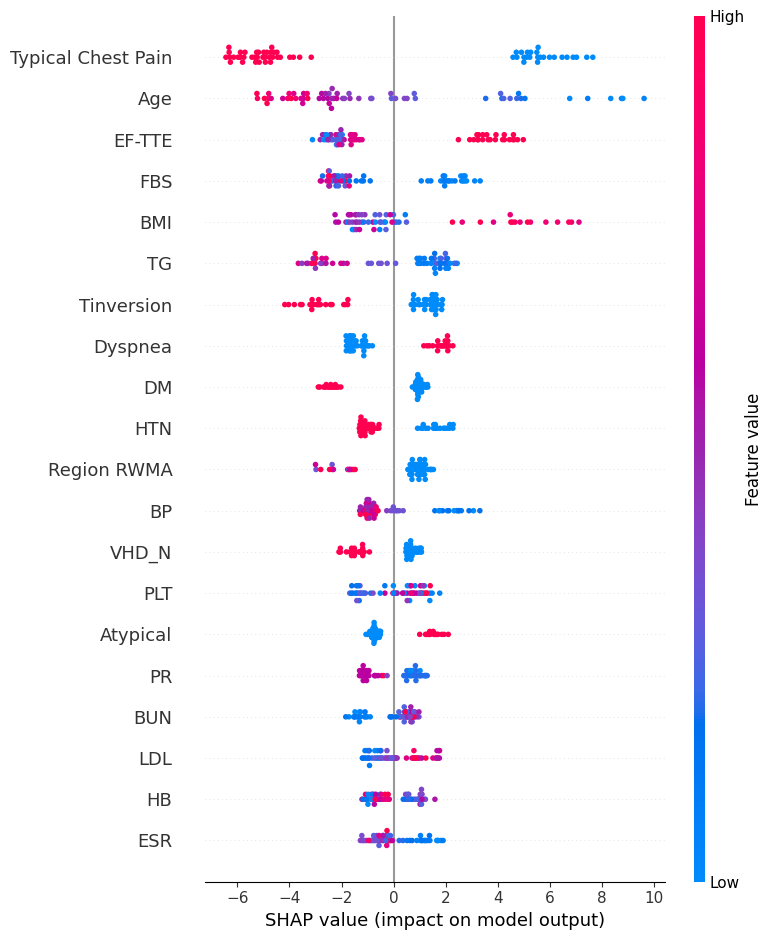

In [ ]:
shap.summary_plot(shap_values, X_test)

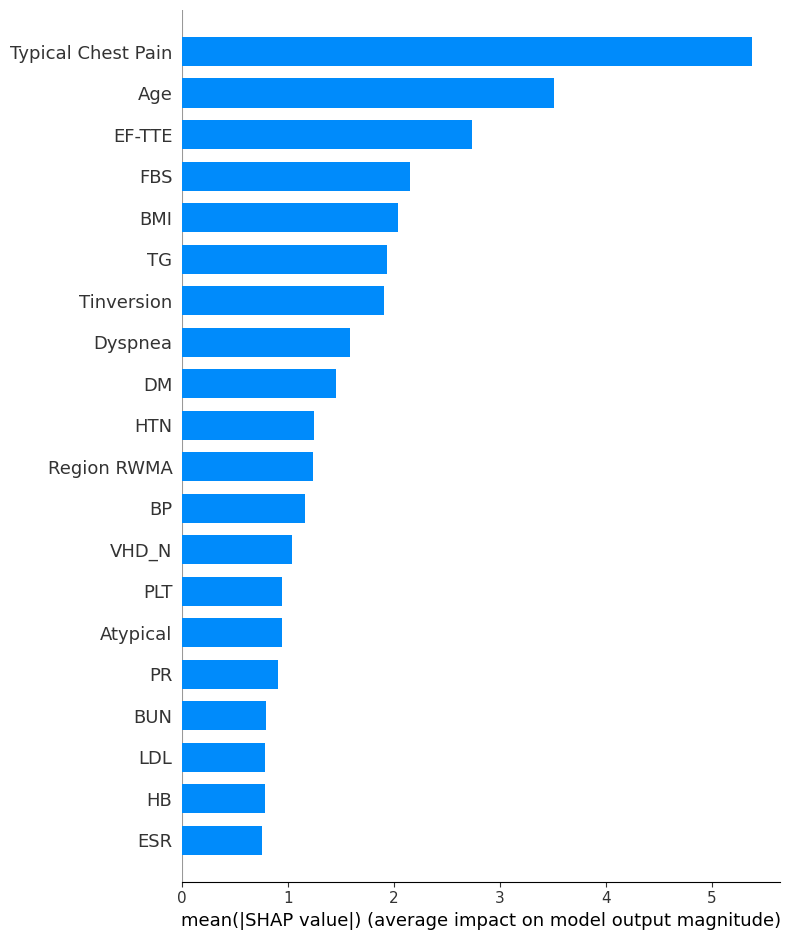

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

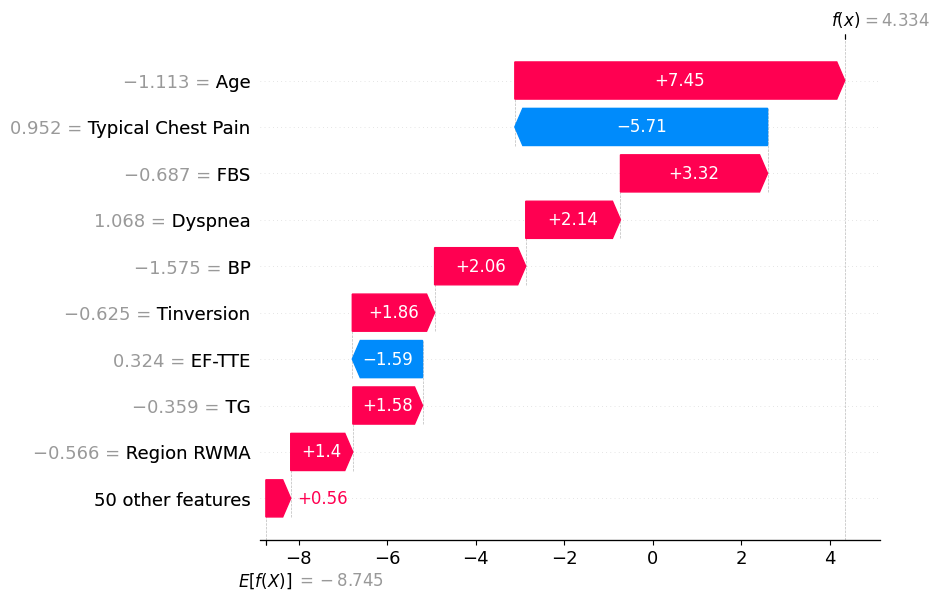

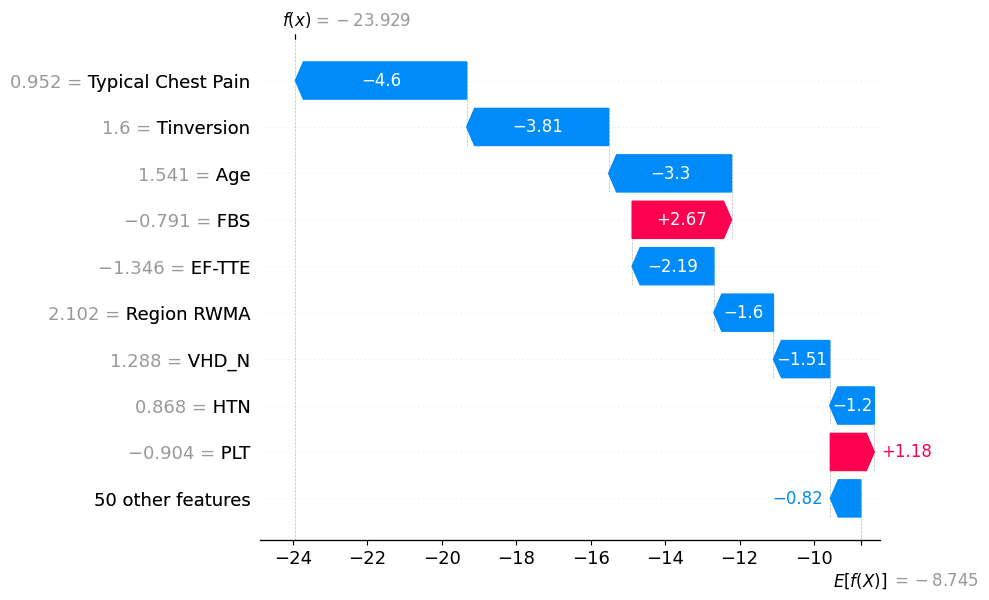

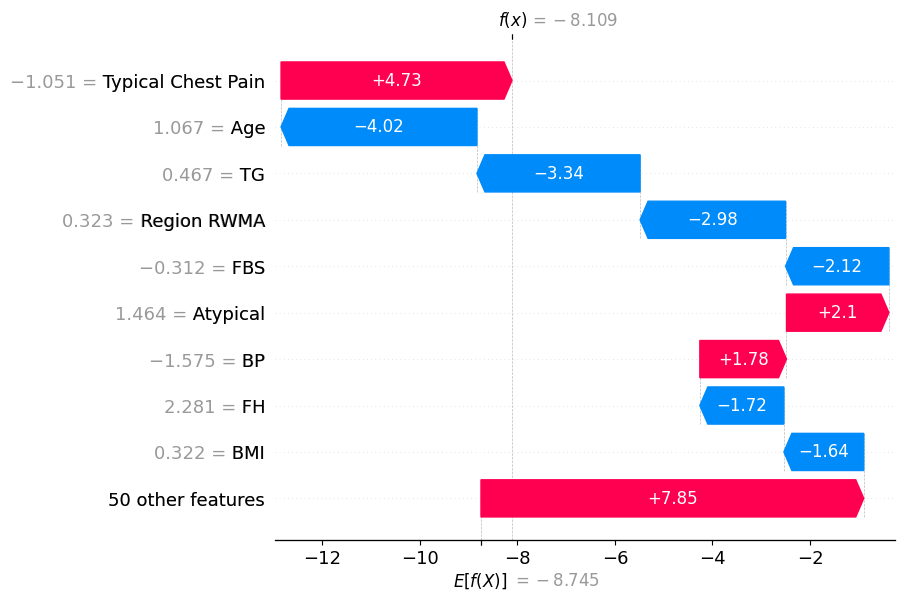

In [ ]:
shap.initjs()
for i in range(3):
    shap.waterfall_plot(shap_values[i])

In [ ]:
shap.initjs()
shap.plots.force(shap_values[0], link="logit")

# **PCA** - I performed this process for 3 categories. For an explanation of 70%, 80% and 90% of the total variance.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA()
pca.fit(X_train)

PCA()

In [ ]:
pca_70 = PCA(0.70).fit(X_train)
pca_80 = PCA(0.80).fit(X_train)
pca_90 = PCA(0.90).fit(X_train)

In [ ]:
X_train_pca_70 = pca_70.transform(X_train)
X_train_pca_80 = pca_80.transform(X_train)
X_train_pca_90 = pca_90.transform(X_train)

In [ ]:
X_test_pca_70 = pca_70.transform(X_test)
X_test_pca_80 = pca_80.transform(X_test)
X_test_pca_90 = pca_90.transform(X_test)

In [ ]:
print(X_train_pca_70.shape)
print(X_train_pca_80.shape)
print(X_train_pca_90.shape)

(242, 22)
(242, 29)
(242, 38)


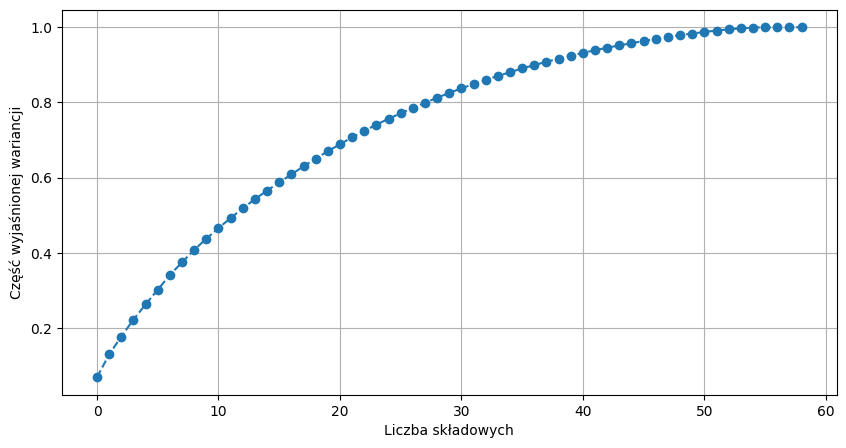

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.xlabel('Liczba składowych')
plt.ylabel('Część wyjaśnionej wariancji')
plt.grid(True)
plt.show()

In [ ]:
import numpy as np

cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

print(f"Liczba składowych potrzebna do wyjaśnienia 90% wariancji: {n_components_90}")

Liczba składowych potrzebna do wyjaśnienia 90% wariancji: 38


# **Creating and Testing Model after PCA**

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.6 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
import optuna

import lightgbm as lgb

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
lightGBM_pca_70 = lgb.LGBMClassifier()
lightGBM_pca_70.fit(X_train_pca_70, y_train)
lightGBM_pca_80 = lgb.LGBMClassifier()
lightGBM_pca_80.fit(X_train_pca_80, y_train)
lightGBM_pca_90 = lgb.LGBMClassifier()
lightGBM_pca_90.fit(X_train_pca_90, y_train)

[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1812
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

LGBMClassifier()

In [ ]:
y_predict_lightGBM_pca_70 = lightGBM_pca_70.predict(X_train_pca_70)
y_predict_lightGBM_pca_80 = lightGBM_pca_80.predict(X_train_pca_80)
y_predict_lightGBM_pca_90 = lightGBM_pca_90.predict(X_train_pca_90)

In [ ]:
print(lightGBM_pca_70.score(X_test_pca_70, y_test))
print(lightGBM_pca_80.score(X_test_pca_80, y_test))
print(lightGBM_pca_90.score(X_test_pca_90, y_test))

0.8032786885245902
0.8032786885245902
0.819672131147541


In [ ]:
def objective(trial):
    param_dict = {
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt']),
        'num_leaves': trial.suggest_int('num_leaves', 50, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_iterations': trial.suggest_int('num_iterations', 50, 600),
        'max_bin': trial.suggest_categorical('max_bin', [255, 628, 1024]),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 100),
        'objective': trial.suggest_categorical('objective', ['binary']),
        'metric': trial.suggest_categorical('metric', ['binary_logloss']),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 1.0),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),
        'min_sum_hessian_in_leaf': trial.suggest_float('min_sum_hessian_in_leaf', 1, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
    }

    model = lgb.LGBMClassifier(**param_dict)
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    score = cross_val_score(model, X_train_pca_80, y_train, cv=kfold, scoring='accuracy')
    accuracy = score.mean()

    return accuracy

In [ ]:
optuna_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
optuna_study.optimize(objective, n_trials=200, n_jobs=-1)

[I 2024-12-13 22:46:07,805] A new study created in memory with name: no-name-e916e474-5c84-432c-8b04-ffd52daf24d1
/usr/local/lib/python3.10/dist-packages/optuna/trial/_trial.py:678: RuntimeWarning: Inconsistent parameter values for distribution with name "min_data_in_leaf"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more than once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'log': False, 'step': 1, 'low': 20, 'high': 100}
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alia

In [ ]:
model_optuna = lgb.LGBMClassifier(**optuna_study.best_params)
model_optuna.fit(X_train_pca_70, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=86, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=86
[LightGBM] [Warning] min_data_in_leaf is set=86, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=86
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1812
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initscore=-0.919185
[LightGBM] [Info] Start training from score -0.919185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

LGBMClassifier(learning_rate=0.022399782245888282, min_data_in_leaf=86,
               num_iterations=555, num_leaves=161, objective='binary')

In [ ]:
print(model_optuna.score(X_test_pca_70, y_test))

[LightGBM] [Warning] min_data_in_leaf is set=53, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=53
0.8032786885245902


In [ ]:
model_optuna = lgb.LGBMClassifier(**optuna_study.best_params)
model_optuna.fit(X_train_pca_80, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.59030666354495, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.59030666354495
[LightGBM] [Warning] min_data_in_leaf is set=73, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=73
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.59030666354495, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.59030666354495
[LightGBM] [Warning] min_data_in_leaf is set=73, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=73
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2389
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initsco

LGBMClassifier(learning_rate=0.08435730326764695, max_bin=1024, max_depth=7,
               metric='binary_logloss', min_data_in_leaf=73,
               min_sum_hessian_in_leaf=12.59030666354495, num_iterations=489,
               num_leaves=351, objective='binary', reg_alpha=0.7088575482342339,
               reg_lambda=0.6160970566637812)

In [ ]:
print(model_optuna.score(X_test_pca_80, y_test))

[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.59030666354495, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.59030666354495
[LightGBM] [Warning] min_data_in_leaf is set=73, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=73
0.7868852459016393


In [ ]:
model_optuna = lgb.LGBMClassifier(**optuna_study.best_params)
model_optuna.fit(X_train_pca_90, y_train)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.55572818319036, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.55572818319036
[LightGBM] [Warning] min_data_in_leaf is set=54, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=54
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.55572818319036, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.55572818319036
[LightGBM] [Warning] min_data_in_leaf is set=54, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=54
[LightGBM] [Info] Number of positive: 69, number of negative: 173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3130
[LightGBM] [Info] Number of data points in the train set: 242, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285124 -> initsco

LGBMClassifier(learning_rate=0.1823170108803713, max_bin=628, max_depth=3,
               metric='binary_logloss', min_data_in_leaf=54,
               min_sum_hessian_in_leaf=12.55572818319036, num_iterations=534,
               num_leaves=489, objective='binary',
               reg_alpha=0.24613133120777492, reg_lambda=0.023123968678354034)

In [ ]:
print(model_optuna.score(X_test_pca_90, y_test))

[LightGBM] [Warning] min_sum_hessian_in_leaf is set=12.55572818319036, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=12.55572818319036
[LightGBM] [Warning] min_data_in_leaf is set=54, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=54
0.7868852459016393
